In [1]:
import mlflow

In [2]:
from pprint import pprint

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import xgboost as xgb
from sklearn.model_selection import train_test_split, RandomizedSearchCV
from sklearn.linear_model import LinearRegression
from sklearn.svm import SVR
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from pprint import pprint
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import StandardScaler
from scipy.stats import randint as sp_randint

from sklearn.metrics import (
    mean_squared_error,
    mean_absolute_error,
    r2_score,
    mean_absolute_percentage_error,
)

### Helper Functions

In [4]:
from hyperopt import fmin, tpe, hp, Trials, STATUS_OK
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error
import numpy as np


def hyperopt_rf_tuning(X_train, y_train):
    def objective(params):
        model = RandomForestRegressor(
            n_estimators=int(params["n_estimators"]),
            max_depth=int(params["max_depth"]),
            min_samples_split=int(params["min_samples_split"]),
            min_samples_leaf=int(params["min_samples_leaf"]),
            max_features=params["max_features"],
            random_state=42,
        )
        model.fit(X_train, y_train)

        y_pred = model.predict(X_train)
        mse = mean_squared_error(y_train, y_pred)

        return {"loss": mse, "status": STATUS_OK}

    space = {
        "n_estimators": hp.quniform("n_estimators", 50, 300, 10),
        "max_depth": hp.quniform("max_depth", 5, 30, 1),
        "min_samples_split": hp.quniform("min_samples_split", 2, 10, 1),
        "min_samples_leaf": hp.quniform("min_samples_leaf", 1, 5, 1),
        "max_features": hp.choice("max_features", ["sqrt", "log2", None]),
    }

    trials = Trials()
    best = fmin(
        fn=objective,
        space=space,
        algo=tpe.suggest,
        max_evals=50,
        trials=trials,
        rstate=np.random.default_rng(42),
    )

    return {
        "n_estimators": int(best["n_estimators"]),
        "max_depth": int(best["max_depth"]),
        "min_samples_split": int(best["min_samples_split"]),
        "min_samples_leaf": int(best["min_samples_leaf"]),
        "max_features": ["sqrt", "log2", None][best["max_features"]],
    }


In [5]:
def nse_score(simulated, observed):
    sum_squared_diff = np.sum((simulated - observed) ** 2)
    variance_B = np.var(observed, ddof=0)
    count_B = len(observed)
    return 1 - (sum_squared_diff / (variance_B * count_B))


def pbias_score(simulated, observed):
    numerator = (np.sum(observed) - np.sum(simulated)) * 100
    denominator = np.sum(observed)
    return numerator / denominator


Regarding water quality predictions, it would be interesting to see how the ML models perform using:
(i) observed streamflow
(ii) simulated streamflow
(iii) a combination of observed and simulated streamflow as predictors. 

If we can demonstrate strong model performance for water quality using only simulated streamflow, without relying on observed data, that could provide valuable insights.

### Import and Preprocess Files

In [6]:
remaining_input_data = pd.read_csv("data/Data NO3.csv")

In [7]:
remaining_input_data

,NO3,DOY,SWATNO3,Streamflow,Precipitation,Evapotranspiration,MaxT,MinT
0,4579.05160,1,1557.00,68.2435,0.330769,0.517,2.445385,-10.748462
1,3446.03880,2,505.40,48.9881,0.101538,0.402,-3.736154,-10.940769
2,2764.18320,3,257.10,38.7940,1.456923,0.782,1.354615,-10.342308
3,2182.01000,4,1981.00,37.9445,5.001538,0.378,8.511538,-1.980769
4,3680.86060,5,1667.00,65.1286,12.960000,0.412,10.614615,-5.325385
...,...,...,...,...,...,...,...,...
6477,42.99360,269,76.36,1.6141,0.176923,0.786,18.566923,7.568462
6478,51.18740,270,139.20,1.6424,10.595385,1.170,19.443846,10.580769
6479,139.32640,271,132.30,2.2285,6.947692,2.150,22.430000,9.900769
6480,889.93360,272,149.30,3.6246,3.652308,2.320,21.366923,9.922308


In [8]:
streamflow_output_data = pd.read_excel("data/Streamflow Outlet.xlsx")

In [9]:
streamflow_output_data

,Date,Streamflow m3/s
0,1993-01-01,68.2435
1,1993-01-02,48.9881
2,1993-01-03,38.7940
3,1993-01-04,37.9445
4,1993-01-05,65.1286
...,...,...
10222,2020-12-27,84.1009
10223,2020-12-28,58.6158
10224,2020-12-29,45.5900
10225,2020-12-30,35.3960


In [10]:
swat_simulations = pd.read_excel("data/SWAT simulations.xlsx")

In [11]:
swat_simulations

,Date,SWAT_Flow (m3/s),SWAT_Sediments (tons),SWAT_Nitrate (kg),SWAT_Phosphate (kg)
0,1993-01-01,19.730,42.730,1538.00,25.280
1,1993-01-02,17.110,34.210,494.30,7.307
2,1993-01-03,16.020,31.200,269.00,2.845
3,1993-01-04,19.130,40.870,2157.00,43.710
4,1993-01-05,25.580,63.330,1864.00,66.640
...,...,...,...,...,...
6569,2010-12-27,1.449,1.845,21.65,2.113
6570,2010-12-28,1.267,1.432,18.74,2.040
6571,2010-12-29,1.158,1.252,16.86,2.037
6572,2010-12-30,1.040,1.055,15.01,1.989


In [12]:
swat_streamflow = swat_simulations[['Date', 'SWAT_Flow (m3/s)']]

In [9]:
water_quality_output_data = pd.read_excel("data/Water Quality Outlet.xlsx")

In [10]:
water_quality_data_post_1993 = water_quality_output_data[water_quality_output_data["DATE"] >= "1993-01-01"]

water_quality_data_post_1993

,DATE,Total Phosphorus DlyLd(kg),Phosphate DlyLd(kg),Sediments DlyLd(kg*1000),Nitrate DlyLd(kg)
0,1993-01-01,516.59100,246.66200,160.755731,4579.05160
1,1993-01-02,225.23940,147.97600,40.571564,3446.03880
2,1993-01-03,128.62040,86.33700,22.013847,2764.18320
3,1993-01-04,140.69380,79.86040,36.838848,2182.01000
4,1993-01-05,550.83960,212.74200,218.350895,3680.86060
...,...,...,...,...,...
6477,2010-09-26,12.44440,1.52640,3.006372,42.99360
6478,2010-09-27,20.47920,2.24720,4.852436,51.18740
6479,2010-09-28,25.87460,2.81960,5.639539,139.32640
6480,2010-09-29,84.47140,9.05240,15.536208,889.93360


In [15]:
# Create a dictionary to hold the column names of each dataframe
columns_dict = {
    "remaining_input_data": remaining_input_data.columns.values,
    "streamflow_output_data": streamflow_output_data.columns.values,
    "swat_simulations": swat_simulations.columns.values,
    "water_quality_output_data": water_quality_output_data.columns.values
}

# Find the maximum number of columns
max_columns = max(len(cols) for cols in columns_dict.values())

# Create a new dataframe to hold the column names
columns_df = pd.DataFrame({key: list(cols) + [""] * (max_columns - len(cols)) for key, cols in columns_dict.items()})

columns_df

,remaining_input_data,streamflow_output_data,swat_simulations,water_quality_output_data
0,NO3,Date,Date,DATE
1,DOY,Streamflow m3/s,SWAT_Flow (m3/s),Total Phosphorus DlyLd(kg)
2,SWATNO3,,SWAT_Sediments (tons),Phosphate DlyLd(kg)
3,Streamflow,,SWAT_Nitrate (kg),Sediments DlyLd(kg*1000)
4,Precipitation,,SWAT_Phosphate (kg),Nitrate DlyLd(kg)
5,Evapotranspiration,,,
6,MaxT,,,
7,MinT,,,


In [16]:
# Process remaining_input_data as this will be our training set

# Drop the columns that are not needed
input_df = remaining_input_data.drop(columns=["NO3", "SWATNO3", "Streamflow"])


start_year = 1993
end_year = 2010
total_years = end_year - start_year + 1

# Calculate the corresponding year for each day of the year
input_df["year"] = (input_df.index // 365) + start_year

# Ensure the year does not exceed the end year
input_df = input_df[input_df["year"] <= end_year]

input_df['date'] = pd.to_datetime(input_df['year'].astype(str) + '-' + (input_df.index % 365 + 1).astype(str), format='%Y-%j')

input_df.drop(columns=["year"], inplace=True)



### Some Analysis

In [17]:
water_quality_data_post_1993.describe()

,Total Phosphorus DlyLd(kg),Phosphate DlyLd(kg),Sediments DlyLd(kg*1000),Nitrate DlyLd(kg)
count,6482.000000,6482.000000,6482.000000,6482.000000
mean,168.930161,35.083319,102.996496,882.080981
std,2077.546906,120.773064,1853.243736,1474.952374
min,0.455800,0.201400,0.045092,1.038800
25%,9.839450,5.822050,1.308631,190.195800
50%,23.145100,12.879000,4.132214,473.910100
75%,59.972150,29.236390,13.535376,1055.616900
max,108985.310860,3936.795480,98734.777829,45621.128000


In [18]:
input_df.describe()

,DOY,Precipitation,Evapotranspiration,MaxT,MinT
count,6482.000000,6482.000000,6482.000000,6482.000000,6482.000000
mean,181.175563,3.311067,1.782756,13.082229,0.981876
std,104.867989,7.288304,1.274003,10.726884,9.652058
min,1.000000,0.000000,0.012400,-19.305385,-28.971538
25%,91.000000,0.000000,0.630000,3.827308,-5.851923
50%,181.000000,0.345385,1.550000,14.202308,1.200769
75%,271.000000,3.118077,2.720000,22.617692,9.168077
max,366.000000,131.407692,6.070000,33.268462,20.010000


#### Distribution

In [19]:
targets = water_quality_data_post_1993.columns[1:-1]
targets

Index(['Total Phosphorus DlyLd(kg)', 'Phosphate DlyLd(kg)',
       'Sediments DlyLd(kg*1000)'],
      dtype='object')

In [20]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

def plot_ridge(target, data):
    if 'YEAR' not in data.columns:
        data['YEAR'] = pd.to_datetime(data['DATE']).dt.year
    df = data[['YEAR', target]]
    df.rename(columns={'YEAR': 'g', target:target.split()[0]}, inplace=True)
    

    sns.set_theme(style="white", rc={"axes.facecolor": (0, 0, 0, 0)})

    # Initialize the FacetGrid object
    pal = sns.cubehelix_palette(10, rot=-0.25, light=0.7)
    g = sns.FacetGrid(df, row="g", hue="g", aspect=15, height=0.5, palette=pal)

    # Draw the densities in a few steps
    g.map(sns.kdeplot, target.split()[0], bw_adjust=0.5, clip_on=False, fill=True, alpha=1, linewidth=1.5)
    g.map(sns.kdeplot, target.split()[0], clip_on=False, color="w", lw=2, bw_adjust=0.5)

    # passing color=None to refline() uses the hue mapping
    g.refline(y=0, linewidth=2, linestyle="-", color=None, clip_on=False)


    # Define and use a simple function to label the plot in axes coordinates
    def label(x, color, label):
        ax = plt.gca()
        ax.text(
            0,
            0.2,
            label,
            fontweight="bold",
            color=color,
            ha="left",
            va="center",
            transform=ax.transAxes,
        )


    g.map(label, target.split()[0])

    # Set the subplots to overlap
    g.figure.subplots_adjust(hspace=-0.25)

    # Remove axes details that don't play well with overlap
    g.set_titles("")
    g.set(yticks=[], ylabel="")
    g.despine(bottom=True, left=True)


#### Outliers

Column: Total Phosphorus DlyLd(kg)
Q1: 9.83945
Q3: 59.97215
IQR: 50.1327
Lower bound: -140.55865
Upper bound: 210.37025
Values below lower bound: 0
Values above upper bound: 532
percent of values that are outliers: 8.207343412526997

Column: Phosphate DlyLd(kg)
Q1: 5.822050000000001
Q3: 29.236390000000004
IQR: 23.414340000000003
Lower bound: -64.42097
Upper bound: 99.47941
Values below lower bound: 0
Values above upper bound: 405
percent of values that are outliers: 6.248071582844801

Column: Sediments DlyLd(kg*1000)
Q1: 1.3086309500000002
Q3: 13.535375850000001
IQR: 12.226744900000002
Lower bound: -35.371603750000006
Upper bound: 50.21561055000001
Values below lower bound: 0
Values above upper bound: 696
percent of values that are outliers: 10.737426720148102

Column: Nitrate DlyLd(kg)
Q1: 190.1958
Q3: 1055.6169
IQR: 865.4211
Lower bound: -2406.0675
Upper bound: 3651.8802
Values below lower bound: 0
Values above upper bound: 206
percent of values that are outliers: 3.1780314717679725


/var/folders/6l/d525srpn1tl8c1jw2pxxkr3m0000gn/T/ipykernel_95990/21470140.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['YEAR'] = pd.to_datetime(data['DATE']).dt.year
/var/folders/6l/d525srpn1tl8c1jw2pxxkr3m0000gn/T/ipykernel_95990/21470140.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.rename(columns={'YEAR': 'g', target:target.split()[0]}, inplace=True)
/Users/azamkhan/anaconda3/envs/nasa/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommoda

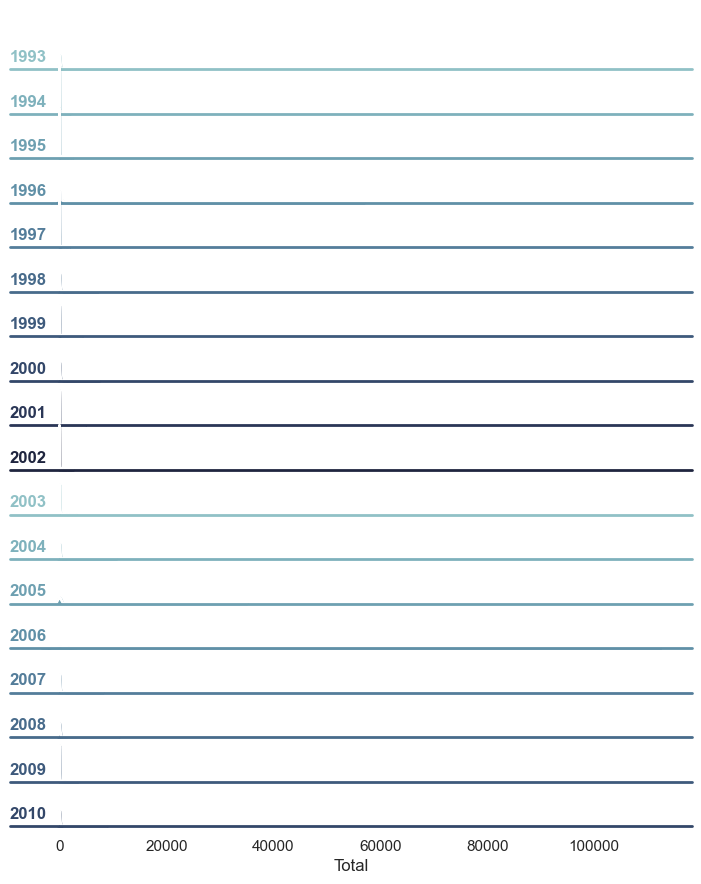

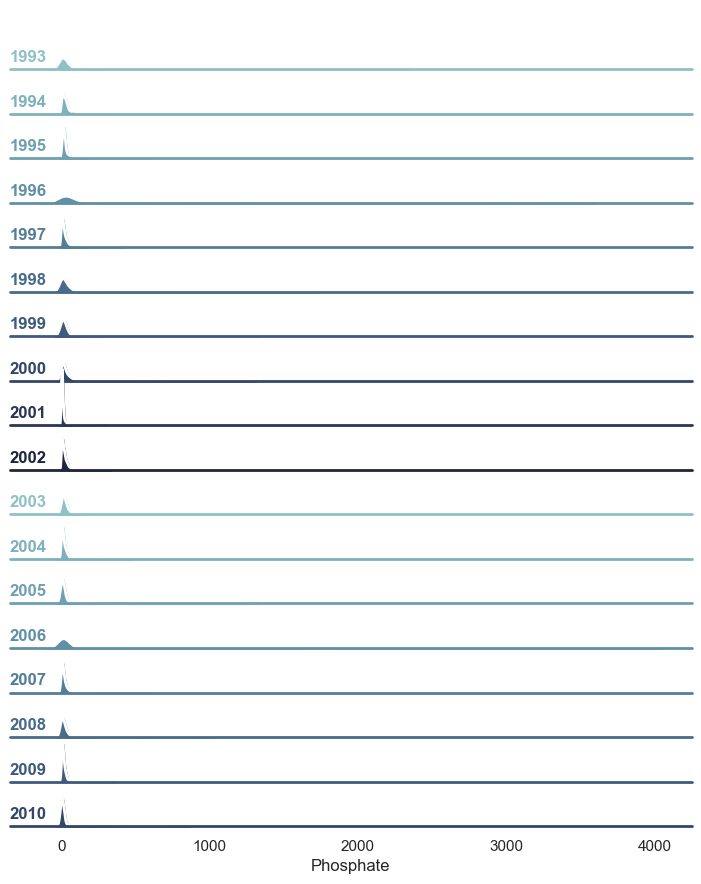

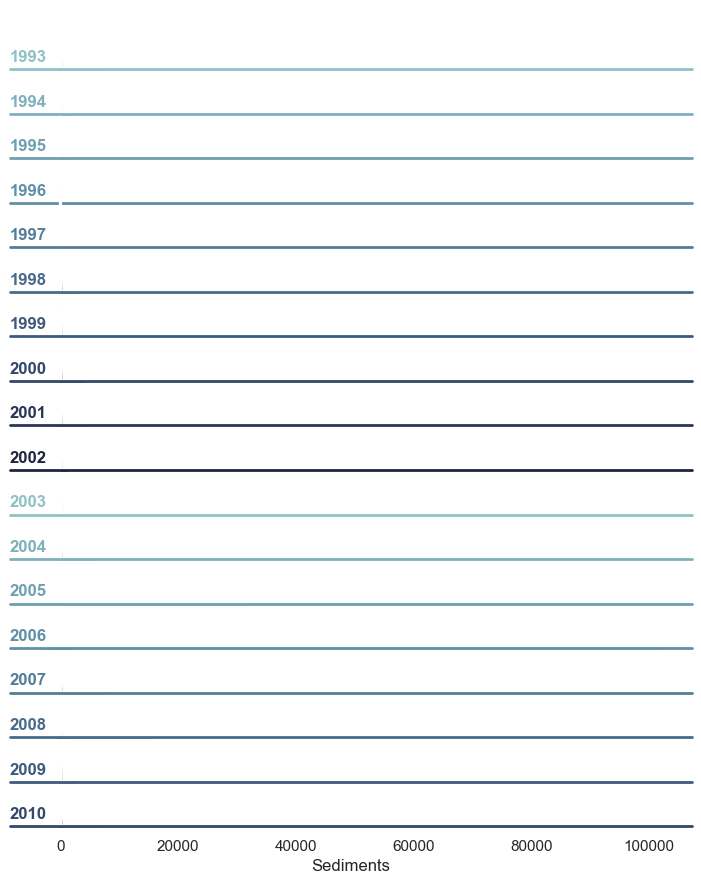

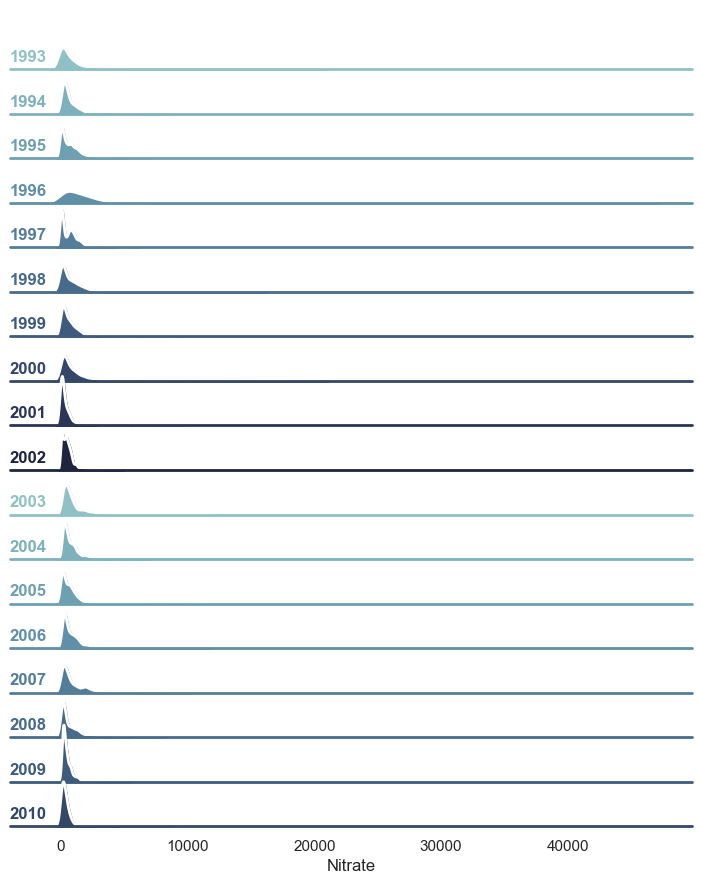

In [21]:
# Define the columns to analyze
columns_to_analyze = [
    "Total Phosphorus DlyLd(kg)",
    "Phosphate DlyLd(kg)",
    "Sediments DlyLd(kg*1000)",
    "Nitrate DlyLd(kg)"
]

# print quartiles for each column and number of values above q3 + 1.5 * iqr and below q1 - 1.5 * iqr
for column in columns_to_analyze:
    q1 = np.percentile(water_quality_data_post_1993[column], 25)
    q3 = np.percentile(water_quality_data_post_1993[column], 75)
    iqr = q3 - q1
    lower_bound = q1 - 3 * iqr
    upper_bound = q3 + 3 * iqr
    above_upper_bound = water_quality_data_post_1993[water_quality_data_post_1993[column] > upper_bound].shape[0]
    below_lower_bound = water_quality_data_post_1993[water_quality_data_post_1993[column] < lower_bound].shape[0]
    print(f"Column: {column}")
    print(f"Q1: {q1}")
    print(f"Q3: {q3}")
    print(f"IQR: {iqr}")
    print(f"Lower bound: {lower_bound}")
    print(f"Upper bound: {upper_bound}")

    print(f"Values below lower bound: {below_lower_bound}")
    print(f"Values above upper bound: {above_upper_bound}")
    print("percent of values that are outliers:", (above_upper_bound + below_lower_bound) / water_quality_data_post_1993.shape[0] * 100)
    print()

# create ridge plots for each column
for column in columns_to_analyze:
    plot_ridge(column, water_quality_data_post_1993)

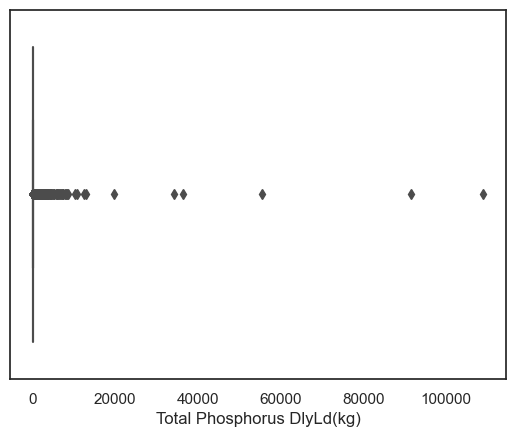

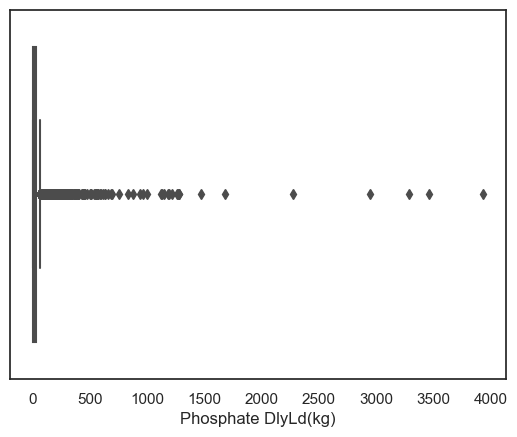

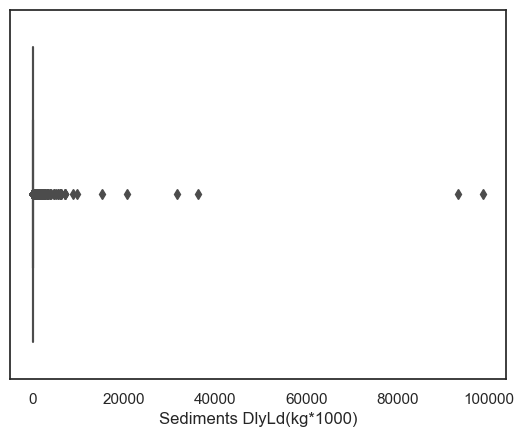

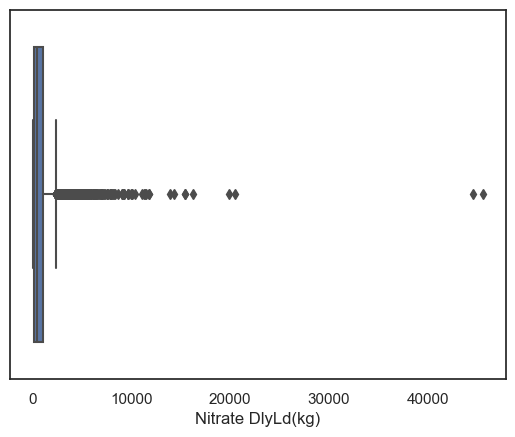

In [22]:

# plot box plots for each column
for column in columns_to_analyze:
    plt.figure()
    sns.boxplot(x=column, data=water_quality_data_post_1993)

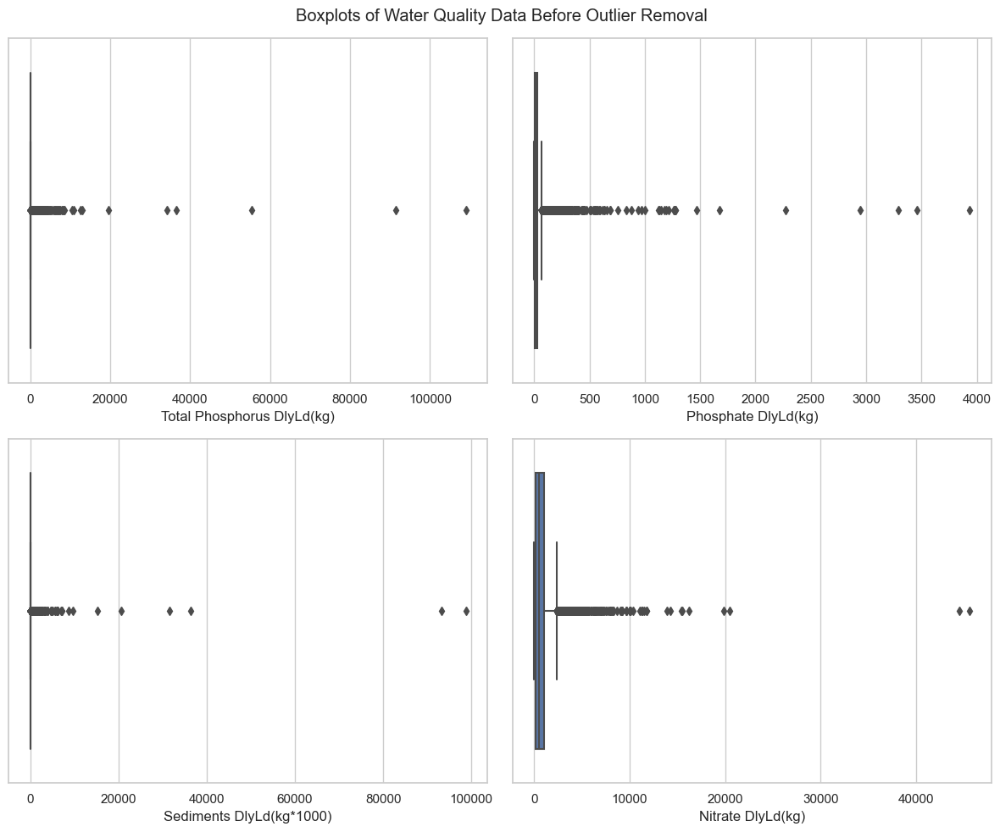

In [23]:
import seaborn as sns

# Set the theme
sns.set_theme(style="whitegrid")

fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(12, 10))

fig.suptitle("Boxplots of Water Quality Data Before Outlier Removal")
for ax, column in zip(axes.flatten(), columns_to_analyze):
    sns.boxplot(x=column, data=water_quality_data_post_1993, ax=ax)

plt.tight_layout()
plt.show()


In [24]:
def handle_outliers(dataset, target_column, threshold=4):
    data = dataset.copy()
    numeric_cols = data.select_dtypes(include=["float64", "int64"]).columns

    for col in numeric_cols:
        Q1 = data[col].quantile(0.25)
        Q3 = data[col].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - threshold * IQR
        upper_bound = Q3 + threshold * IQR

        # number of outliers in target column
        outliers = data[(data[col] < lower_bound) | (data[col] > upper_bound)]
        outliers_count = outliers.shape[0]

        # Cap the outliers
        data[col] = np.where(data[col] < lower_bound, lower_bound, data[col])
        data[col] = np.where(data[col] > upper_bound, upper_bound, data[col])

        
    
        

    return data, outliers_count

In [35]:
columns_to_analyze = [
    "Total Phosphorus DlyLd(kg)",
    "Phosphate DlyLd(kg)",
    "Sediments DlyLd(kg*1000)",
    "Nitrate DlyLd(kg)",
]
target_datasets = {}
outliers = {}
for column in columns_to_analyze:
# for target in targets:
    target_data = water_quality_data_post_1993[["DATE", column]]
    target_data, outlier_no = handle_outliers(target_data, column)
    target_datasets[column] = target_data
    outliers[column] = outlier_no

In [ ]:
# import pandas as pd

# thresholds = [1.5, 3, 4]  # List of thresholds to test

# results = {}

# for threshold in thresholds:
#     target_datasets = {}
#     outliers = {}
#     for target in targets:
#         target_data = water_quality_data_post_1993[["DATE", target]]
#         target_data, outlier_no = handle_outliers(
#             target_data, target, threshold=threshold
#         )
#         target_datasets[target] = target_data
#         outliers[target] = outlier_no

#     results[threshold] = {"target_datasets": target_datasets, "outliers": outliers}

# # Create a DataFrame to store the results
# results_df = pd.DataFrame(
#     columns=["Threshold", "Target", "Number of Outliers"]
# )

# for threshold, result in results.items():
#     for target in targets:
#         results_df = results_df.append(
#             {
#                 "Threshold": threshold,
#                 "Target": target,
#                 "Number of Outliers": result["outliers"][target],
#                 # "Dataset Shape": result["target_datasets"][target].shape,
#             },
#             ignore_index=True,
#         )


In [143]:
# remove outliers from dataset

# Define the columns to analyze
columns_to_analyze = [
    "Total Phosphorus DlyLd(kg)",
    "Phosphate DlyLd(kg)",
    "Sediments DlyLd(kg*1000)",
    "Nitrate DlyLd(kg)",
]

# remove outliers from dataset
target_datasets = {}
for column in columns_to_analyze:
    dataset = water_quality_data_post_1993[["DATE", column]]
    # number of rows in dataset before removing outliers
    q1 = np.percentile(dataset[column], 25)
    q3 = np.percentile(dataset[column], 75)
    iqr = q3 - q1
    lower_bound = q1 - 4 * iqr
    upper_bound = q3 + 4 * iqr
    target_datasets[column] = dataset[
        (dataset[column] >= lower_bound) & (dataset[column] <= upper_bound)
    ]
    # removed_outliers_target_datasets[column] = dataset
    # number of rows in dataset after outliers are removed
    print(
        f"Number of rows in dataset after removing outliers for {column}: {target_datasets[column].shape[0]}"
    )


Number of rows in dataset after removing outliers for Total Phosphorus DlyLd(kg): 6054
Number of rows in dataset after removing outliers for Phosphate DlyLd(kg): 6182
Number of rows in dataset after removing outliers for Sediments DlyLd(kg*1000): 5875
Number of rows in dataset after removing outliers for Nitrate DlyLd(kg): 6353


/var/folders/6l/d525srpn1tl8c1jw2pxxkr3m0000gn/T/ipykernel_95990/21470140.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.rename(columns={'YEAR': 'g', target:target.split()[0]}, inplace=True)
/Users/azamkhan/anaconda3/envs/nasa/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations.
  self._figure.tight_layout(*args, **kwargs)
/Users/azamkhan/anaconda3/envs/nasa/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations.
  self._figure.tight_layout(*args, **kwargs)
/Users/azamkhan/anaconda3/envs/nasa/lib/python3.11/site-packages/seaborn/axisgrid.py:118: U

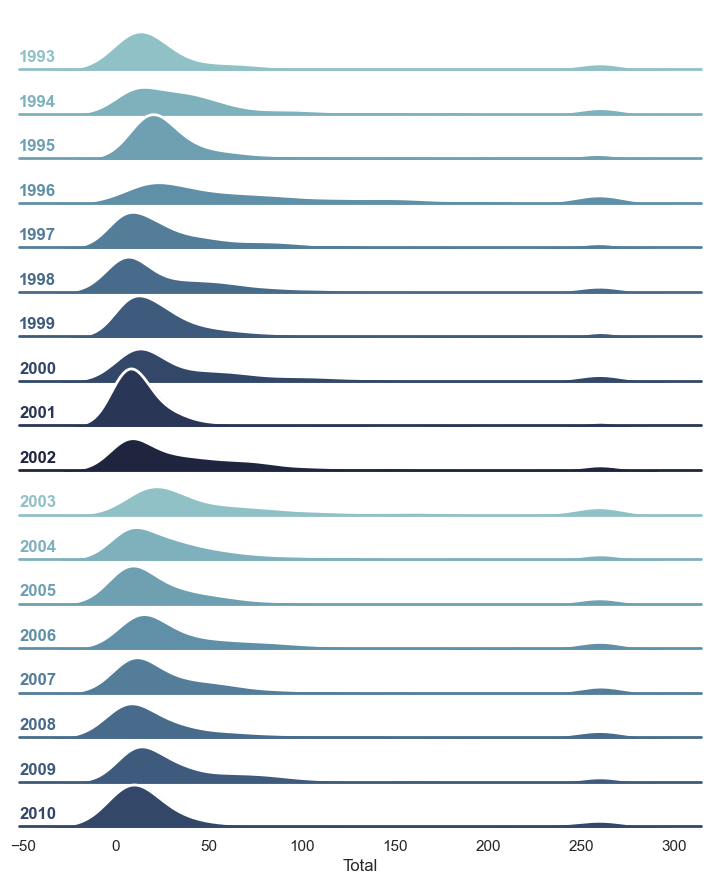

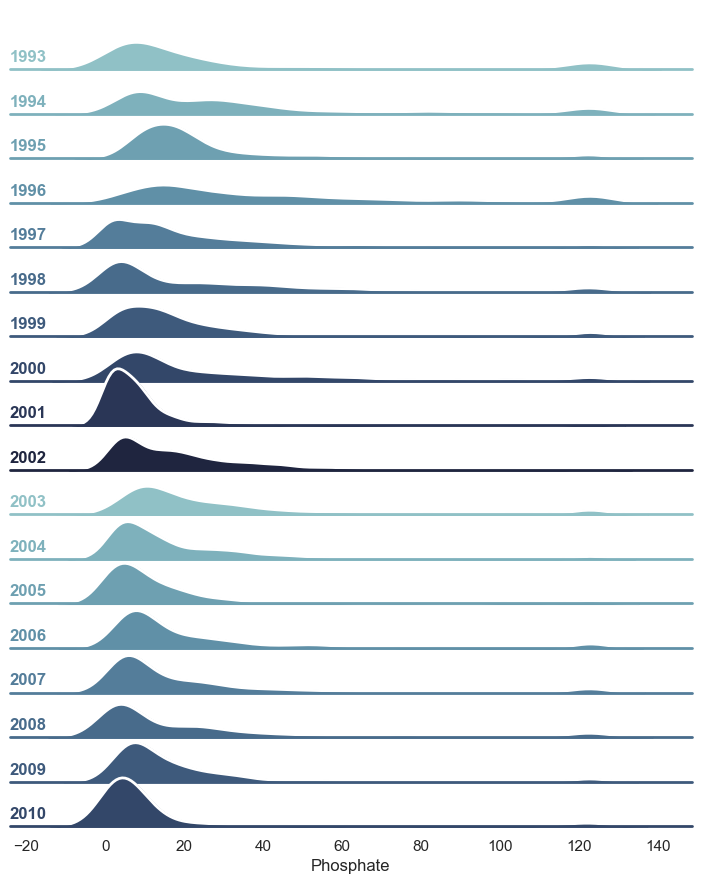

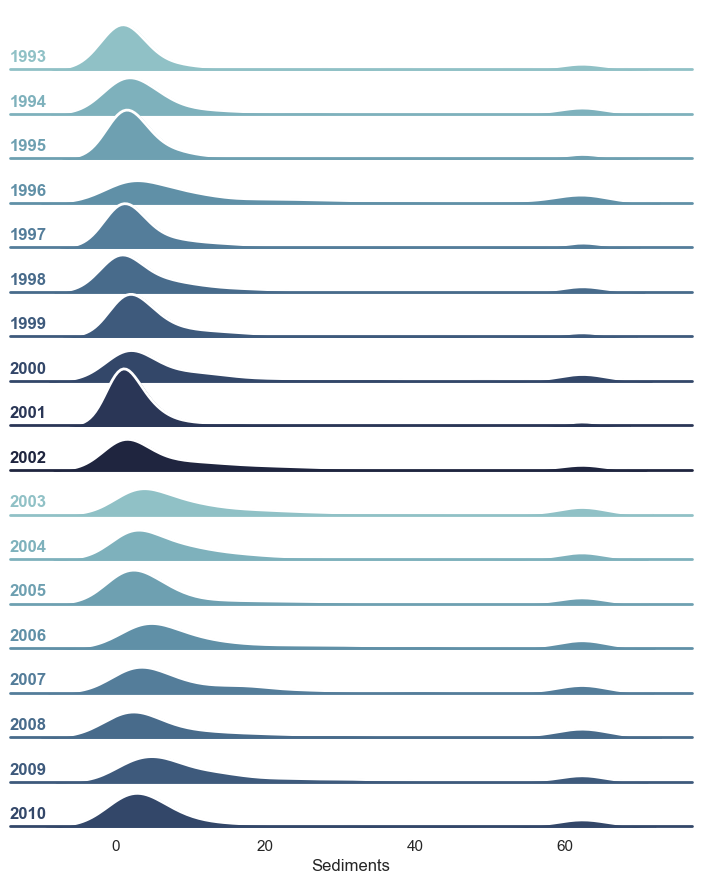

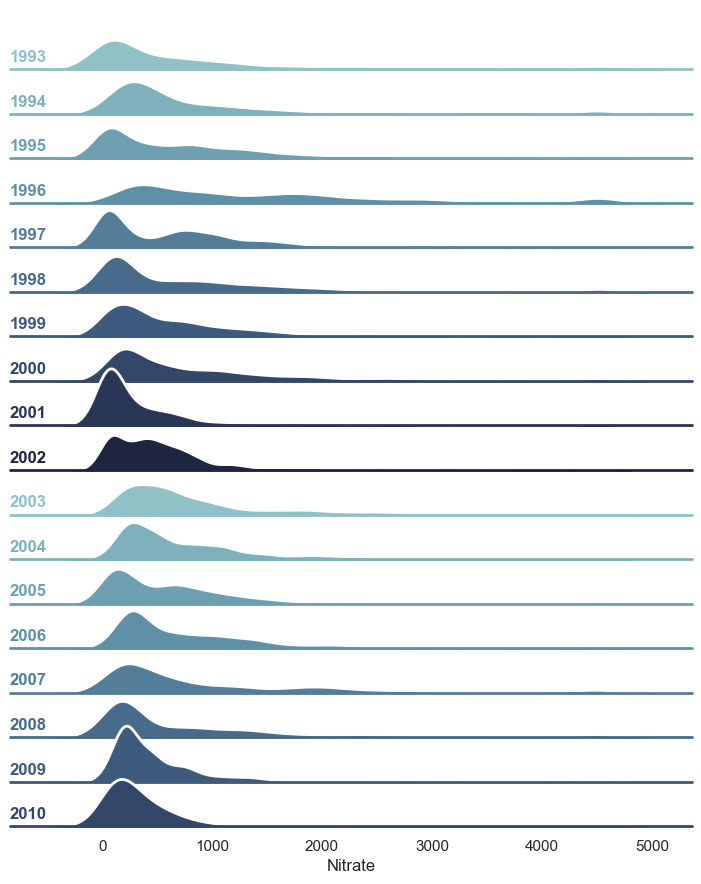

In [37]:
# create ridge plots for each column after removing outliers
for column in columns_to_analyze:
    plot_ridge(column, target_datasets[column])

In [38]:
water_quality_data_post_1993['month'] = pd.to_datetime(water_quality_data_post_1993['DATE']).dt.month
input_df["month"] = pd.to_datetime(input_df["date"]).dt.month

/var/folders/6l/d525srpn1tl8c1jw2pxxkr3m0000gn/T/ipykernel_95990/2149212536.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  water_quality_data_post_1993['month'] = pd.to_datetime(water_quality_data_post_1993['DATE']).dt.month


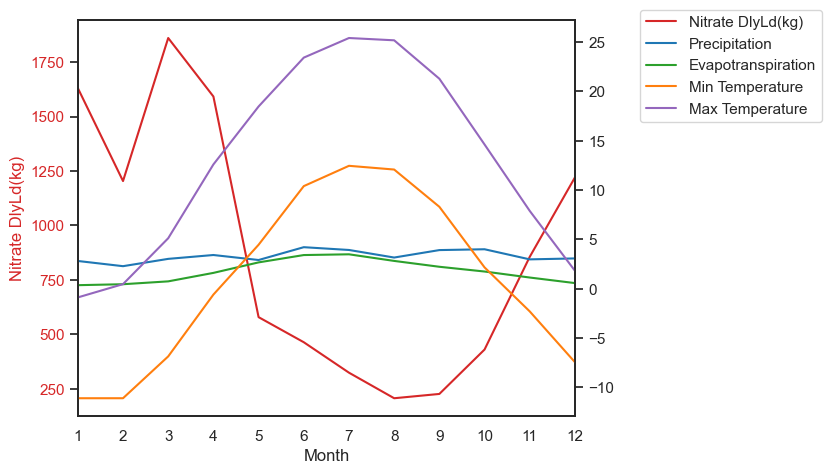

In [39]:
# plot the monthly average nitrate load alongside precipitation with separate y-axes

def plot_climate_vs_water_quality_monthly(target, water_quality_data, climate_data):
    wq_monthly_avg = (
        water_quality_data[[target, "month"]].groupby("month").mean()
    )
    wq_monthly_avg_df = pd.DataFrame(wq_monthly_avg).reset_index()
    

    precipitation_monthly_avg = climate_data.groupby("month")["Precipitation"].mean()
    precipitation_monthly_avg_df = pd.DataFrame(precipitation_monthly_avg).reset_index()

    evapotranspiration_monthly_avg = climate_data.groupby("month")["Evapotranspiration"].mean()
    evapotranspiration_monthly_avg_df = pd.DataFrame(evapotranspiration_monthly_avg).reset_index()

    min_temp_monthly_avg = climate_data.groupby("month")["MinT"].mean()
    min_temp_monthly_avg_df = pd.DataFrame(min_temp_monthly_avg).reset_index()

    max_temp_monthly_avg = climate_data.groupby("month")["MaxT"].mean()
    max_temp_monthly_avg_df = pd.DataFrame(max_temp_monthly_avg).reset_index()


    fig, ax1 = plt.subplots()

    color = 'tab:red'
    ax1.set_xlabel('Month')
    ax1.set_ylabel(target, color=color)
    ax1.plot(wq_monthly_avg_df['month'], wq_monthly_avg_df[target], color=color, label=target)
    ax1.tick_params(axis='y', labelcolor=color)
    ax1.set_xlim(1, 12)  # Set x-axis limits
    # show all months on x-axis
    ax1.set_xticks(range(1, 13))

    ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis

    color = 'tab:blue'
    ax2.plot(
        precipitation_monthly_avg_df["month"],
        precipitation_monthly_avg_df["Precipitation"],
        color=color,
        label='Precipitation'
    )
    ax2.tick_params(axis='y')

    color = 'tab:green'
    ax2.plot(
        evapotranspiration_monthly_avg_df["month"],
        evapotranspiration_monthly_avg_df["Evapotranspiration"],
        color=color,
        label='Evapotranspiration'
    )

    color = 'tab:orange'
    ax2.plot(
        min_temp_monthly_avg_df["month"],
        min_temp_monthly_avg_df["MinT"],
        color=color,
        label='Min Temperature'
    )

    color = 'tab:purple'
    ax2.plot(
        max_temp_monthly_avg_df["month"],
        max_temp_monthly_avg_df["MaxT"],
        color=color,
        label='Max Temperature'
    )

    
    fig.legend(loc='upper left', facecolor='white', bbox_to_anchor=(1, 1))
    fig.tight_layout()  # otherwise the right y-label is slightly clipped
    # plt.show()
    return

plot_climate_vs_water_quality_monthly(
    "Nitrate DlyLd(kg)", water_quality_data_post_1993, input_df
)


In [40]:
for key in target_datasets:
    target_datasets[key]['month'] = pd.to_datetime(target_datasets[key]['DATE']).dt.month

In [41]:
target_datasets["Nitrate DlyLd(kg)"]

,DATE,Nitrate DlyLd(kg),YEAR,month
458,1993-01-01,4517.30130,1993,1
459,1993-01-02,3446.03880,1993,1
460,1993-01-03,2764.18320,1993,1
461,1993-01-04,2182.01000,1993,1
462,1993-01-05,3680.86060,1993,1
...,...,...,...,...
6935,2010-09-26,42.99360,2010,9
6936,2010-09-27,51.18740,2010,9
6937,2010-09-28,139.32640,2010,9
6938,2010-09-29,889.93360,2010,9


In [42]:
water_quality_data_post_1993.columns

Index(['DATE', 'Total Phosphorus DlyLd(kg)', 'Phosphate DlyLd(kg)',
       'Sediments DlyLd(kg*1000)', 'Nitrate DlyLd(kg)', 'YEAR', 'month'],
      dtype='object')

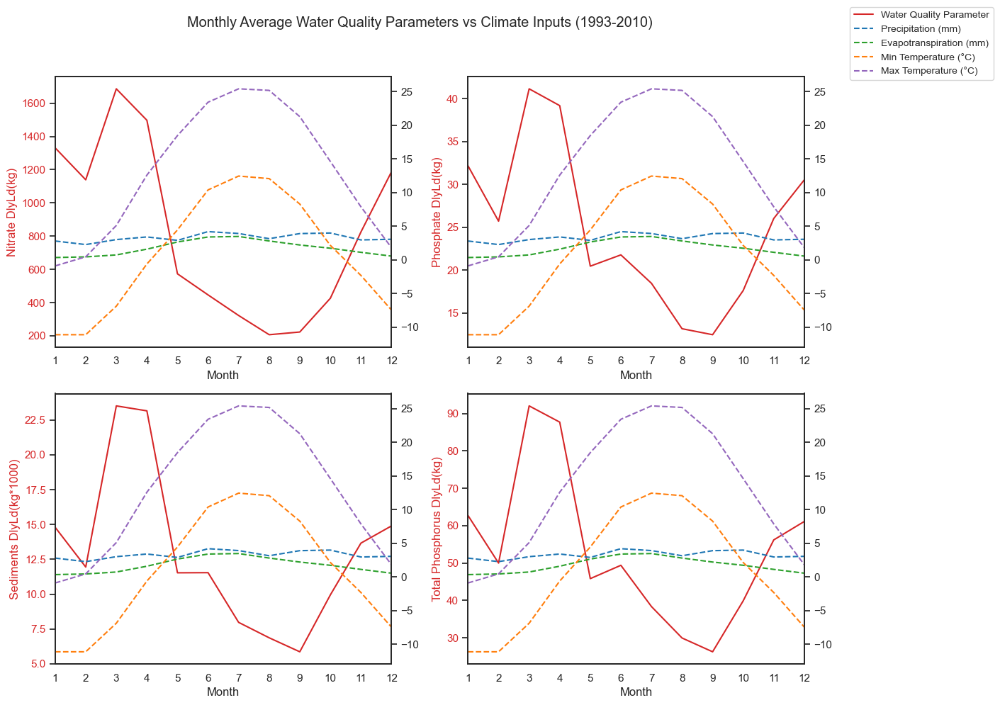

In [43]:
import matplotlib.pyplot as plt
import pandas as pd


def plot_climate_vs_water_quality_monthly(ax, target, water_quality_data, climate_data):
    wq_monthly_avg = (
        water_quality_data[[target, "month"]].groupby("month").mean().reset_index()
    )

    precipitation_monthly_avg = (
        climate_data.groupby("month")["Precipitation"].mean().reset_index()
    )
    evapotranspiration_monthly_avg = (
        climate_data.groupby("month")["Evapotranspiration"].mean().reset_index()
    )
    min_temp_monthly_avg = climate_data.groupby("month")["MinT"].mean().reset_index()
    max_temp_monthly_avg = climate_data.groupby("month")["MaxT"].mean().reset_index()

    # Primary y-axis
    color = "tab:red"
    ax.set_xlabel("Month")
    ax.set_ylabel(target, color=color)
    (line1,) = ax.plot(
        wq_monthly_avg["month"],
        wq_monthly_avg[target],
        color=color,
        label="Water Quality Parameter",
    )
    ax.tick_params(axis="y", labelcolor=color)
    ax.set_xlim(1, 12)
    ax.set_xticks(range(1, 13))
    ax.grid(False)  # Remove grid

    # Secondary y-axis
    ax2 = ax.twinx()

    (line2,) = ax2.plot(
        precipitation_monthly_avg["month"],
        precipitation_monthly_avg["Precipitation"],
        color="tab:blue",
        linestyle="--",
        label="Precipitation (mm)",
    )
    (line3,) = ax2.plot(
        evapotranspiration_monthly_avg["month"],
        evapotranspiration_monthly_avg["Evapotranspiration"],
        color="tab:green",
        linestyle="--",
        label="Evapotranspiration (mm)",
    )
    (line4,) = ax2.plot(
        min_temp_monthly_avg["month"],
        min_temp_monthly_avg["MinT"],
        color="tab:orange",
        linestyle="--",
        label="Min Temperature (°C)",
    )
    (line5,) = ax2.plot(
        max_temp_monthly_avg["month"],
        max_temp_monthly_avg["MaxT"],
        color="tab:purple",
        linestyle="--",
        label="Max Temperature (°C)",
    )

    ax2.tick_params(axis="y")
    ax2.grid(False)  # Remove grid

    return [line1, line2, line3, line4, line5]  # Return handles for the legend


# Create a 2x2 grid of subplots
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(12, 10))

targets = [
    "Nitrate DlyLd(kg)",
    "Phosphate DlyLd(kg)",
    "Sediments DlyLd(kg*1000)",
    "Total Phosphorus DlyLd(kg)",
]

all_handles = []  # Store handles from all subplots
for ax, target in zip(axes.flatten(), targets):
    handles = plot_climate_vs_water_quality_monthly(
        ax, target, target_datasets[target], input_df
    )
    all_handles.extend(handles)  # Collect handles from each subplot

# Get unique labels and handles (to avoid duplicates)
unique_handles = {h.get_label(): h for h in all_handles}.values()


# Place one legend for the entire figure
fig.legend(
    unique_handles,
    [h.get_label() for h in unique_handles],
    loc="upper left",
    bbox_to_anchor=(1, 1),
    ncol=1,
    fontsize=10,
    facecolor="white",
)

fig.suptitle("Monthly Average Water Quality Parameters vs Climate Inputs (1993-2010)")


fig.tight_layout(rect=[0, 0, 1, 0.95])  # Adjust layout to fit legend
plt.show()


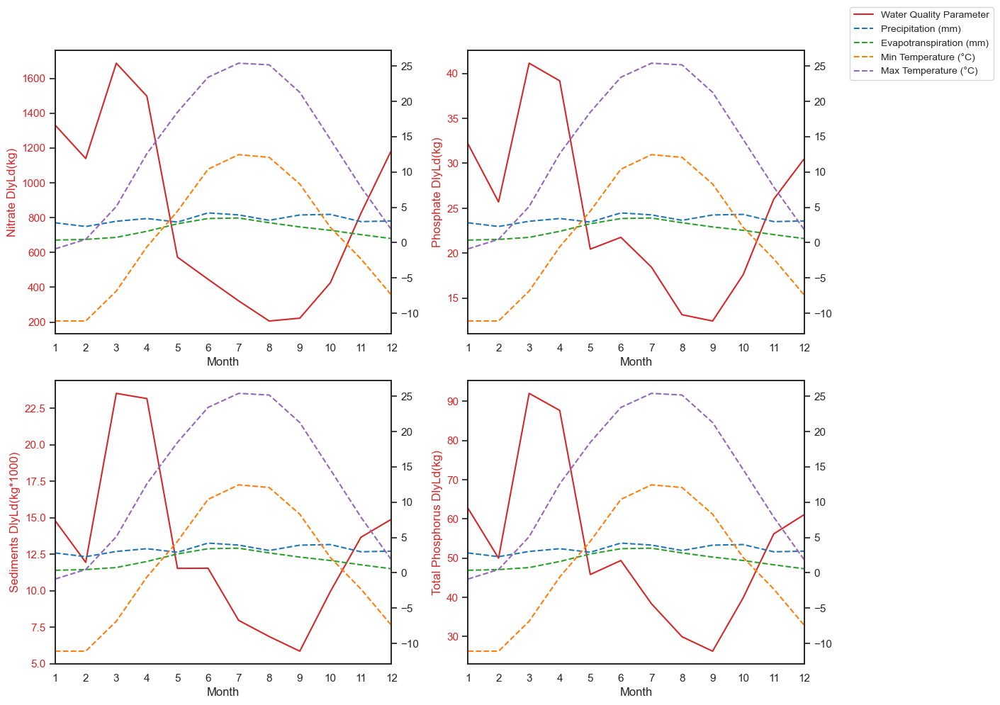

In [44]:
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(12, 10))

targets = [
    "Nitrate DlyLd(kg)",
    "Phosphate DlyLd(kg)",
    "Sediments DlyLd(kg*1000)",
    "Total Phosphorus DlyLd(kg)",
]

all_handles = []  # Store handles from all subplots
for ax, target in zip(axes.flatten(), targets):
    handles = plot_climate_vs_water_quality_monthly(
        ax, target, target_datasets[target], input_df
    )
    all_handles.extend(handles)  # Collect handles from each subplot

# Get unique labels and handles (to avoid duplicates)
unique_handles = {h.get_label(): h for h in all_handles}.values()


# Place one legend for the entire figure
fig.legend(
    unique_handles,
    [h.get_label() for h in unique_handles],
    loc="upper left",
    bbox_to_anchor=(1, 1),
    ncol=1,
    fontsize=10,
    facecolor="white",
)

fig.tight_layout(rect=[0, 0, 1, 0.95])  # Adjust layout to fit legend
plt.show()


### Experiment 1) Using observed streamflow to make water quality predictions

#### Model training

In [45]:
# Define the hyperparameter distribution for Random Forest
param_dist = {
    "n_estimators": sp_randint(100, 1000),
    "max_features": [0.5, 0.75, 1.0, "sqrt", "log2"],
    "min_samples_split": sp_randint(2, 5),
    "min_samples_leaf": sp_randint(1, 20),
}

# Assuming training data and target data are already defined as per your context
# Merge training data with streamflow output (using date)
training_data = pd.merge(
    input_df, streamflow_output_data, left_on="date", right_on="Date"
).drop(columns=["Date"])

# Define the target variables
targets = ["Phosphate DlyLd(kg)", "Nitrate DlyLd(kg)", "Sediments DlyLd(kg*1000)"]

# Define the Random Forest Regressor model
rf_model = RandomForestRegressor(random_state=42)


# Perform randomized hyperparameter search on train + validation set
n_iter_search = 7  # Number of parameter settings to sample
random_search = RandomizedSearchCV(
    rf_model,
    param_distributions=param_dist,
    cv=5,
    n_iter=n_iter_search,
    n_jobs=-1,
    verbose=3,
)

# Run experiments for each target variable
results = {target: {} for target in targets}
model_preds = {}
y_tests = {}
x_tests = {}
for target in targets:
    mlflow.set_experiment(f"Initial Experiments")
    with mlflow.start_run(run_name=f"{target.split()[0]}_Observed_Streamflow_rf"):
    # Merge with water quality data
        train = pd.merge(
            training_data, target_datasets[target], left_on="date", right_on="DATE"
        ).drop(columns=["DATE"])

        # Define input features (X) and target (y)
        X = train.drop(
            columns=[
                "date",
                target
            ]
        )

        y = train[[target]]

        # Split the data into train (60%), validation (20%), and test (20%) sets
        X_train, X_temp, y_train, y_temp = train_test_split(
            X, y, test_size=0.3, random_state=42, shuffle=False
        )
        X_val, X_test, y_val, y_test = train_test_split(
            X_temp, y_temp, test_size=0.5, random_state=42, shuffle=False
        )
        y_tests[target] = y_test
        

        #print size of each dataset
        print(f"Size of training dataset for target variable {target}: {X_train.shape[0]}")
        print(f"Size of validation dataset for target variable {target}: {X_val.shape[0]}")
        print(f"Size of test dataset for target variable {target}: {X_test.shape[0]}")

        # Standardize the data (train/val/test separately)
        scaler = StandardScaler()
        X_train = scaler.fit_transform(X_train)
        X_val = scaler.transform(X_val)
        X_test = scaler.transform(X_test)

        x_tests[target] = X_test

        # Hyperparameter tuning on training and validation data
        # random_search.fit(X_train, y_train[target])
        
        # mlflow.log_params(random_search.best_params_)

        # # Best model after RandomizedSearchCV
        # best_rf_model = random_search.best_estimator_
        best_params = hyperopt_rf_tuning(X_train, y_train[target])
        print(f"Best hyperparameters for target variable {target}: {best_params}")
        best_rf_model = RandomForestRegressor(**best_params, random_state=42)
        

        # Retrain the best model on combined train + val data
        X_train_val = np.vstack([X_train, X_val])
        y_train_val = np.hstack([y_train[target], y_val[target]])
        best_rf_model.fit(X_train_val, y_train_val)

        # Evaluate the model on the test set
        y_pred = best_rf_model.predict(X_test)
        model_preds[target] = y_pred

        # Calculate performance metrics
        r2 = r2_score(y_test[target], y_pred)
        nse = nse_score(y_test[target], y_pred)
        pbias = pbias_score(y_test[target], y_pred)

        mlflow.log_metrics({"R2": r2, "NSE": nse, "PBIAS": pbias})

        # Store feature importances for Random Forest
        feature_importances = best_rf_model.feature_importances_
        results[target] = {
            "NSE": nse,
            "PBIAS": pbias,
            "R2": r2,
            "Feature Importances": feature_importances,
        }
        mlflow.sklearn.log_model(best_rf_model, "model")

# Print the final results for all target variables
pprint(results)


Size of training dataset for target variable Phosphate DlyLd(kg): 4534
Size of validation dataset for target variable Phosphate DlyLd(kg): 972
Size of test dataset for target variable Phosphate DlyLd(kg): 972
100%|██████████| 50/50 [01:42<00:00,  2.05s/trial, best loss: 11.949696825353842]
Best hyperparameters for target variable Phosphate DlyLd(kg): {'n_estimators': 210, 'max_depth': 20, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'log2'}


2025/02/24 17:59:56 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Size of training dataset for target variable Nitrate DlyLd(kg): 4534
Size of validation dataset for target variable Nitrate DlyLd(kg): 972
Size of test dataset for target variable Nitrate DlyLd(kg): 972
100%|██████████| 50/50 [01:38<00:00,  1.96s/trial, best loss: 6422.916187000769] 
Best hyperparameters for target variable Nitrate DlyLd(kg): {'n_estimators': 280, 'max_depth': 24, 'min_samples_split': 3, 'min_samples_leaf': 1, 'max_features': None}


2025/02/24 18:01:41 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Size of training dataset for target variable Sediments DlyLd(kg*1000): 4534
Size of validation dataset for target variable Sediments DlyLd(kg*1000): 972
Size of test dataset for target variable Sediments DlyLd(kg*1000): 972
100%|██████████| 50/50 [01:44<00:00,  2.10s/trial, best loss: 8.260389966987475] 
Best hyperparameters for target variable Sediments DlyLd(kg*1000): {'n_estimators': 300, 'max_depth': 27, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': None}


2025/02/24 18:03:33 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


{'Nitrate DlyLd(kg)': {'Feature Importances': array([0.02914893, 0.00751374, 0.04191077, 0.0109535 , 0.01209641,
       0.00260095, 0.84130557, 0.05233984, 0.0021303 ]),
                       'NSE': 0.8229947070098569,
                       'PBIAS': 24.319428326816045,
                       'R2': 0.7927015286071225},
 'Phosphate DlyLd(kg)': {'Feature Importances': array([0.05309128, 0.04203662, 0.03011395, 0.04340001, 0.03938692,
       0.01834662, 0.66941444, 0.08338847, 0.02082169]),
                         'NSE': 0.8166492214999281,
                         'PBIAS': 2.8894746623864274,
                         'R2': 0.8678624458495221},
 'Sediments DlyLd(kg*1000)': {'Feature Importances': array([0.03319562, 0.02888004, 0.02775541, 0.02786236, 0.0525176 ,
       0.00404872, 0.7977847 , 0.02374566, 0.00420988]),
                              'NSE': 0.7286341221779218,
                              'PBIAS': -1.73964052804968,
                              'R2': 0.8072314709619367}}

#### Evaluation

##### Metrics

In [46]:
# create dataframe for exp3_results only showing the metrics
results_df = pd.DataFrame(results).T.drop(columns=["Feature Importances"])
results_df

,NSE,PBIAS,R2
Phosphate DlyLd(kg),0.816649,2.889475,0.867862
Nitrate DlyLd(kg),0.822995,24.319428,0.792702
Sediments DlyLd(kg*1000),0.728634,-1.739641,0.807231


##### Feature Importances

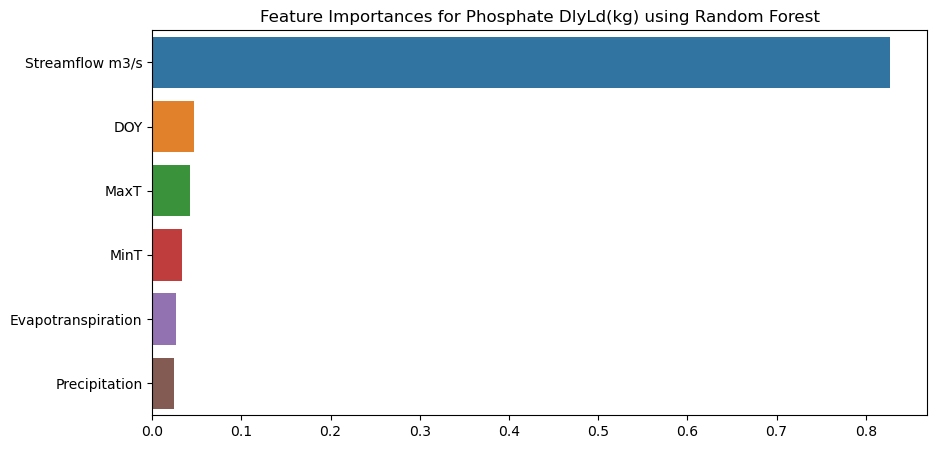

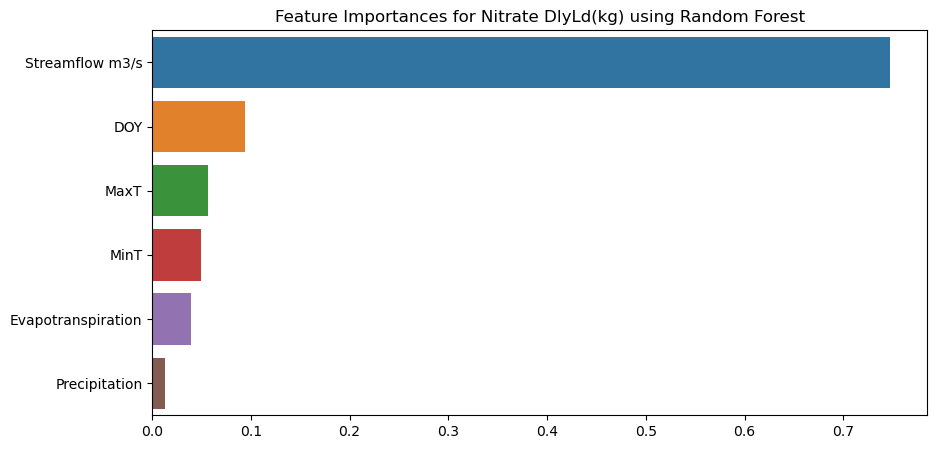

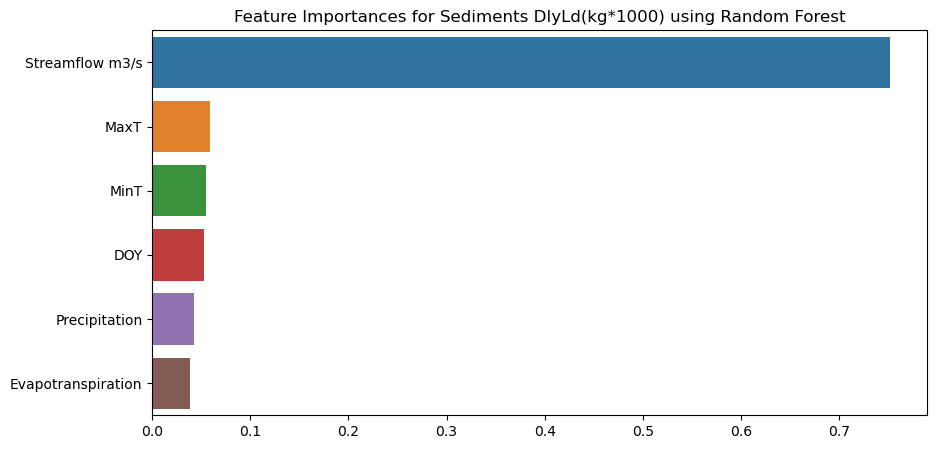

In [20]:
# plot feature importances and arrange them in descending order
for target in targets:
   
    feature_importances = results[target]["Feature Importances"]
    sorted_indices = np.argsort(feature_importances)[::-1]
    sorted_features = X.columns[sorted_indices]
    sorted_importances = feature_importances[sorted_indices]

    plt.figure(figsize=(10, 5))
    sns.barplot(x=sorted_importances, y=sorted_features)
    plt.title(f"Feature Importances for {target} using Random Forest")
    plt.show()

##### Actual vs Predicted

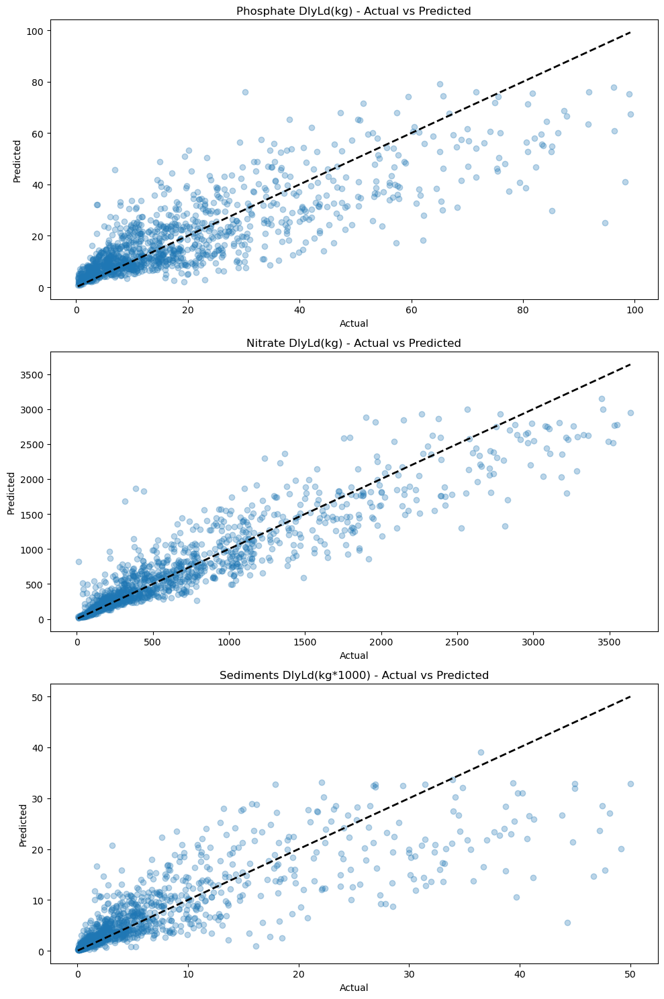

In [22]:
# Plotting the results
fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(10, 15))

for i, target in enumerate(targets):
    ax = axes[i]
    ax.scatter(y_tests[target][target], model_preds[target], alpha=0.3)
    ax.plot([y_tests[target][target].min(), y_tests[target][target].max()], [y_tests[target][target].min(), y_tests[target][target].max()], 'k--', lw=2)
    ax.set_xlabel('Actual')
    ax.set_ylabel('Predicted')
    ax.set_title(f'{target} - Actual vs Predicted')

plt.tight_layout()
plt.show()

##### Line Chart

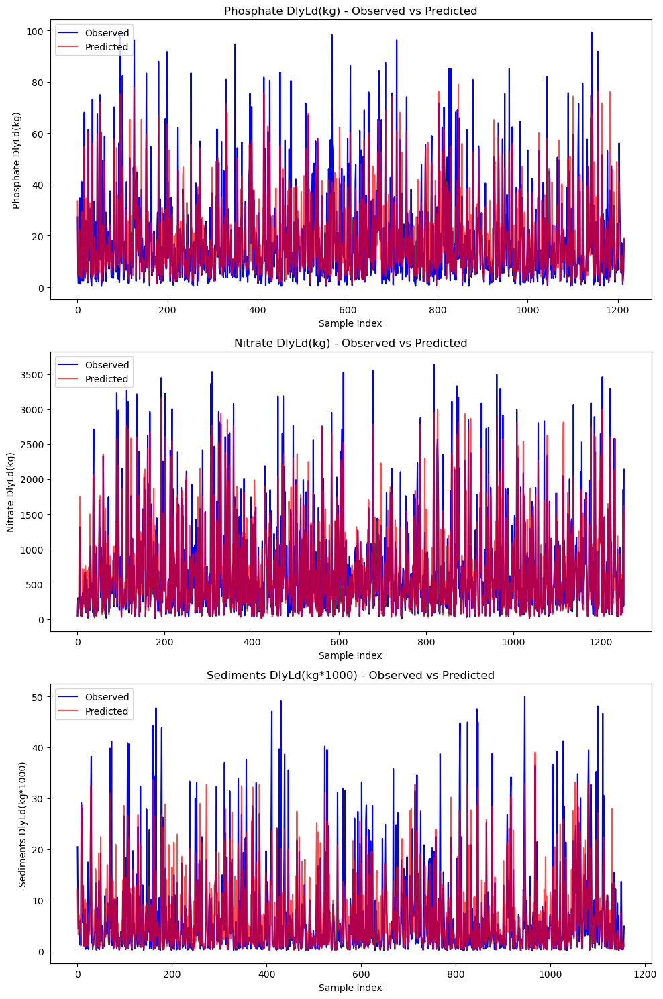

In [23]:
# Plotting the results
fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(10, 15))

for i, target in enumerate(targets):
    ax = axes[i]
    ax.plot(y_tests[target][target].values, label='Observed', color='blue')
    ax.plot(model_preds[target], label='Predicted', color='red', alpha=0.7)
    ax.set_xlabel('Sample Index')
    ax.set_ylabel(target)
    ax.set_title(f'{target} - Observed vs Predicted')
    ax.legend()

plt.tight_layout()
plt.show()

### Experiment 2) Using SWAT streamflow to make water quality predictions

#### Model Training

In [47]:
training_data = pd.merge(
    input_df, swat_simulations, left_on="date", right_on="Date"
).drop(columns=["Date", "SWAT_Sediments (tons)", "SWAT_Nitrate (kg)", "SWAT_Phosphate (kg)"])

training_data

,DOY,Precipitation,Evapotranspiration,MaxT,MinT,date,month,SWAT_Flow (m3/s)
0,1,0.330769,0.517,2.445385,-10.748462,1993-01-01,1,19.73
1,2,0.101538,0.402,-3.736154,-10.940769,1993-01-02,1,17.11
2,3,1.456923,0.782,1.354615,-10.342308,1993-01-03,1,16.02
3,4,5.001538,0.378,8.511538,-1.980769,1993-01-04,1,19.13
4,5,12.960000,0.412,10.614615,-5.325385,1993-01-05,1,25.58
...,...,...,...,...,...,...,...,...
6477,269,0.176923,0.786,18.566923,7.568462,2010-09-30,9,142.00
6478,270,10.595385,1.170,19.443846,10.580769,2010-10-01,10,242.40
6479,271,6.947692,2.150,22.430000,9.900769,2010-10-02,10,222.60
6480,272,3.652308,2.320,21.366923,9.922308,2010-10-03,10,169.30


In [48]:
# Define the hyperparameter distribution for Random Forest
param_dist = {
    "n_estimators": sp_randint(100, 1000),
    "max_features": [0.5, 0.75, 1.0, "sqrt", "log2"],
    "min_samples_split": sp_randint(2, 5),
    "min_samples_leaf": sp_randint(1, 20),
}

# Assuming training data and target data are already defined as per your context
# Merge training data with streamflow output (using date)
training_data = pd.merge(
    input_df, swat_simulations, left_on="date", right_on="Date"
).drop(columns=["Date", "SWAT_Sediments (tons)", "SWAT_Nitrate (kg)", "SWAT_Phosphate (kg)"])

# Define the target variables
targets = ["Phosphate DlyLd(kg)", "Nitrate DlyLd(kg)", "Sediments DlyLd(kg*1000)"]

# Define the Random Forest Regressor model
rf_model = RandomForestRegressor(random_state=42)

# Perform randomized hyperparameter search on train + validation set
n_iter_search = 7  # Number of parameter settings to sample
random_search = RandomizedSearchCV(
    rf_model,
    param_distributions=param_dist,
    cv=5,
    n_iter=n_iter_search,
    n_jobs=-1,
    verbose=3,
)

# Run experiments for each target variable
exp2_results = {target: {} for target in targets}
exp2_model_preds = {}
exp2_y_tests = {}
for target in targets:

    mlflow.set_experiment(f"Initial Experiments")
    with mlflow.start_run(run_name=f"{target.split()[0]}_Uncal_SWAT_Only_Streamflow_rf"):
    # Merge with water quality data
        train = pd.merge(
            training_data, target_datasets[target], left_on="date", right_on="DATE"
        ).drop(columns=["DATE"])

        # Define input features (X) and target (y)
        X = train.drop(
            columns=[
                "date",
                target
            ]
        )

        y = train[[target]]

        # Split the data into train (60%), validation (20%), and test (20%) sets
        X_train, X_temp, y_train, y_temp = train_test_split(
            X, y, test_size=0.3, random_state=42, shuffle=False
        )
        X_val, X_test, y_val, y_test = train_test_split(
            X_temp, y_temp, test_size=0.5, random_state=42, shuffle=False
        )
        exp2_y_tests[target] = y_test

        #print size of each dataset
        print(f"Size of training dataset for target variable {target}: {X_train.shape[0]}")
        print(f"Size of validation dataset for target variable {target}: {X_val.shape[0]}")
        print(f"Size of test dataset for target variable {target}: {X_test.shape[0]}")

        # Standardize the data (train/val/test separately)
        scaler = StandardScaler()
        X_train = scaler.fit_transform(X_train)
        X_val = scaler.transform(X_val)
        X_test = scaler.transform(X_test)

        # Hyperparameter tuning on training and validation data
        # random_search.fit(X_train, y_train[target])

        # mlflow.log_params(random_search.best_params_)

        # # Best model after RandomizedSearchCV
        # best_rf_model = random_search.best_estimator_
        best_params = hyperopt_rf_tuning(X_train, y_train[target])
        print(f"Best hyperparameters for target variable {target}: {best_params}")
        best_rf_model = RandomForestRegressor(**best_params, random_state=42)

        # Retrain the best model on combined train + val data
        X_train_val = np.vstack([X_train, X_val])
        y_train_val = np.hstack([y_train[target], y_val[target]])
        best_rf_model.fit(X_train_val, y_train_val)

        # Evaluate the model on the test set
        y_pred = best_rf_model.predict(X_test)
        exp2_model_preds[target] = y_pred

        # Calculate performance metrics
        nse = nse_score(y_test[target], y_pred)
        pbias = pbias_score(y_test[target], y_pred)
        r2 = r2_score(y_test[target], y_pred)

        mlflow.log_metrics({"R2": r2, "NSE": nse, "PBIAS": pbias})

        # Store feature importances for Random Forest
        feature_importances = best_rf_model.feature_importances_
        exp2_results[target] = {
            "NSE": nse,
            "PBIAS": pbias,
            "R2": r2,
            "Feature Importances": feature_importances,
        }
        mlflow.sklearn.log_model(best_rf_model, "model")

# Print the final exp2_results for all target variables
pprint(exp2_results)

Size of training dataset for target variable Phosphate DlyLd(kg): 4534
Size of validation dataset for target variable Phosphate DlyLd(kg): 972
Size of test dataset for target variable Phosphate DlyLd(kg): 972
100%|██████████| 50/50 [01:28<00:00,  1.76s/trial, best loss: 26.228562541709145]
Best hyperparameters for target variable Phosphate DlyLd(kg): {'n_estimators': 300, 'max_depth': 18, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': None}


2025/02/24 18:05:11 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Size of training dataset for target variable Nitrate DlyLd(kg): 4534
Size of validation dataset for target variable Nitrate DlyLd(kg): 972
Size of test dataset for target variable Nitrate DlyLd(kg): 972
100%|██████████| 50/50 [01:46<00:00,  2.12s/trial, best loss: 17956.87155870532] 
Best hyperparameters for target variable Nitrate DlyLd(kg): {'n_estimators': 300, 'max_depth': 27, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': None}


2025/02/24 18:07:04 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Size of training dataset for target variable Sediments DlyLd(kg*1000): 4534
Size of validation dataset for target variable Sediments DlyLd(kg*1000): 972
Size of test dataset for target variable Sediments DlyLd(kg*1000): 972
100%|██████████| 50/50 [01:37<00:00,  1.94s/trial, best loss: 13.106891205082807]
Best hyperparameters for target variable Sediments DlyLd(kg*1000): {'n_estimators': 300, 'max_depth': 18, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': None}


2025/02/24 18:08:50 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


{'Nitrate DlyLd(kg)': {'Feature Importances': array([0.19853116, 0.02363753, 0.03506652, 0.06743115, 0.03831402,
       0.0370897 , 0.49044807, 0.07421893, 0.03526292]),
                       'NSE': 0.516633596895878,
                       'PBIAS': 29.87266691106365,
                       'R2': 0.5087589399114393},
 'Phosphate DlyLd(kg)': {'Feature Importances': array([0.08441019, 0.03363005, 0.0571018 , 0.04152295, 0.04091023,
       0.01210513, 0.62090086, 0.09868705, 0.01073174]),
                         'NSE': 0.34185888487350236,
                         'PBIAS': 4.2309930225724415,
                         'R2': 0.5747738045351033},
 'Sediments DlyLd(kg*1000)': {'Feature Importances': array([0.12382374, 0.04164117, 0.0441984 , 0.04748662, 0.06250103,
       0.00584324, 0.61992884, 0.04831617, 0.00626079]),
                              'NSE': 0.41096370692248896,
                              'PBIAS': 1.7838535018271278,
                              'R2': 0.6613377166595271}

#### Evaluation

##### Metrics

In [49]:
# create dataframe for exp3_results only showing the metrics
exp2_results_df = pd.DataFrame(exp2_results).T.drop(columns=["Feature Importances"])
exp2_results_df

,NSE,PBIAS,R2
Phosphate DlyLd(kg),0.341859,4.230993,0.574774
Nitrate DlyLd(kg),0.516634,29.872667,0.508759
Sediments DlyLd(kg*1000),0.410964,1.783854,0.661338


##### Feature Importances

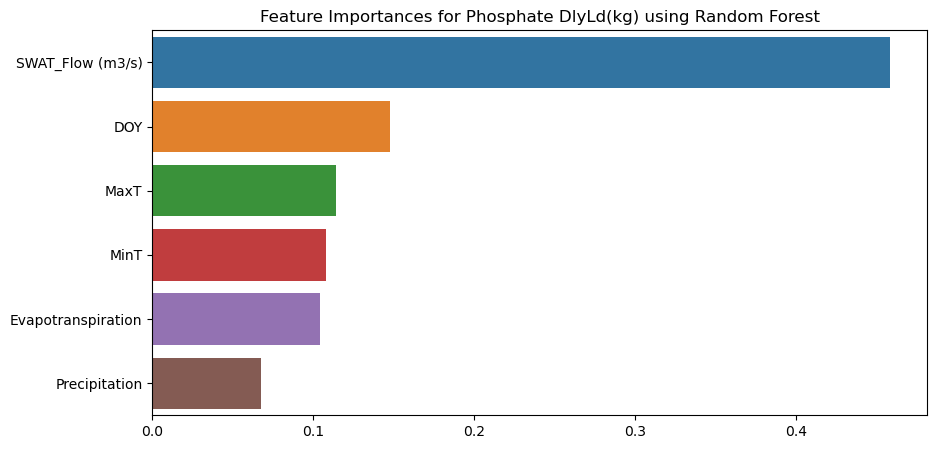

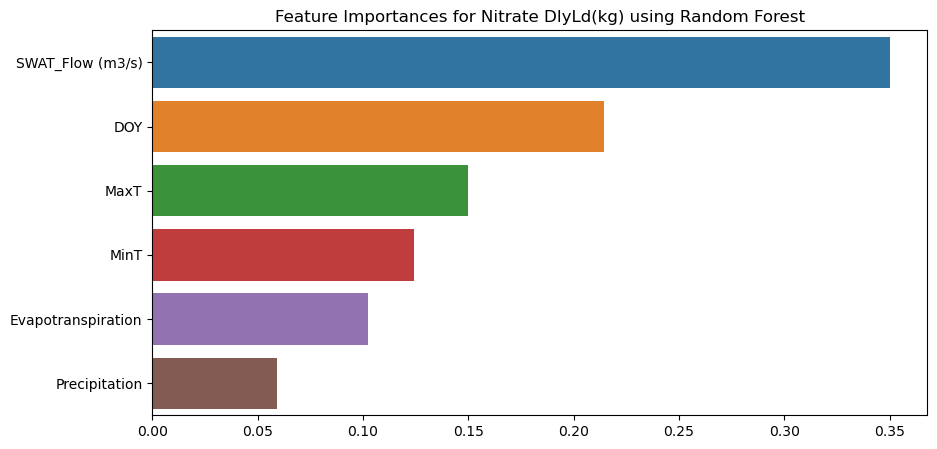

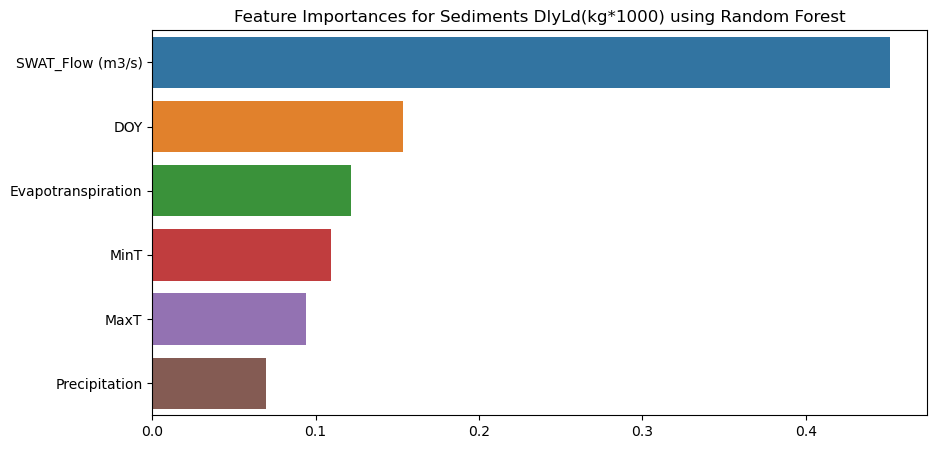

In [48]:
# plot feature importances and arrange them in descending order
for target in targets:
   
    feature_importances = exp2_results[target]["Feature Importances"]
    sorted_indices = np.argsort(feature_importances)[::-1]
    sorted_features = X.columns[sorted_indices]
    sorted_importances = feature_importances[sorted_indices]

    plt.figure(figsize=(10, 5))
    sns.barplot(x=sorted_importances, y=sorted_features)
    plt.title(f"Feature Importances for {target} using Random Forest")
    plt.show()

##### Actual vs Predicted

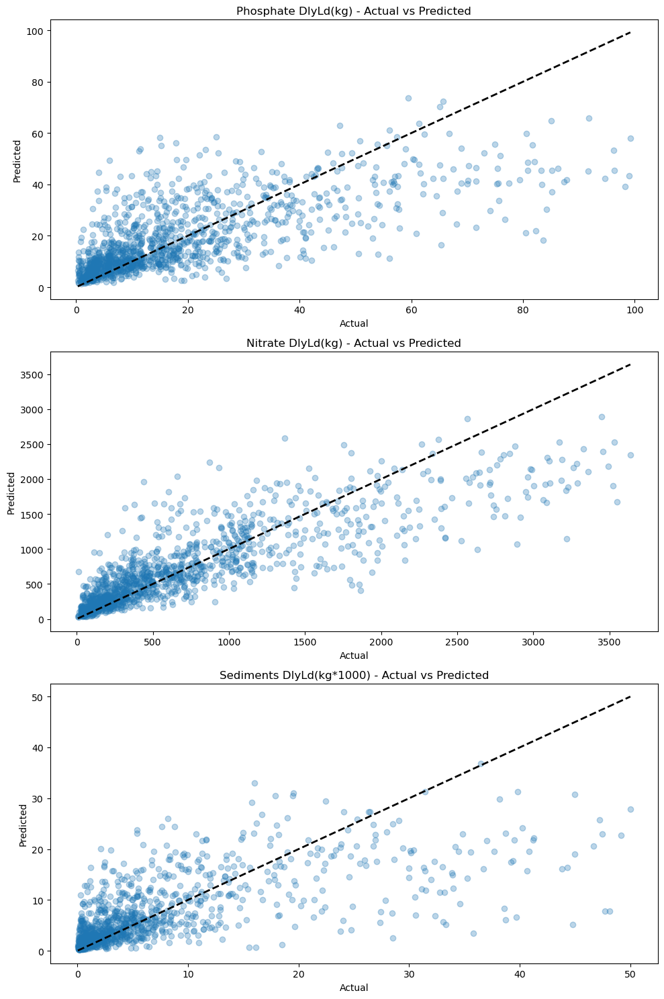

In [49]:
# Plotting the results
fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(10, 15))

for i, target in enumerate(targets):
    ax = axes[i]
    ax.scatter(exp2_y_tests[target][target], exp2_model_preds[target], alpha=0.3)
    ax.plot([exp2_y_tests[target][target].min(), exp2_y_tests[target][target].max()], [exp2_y_tests[target][target].min(), exp2_y_tests[target][target].max()], 'k--', lw=2)
    ax.set_xlabel('Actual')
    ax.set_ylabel('Predicted')
    ax.set_title(f'{target} - Actual vs Predicted')

plt.tight_layout()
plt.show()

##### Line Chart

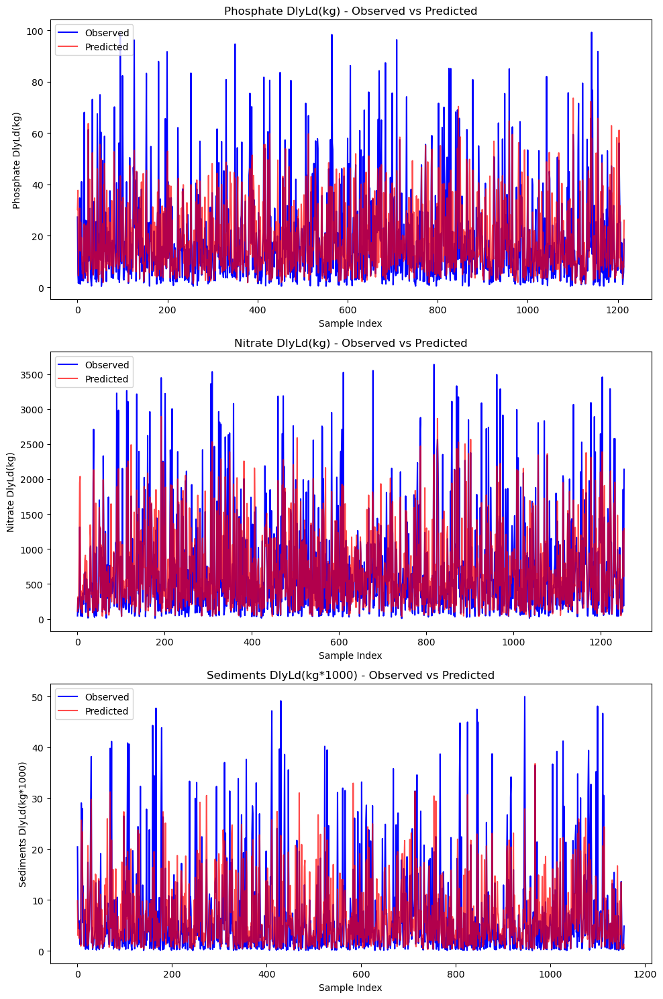

In [50]:
# Plotting the results
fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(10, 15))

for i, target in enumerate(targets):
    ax = axes[i]
    ax.plot(exp2_y_tests[target][target].values, label='Observed', color='blue')
    ax.plot(exp2_model_preds[target], label='Predicted', color='red', alpha=0.7)
    ax.set_xlabel('Sample Index')
    ax.set_ylabel(target)
    ax.set_title(f'{target} - Observed vs Predicted')
    ax.legend()

plt.tight_layout()
plt.show()

### Experiment 3) Using combination of observed and SWAT streamflow to make water quality predicitons

#### Model Training

In [50]:
# Merge observed and SWAT streamflow data with input data
combined_training_data = pd.merge(
    input_df, streamflow_output_data, left_on="date", right_on="Date"
).drop(columns=["Date"])

combined_training_data = pd.merge(
    combined_training_data, swat_streamflow, left_on="date", right_on="Date"
).drop(columns=["Date"])


combined_training_data


,DOY,Precipitation,Evapotranspiration,MaxT,MinT,date,month,Streamflow m3/s,SWAT_Flow (m3/s)
0,1,0.330769,0.517,2.445385,-10.748462,1993-01-01,1,68.2435,19.73
1,2,0.101538,0.402,-3.736154,-10.940769,1993-01-02,1,48.9881,17.11
2,3,1.456923,0.782,1.354615,-10.342308,1993-01-03,1,38.7940,16.02
3,4,5.001538,0.378,8.511538,-1.980769,1993-01-04,1,37.9445,19.13
4,5,12.960000,0.412,10.614615,-5.325385,1993-01-05,1,65.1286,25.58
...,...,...,...,...,...,...,...,...,...
6477,269,0.176923,0.786,18.566923,7.568462,2010-09-30,9,16.4804,142.00
6478,270,10.595385,1.170,19.443846,10.580769,2010-10-01,10,393.6035,242.40
6479,271,6.947692,2.150,22.430000,9.900769,2010-10-02,10,190.5721,222.60
6480,272,3.652308,2.320,21.366923,9.922308,2010-10-03,10,69.3762,169.30


In [51]:
# Define the hyperparameter distribution for Random Forest
param_dist = {
    "n_estimators": sp_randint(100, 1000),
    "max_features": [0.5, 0.75, 1.0, "sqrt", "log2"],
    "min_samples_split": sp_randint(2, 5),
    "min_samples_leaf": sp_randint(1, 20),
}

# Assuming training data and target data are already defined as per your context
# Merge training data with streamflow output (using date)
combined_training_data = pd.merge(
    input_df, streamflow_output_data, left_on="date", right_on="Date"
).drop(columns=["Date"])

combined_training_data = pd.merge(
    combined_training_data, swat_streamflow, left_on="date", right_on="Date"
).drop(columns=["Date"])

# Define the target variables
targets = ["Phosphate DlyLd(kg)", "Nitrate DlyLd(kg)", "Sediments DlyLd(kg*1000)"]

# Define the Random Forest Regressor model
rf_model = RandomForestRegressor(random_state=42)

# Perform randomized hyperparameter search on train + validation set
n_iter_search = 7  # Number of parameter settings to sample
random_search = RandomizedSearchCV(
    rf_model,
    param_distributions=param_dist,
    cv=5,
    n_iter=n_iter_search,
    n_jobs=-1,
    verbose=3,
)

# Run experiments for each target variable
exp3_results = {target: {} for target in targets}
exp3_model_preds = {}
exp3_y_tests = {}
for target in targets:
    mlflow.set_experiment(f"Initial Experiments")
    with mlflow.start_run(
        run_name=f"{target.split()[0]}_Combined_Observed_Uncal_SWAT_Streamflow_rf"
    ):
        # Merge with water quality data
        train = pd.merge(
            combined_training_data, target_datasets[target], left_on="date", right_on="DATE"
        ).drop(columns=["DATE"])

        # Define input features (X) and target (y)
        X = train.drop(
            columns=[
                "date",
                target
            ]
        )

        y = train[[target]]

        # Split the data into train (60%), validation (20%), and test (20%) sets
        X_train, X_temp, y_train, y_temp = train_test_split(
            X, y, test_size=0.3, random_state=42, shuffle=False
        )
        X_val, X_test, y_val, y_test = train_test_split(
            X_temp, y_temp, test_size=0.5, random_state=42, shuffle=False
        )
        exp3_y_tests[target] = y_test

        #print size of each dataset
        print(f"Size of training dataset for target variable {target}: {X_train.shape[0]}")
        print(f"Size of validation dataset for target variable {target}: {X_val.shape[0]}")
        print(f"Size of test dataset for target variable {target}: {X_test.shape[0]}")

        # Standardize the data (train/val/test separately)
        scaler = StandardScaler()
        X_train = scaler.fit_transform(X_train)
        X_val = scaler.transform(X_val)
        X_test = scaler.transform(X_test)

        # Hyperparameter tuning on training and validation data
        # random_search.fit(X_train, y_train[target])

        # mlflow.log_params(random_search.best_params_)

        # # Best model after RandomizedSearchCV
        # best_rf_model = random_search.best_estimator_
        best_params = hyperopt_rf_tuning(X_train, y_train[target])
        print(f"Best hyperparameters for target variable {target}: {best_params}")
        best_rf_model = RandomForestRegressor(**best_params, random_state=42)

        # Retrain the best model on combined train + val data
        X_train_val = np.vstack([X_train, X_val])
        y_train_val = np.hstack([y_train[target], y_val[target]])
        best_rf_model.fit(X_train_val, y_train_val)

        # Evaluate the model on the test set
        y_pred = best_rf_model.predict(X_test)
        exp3_model_preds[target] = y_pred

        # Calculate performance metrics
        nse = nse_score(y_test[target], y_pred)
        pbias = pbias_score(y_test[target], y_pred)
        r2 = r2_score(y_test[target], y_pred)

        mlflow.log_metrics({"R2": r2, "NSE": nse, "PBIAS": pbias})

        # Store feature importances for Random Forest
        feature_importances = best_rf_model.feature_importances_
        exp3_results[target] = {
            "NSE": nse,
            "PBIAS": pbias,
            "R2": r2,
            "Feature Importances": feature_importances,
        }

        mlflow.sklearn.log_model(best_rf_model, "model")

# Print the final exp3_results for all target variables
pprint(exp3_results)

Size of training dataset for target variable Phosphate DlyLd(kg): 4534
Size of validation dataset for target variable Phosphate DlyLd(kg): 972
Size of test dataset for target variable Phosphate DlyLd(kg): 972
100%|██████████| 50/50 [01:35<00:00,  1.91s/trial, best loss: 11.252976758856681]
Best hyperparameters for target variable Phosphate DlyLd(kg): {'n_estimators': 300, 'max_depth': 18, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': None}


2025/02/24 18:10:34 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Size of training dataset for target variable Nitrate DlyLd(kg): 4534
Size of validation dataset for target variable Nitrate DlyLd(kg): 972
Size of test dataset for target variable Nitrate DlyLd(kg): 972
100%|██████████| 50/50 [01:28<00:00,  1.76s/trial, best loss: 5931.176583289051] 
Best hyperparameters for target variable Nitrate DlyLd(kg): {'n_estimators': 160, 'max_depth': 17, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': None}


2025/02/24 18:12:07 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Size of training dataset for target variable Sediments DlyLd(kg*1000): 4534
Size of validation dataset for target variable Sediments DlyLd(kg*1000): 972
Size of test dataset for target variable Sediments DlyLd(kg*1000): 972
100%|██████████| 50/50 [02:14<00:00,  2.69s/trial, best loss: 7.766454986664905] 
Best hyperparameters for target variable Sediments DlyLd(kg*1000): {'n_estimators': 270, 'max_depth': 28, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': None}


2025/02/24 18:14:30 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


{'Nitrate DlyLd(kg)': {'Feature Importances': array([0.02809893, 0.00644046, 0.04022304, 0.01014599, 0.01154967,
       0.00214681, 0.83923144, 0.00934855, 0.05062216, 0.00219295]),
                       'NSE': 0.829741951022396,
                       'PBIAS': 23.877001317176536,
                       'R2': 0.80020084364642},
 'Phosphate DlyLd(kg)': {'Feature Importances': array([0.02763145, 0.01085999, 0.01281595, 0.01287387, 0.01855294,
       0.00375695, 0.7931898 , 0.03441442, 0.082065  , 0.00383963]),
                         'NSE': 0.8261862638190618,
                         'PBIAS': -3.345583722620706,
                         'R2': 0.8616296822820532},
 'Sediments DlyLd(kg*1000)': {'Feature Importances': array([0.02447463, 0.02295045, 0.02086575, 0.0233167 , 0.03742162,
       0.00396482, 0.78948557, 0.05263821, 0.02133995, 0.00354231]),
                              'NSE': 0.7453108756557622,
                              'PBIAS': -1.4923386949866055,
                     

#### Evaluation

##### Metrics

In [52]:
# create dataframe for exp3_results only showing the metrics
exp3_results_df = pd.DataFrame(exp3_results).T.drop(columns=["Feature Importances"])
exp3_results_df

,NSE,PBIAS,R2
Phosphate DlyLd(kg),0.826186,-3.345584,0.86163
Nitrate DlyLd(kg),0.829742,23.877001,0.800201
Sediments DlyLd(kg*1000),0.745311,-1.492339,0.812127


##### Feature Importances

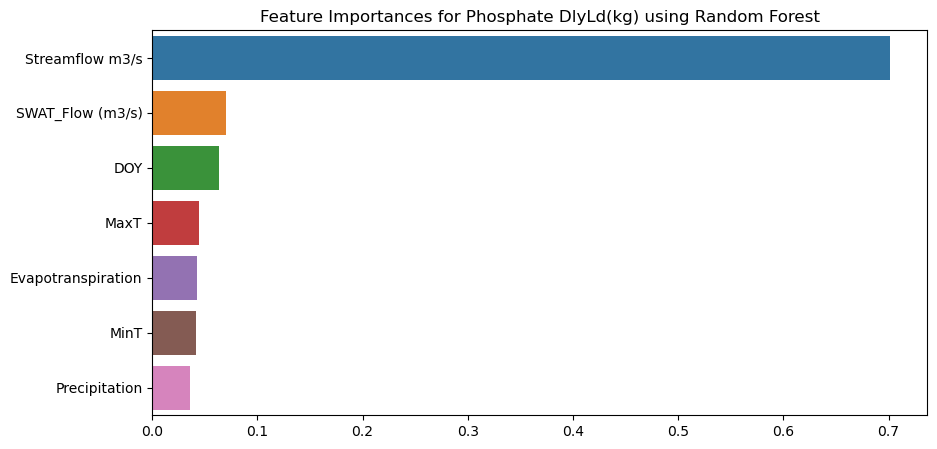

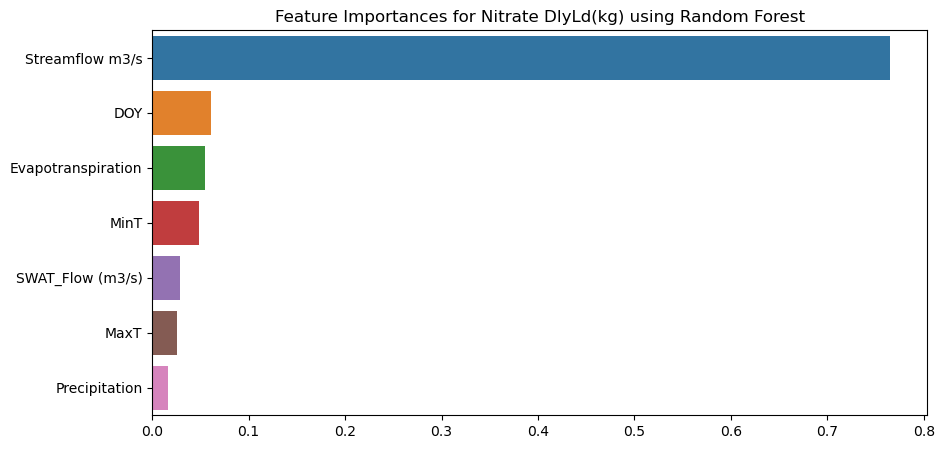

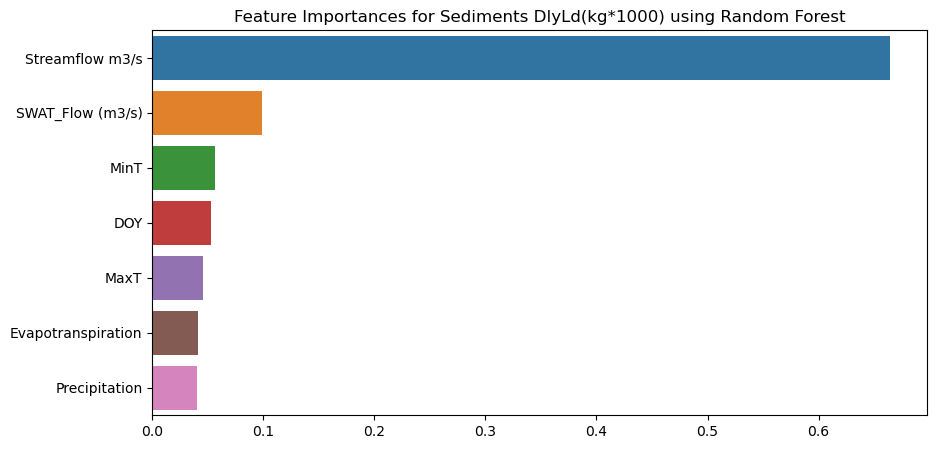

In [54]:
# plot feature importances and arrange them in descending order
for target in targets:
   
    feature_importances = exp3_results[target]["Feature Importances"]
    sorted_indices = np.argsort(feature_importances)[::-1]
    sorted_features = X.columns[sorted_indices]
    sorted_importances = feature_importances[sorted_indices]

    plt.figure(figsize=(10, 5))
    sns.barplot(x=sorted_importances, y=sorted_features)
    plt.title(f"Feature Importances for {target} using Random Forest")
    plt.show()

##### Actual vs Predicted

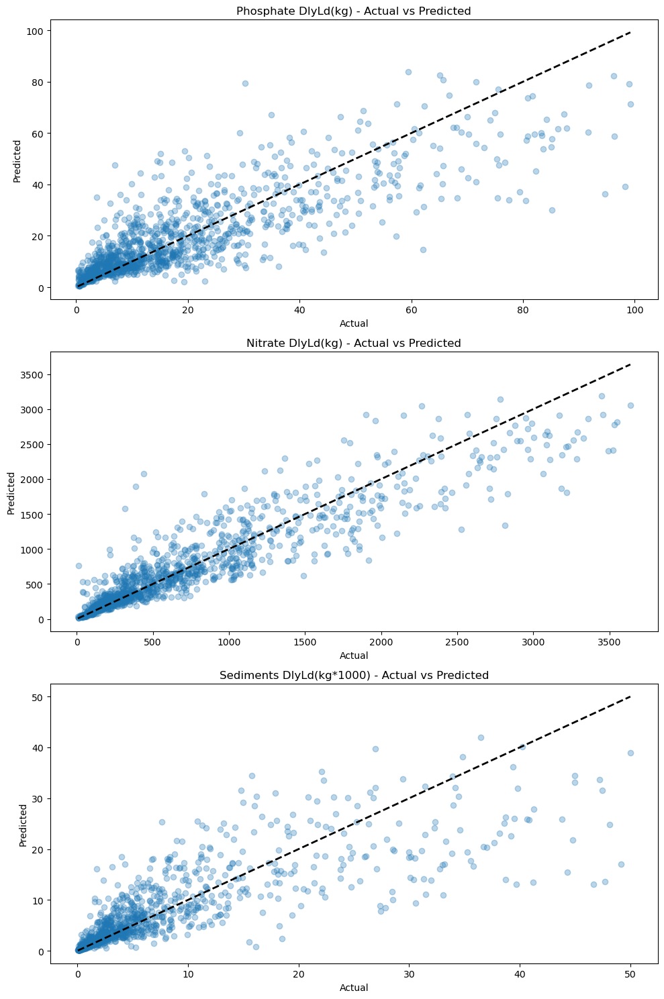

In [55]:
# Plotting the results
fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(10, 15))

for i, target in enumerate(targets):
    ax = axes[i]
    ax.scatter(exp3_y_tests[target][target], exp3_model_preds[target], alpha=0.3)
    ax.plot([exp3_y_tests[target][target].min(), exp3_y_tests[target][target].max()], [exp3_y_tests[target][target].min(), exp3_y_tests[target][target].max()], 'k--', lw=2)
    ax.set_xlabel('Actual')
    ax.set_ylabel('Predicted')
    ax.set_title(f'{target} - Actual vs Predicted')

plt.tight_layout()
plt.show()

##### Line Chart

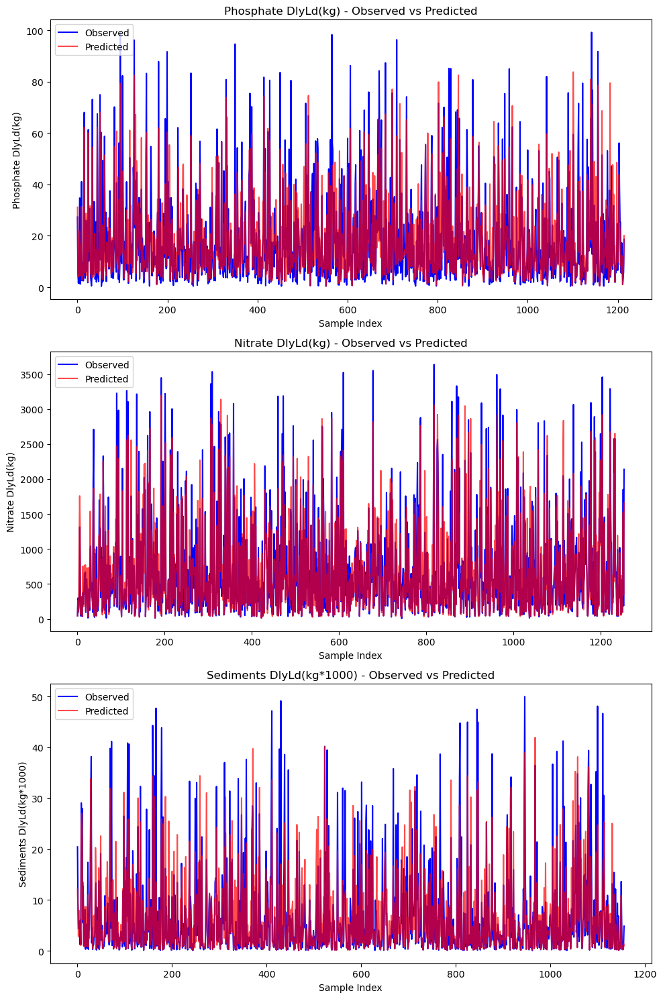

In [56]:
# Plotting the results
fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(10, 15))

for i, target in enumerate(targets):
    ax = axes[i]
    ax.plot(exp3_y_tests[target][target].values, label='Observed', color='blue')
    ax.plot(exp3_model_preds[target], label='Predicted', color='red', alpha=0.7)
    ax.set_xlabel('Sample Index')
    ax.set_ylabel(target)
    ax.set_title(f'{target} - Observed vs Predicted')
    ax.legend()

plt.tight_layout()
plt.show()

### Experiment 4) Using Uncalibrated SWAT water quality to make water quality predictions

#### Model Training

In [53]:
training_data = pd.merge(
    input_df, swat_simulations, left_on="date", right_on="Date"
).drop(columns=["Date",
                "SWAT_Flow (m3/s)"
                # , "SWAT_Sediments (tons)"
                # , "SWAT_Nitrate (kg)"
                # , "SWAT_Phosphate (kg)"
                ])

training_data

,DOY,Precipitation,Evapotranspiration,MaxT,MinT,date,month,SWAT_Sediments (tons),SWAT_Nitrate (kg),SWAT_Phosphate (kg)
0,1,0.330769,0.517,2.445385,-10.748462,1993-01-01,1,42.73,1538.0,25.280
1,2,0.101538,0.402,-3.736154,-10.940769,1993-01-02,1,34.21,494.3,7.307
2,3,1.456923,0.782,1.354615,-10.342308,1993-01-03,1,31.20,269.0,2.845
3,4,5.001538,0.378,8.511538,-1.980769,1993-01-04,1,40.87,2157.0,43.710
4,5,12.960000,0.412,10.614615,-5.325385,1993-01-05,1,63.33,1864.0,66.640
...,...,...,...,...,...,...,...,...,...,...
6477,269,0.176923,0.786,18.566923,7.568462,2010-09-30,9,775.30,4894.0,923.800
6478,270,10.595385,1.170,19.443846,10.580769,2010-10-01,10,1568.00,8146.0,1435.000
6479,271,6.947692,2.150,22.430000,9.900769,2010-10-02,10,1345.00,7060.0,1161.000
6480,272,3.652308,2.320,21.366923,9.922308,2010-10-03,10,894.20,4943.0,719.200


In [54]:
# Define the hyperparameter distribution for Random Forest
param_dist = {
    "n_estimators": sp_randint(100, 1000),
    "max_features": [0.5, 0.75, 1.0, "sqrt", "log2"],
    "min_samples_split": sp_randint(2, 5),
    "min_samples_leaf": sp_randint(1, 20),
}

# Assuming training data and target data are already defined as per your context
# Merge training data with streamflow output (using date)
simulated_water_quality_training_data = pd.merge(
    input_df, swat_simulations, left_on="date", right_on="Date"
).drop(columns=["Date",
                "SWAT_Flow (m3/s)"
                # "SWAT_Sediments (tons)",
                # "SWAT_Nitrate (kg)", 
                # "SWAT_Phosphate (kg)"
                ])

simulated_water_quality_training_data.rename(columns={"SWAT_Sediments (tons)": "SWAT_Sediments DlyLd(kg*1000)", "SWAT_Nitrate (kg)": "SWAT_Nitrate DlyLd(kg)", "SWAT_Phosphate (kg)": "SWAT_Phosphate DlyLd(kg)"}, inplace=True)

# Define the target variables
targets = ["Phosphate DlyLd(kg)", "Nitrate DlyLd(kg)", "Sediments DlyLd(kg*1000)"]

# Define the Random Forest Regressor model
rf_model = RandomForestRegressor(random_state=42)

# Perform randomized hyperparameter search on train + validation set
n_iter_search = 7  # Number of parameter settings to sample
random_search = RandomizedSearchCV(
    rf_model,
    param_distributions=param_dist,
    cv=5,
    n_iter=n_iter_search,
    n_jobs=-1,
    verbose=3,
)

# Run experiments for each target variable
exp4_results = {target: {} for target in targets}
exp4_model_preds = {}
exp4_y_tests = {}
for target in targets:

    mlflow.set_experiment(f"Initial Experiments")
    with mlflow.start_run(
        run_name=f"{target.split()[0]}_Uncal_SWAT_WaterQuality_No_Streamflow_rf"
    ):
        # Merge with water quality data
        train = pd.merge(
            simulated_water_quality_training_data, target_datasets[target], left_on="date", right_on="DATE"
        ).drop(columns=["DATE"])

        # Define input features (X) and target (y)
        X = train.drop(
            columns=[
                "date",
                target,
            ]
        )

        # drop columns which are not SWAT_{Target}
        X = X.drop(columns=[col for col in X.columns if col.startswith("SWAT") and col != f"SWAT_{target}"])
        
        exp4_results[target]["Input Features"] = X.columns

        y = train[[target]]

        # Split the data into train (60%), validation (20%), and test (20%) sets
        X_train, X_temp, y_train, y_temp = train_test_split(
            X, y, test_size=0.3, random_state=42, shuffle=False
        )
        X_val, X_test, y_val, y_test = train_test_split(
            X_temp, y_temp, test_size=0.5, random_state=42, shuffle=False
        )
        exp4_y_tests[target] = y_test

        #print size of each dataset
        print(f"Size of training dataset for target variable {target}: {X_train.shape[0]}")
        print(f"Size of validation dataset for target variable {target}: {X_val.shape[0]}")
        print(f"Size of test dataset for target variable {target}: {X_test.shape[0]}")

        # Standardize the data (train/val/test separately)
        scaler = StandardScaler()
        X_train = scaler.fit_transform(X_train)
        X_val = scaler.transform(X_val)
        X_test = scaler.transform(X_test)

        # Hyperparameter tuning on training and validation data
        # random_search.fit(X_train, y_train[target])

        # mlflow.log_params(random_search.best_params_)

        # # Best model after RandomizedSearchCV
        # best_rf_model = random_search.best_estimator_
        best_params = hyperopt_rf_tuning(X_train, y_train[target])
        print(f"Best hyperparameters for target variable {target}: {best_params}")
        best_rf_model = RandomForestRegressor(**best_params, random_state=42)

        # Retrain the best model on combined train + val data
        X_train_val = np.vstack([X_train, X_val])
        y_train_val = np.hstack([y_train[target], y_val[target]])
        best_rf_model.fit(X_train_val, y_train_val)

        # Evaluate the model on the test set
        y_pred = best_rf_model.predict(X_test)
        exp4_model_preds[target] = y_pred

        # Calculate performance metrics
        nse = nse_score(y_test[target], y_pred)
        pbias = pbias_score(y_test[target], y_pred)
        r2 = r2_score(y_test[target], y_pred)

        mlflow.log_metrics({"R2": r2, "NSE": nse, "PBIAS": pbias})

        # Store feature importances for Random Forest
        feature_importances = best_rf_model.feature_importances_
        exp4_results[target] = {
            "NSE": nse,
            "PBIAS": pbias,
            "R2": r2,
            "Feature Importances": feature_importances,
        }

        mlflow.sklearn.log_model(best_rf_model, "model")

    # Print the final exp4_results for all target variables
    # pprint(exp4_results)

Size of training dataset for target variable Phosphate DlyLd(kg): 4534
Size of validation dataset for target variable Phosphate DlyLd(kg): 972
Size of test dataset for target variable Phosphate DlyLd(kg): 972
100%|██████████| 50/50 [01:44<00:00,  2.09s/trial, best loss: 44.50011899346921] 
Best hyperparameters for target variable Phosphate DlyLd(kg): {'n_estimators': 300, 'max_depth': 27, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': None}


2025/02/24 18:16:23 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Size of training dataset for target variable Nitrate DlyLd(kg): 4534
Size of validation dataset for target variable Nitrate DlyLd(kg): 972
Size of test dataset for target variable Nitrate DlyLd(kg): 972
100%|██████████| 50/50 [01:42<00:00,  2.04s/trial, best loss: 27638.372630700847]
Best hyperparameters for target variable Nitrate DlyLd(kg): {'n_estimators': 270, 'max_depth': 28, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': None}


2025/02/24 18:18:12 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Size of training dataset for target variable Sediments DlyLd(kg*1000): 4534
Size of validation dataset for target variable Sediments DlyLd(kg*1000): 972
Size of test dataset for target variable Sediments DlyLd(kg*1000): 972
100%|██████████| 50/50 [01:30<00:00,  1.81s/trial, best loss: 13.521876012218335]
Best hyperparameters for target variable Sediments DlyLd(kg*1000): {'n_estimators': 300, 'max_depth': 18, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': None}


2025/02/24 18:19:51 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


#### Evaluation

##### Metrics

In [55]:
# create dataframe for exp3_results only showing the metrics
exp4_results_df = pd.DataFrame(exp4_results).T.drop(columns=["Feature Importances"])
exp4_results_df

,NSE,PBIAS,R2
Phosphate DlyLd(kg),-0.097812,12.918511,0.447655
Nitrate DlyLd(kg),0.326589,32.72345,0.317739
Sediments DlyLd(kg*1000),0.397306,1.614069,0.656587


##### Feature Importances

In [60]:
# plot feature importances and arrange them in descending order
for target in targets:
   
    feature_importances = exp4_results[target]["Feature Importances"]
    sorted_indices = np.argsort(feature_importances)[::-1]
    sorted_features = exp4_results[target]["Input Features"][sorted_indices]
    sorted_importances = feature_importances[sorted_indices]

    plt.figure(figsize=(10, 5))
    sns.barplot(x=sorted_importances, y=sorted_features)
    plt.title(f"Feature Importances for {target} using Random Forest")
    plt.show()

KeyError: 'Input Features'

##### Actual vs Predicted

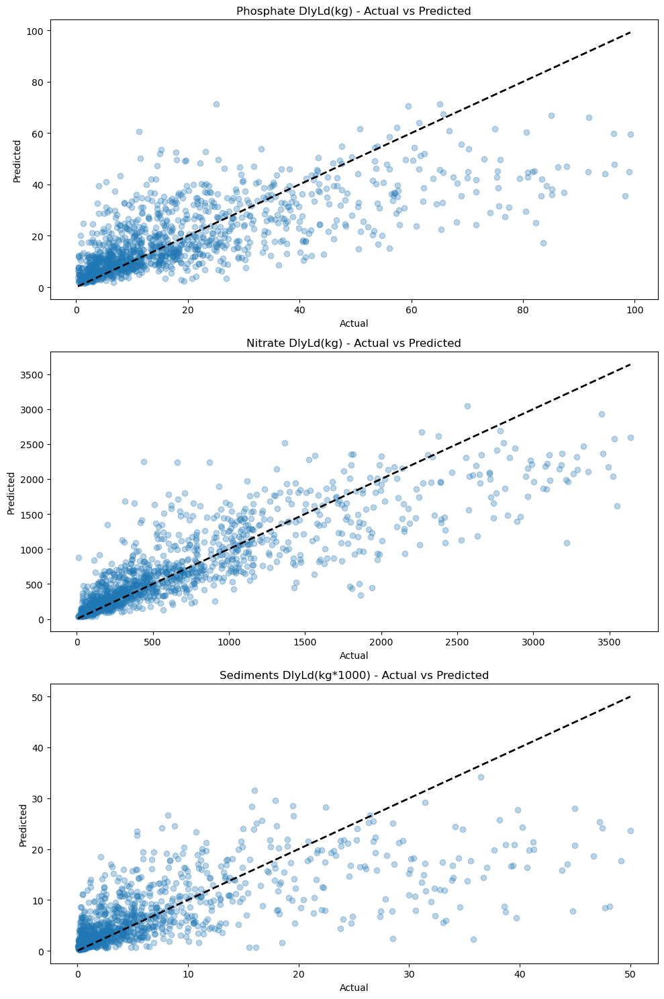

In [ ]:
# Plotting the results
fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(10, 15))

for i, target in enumerate(targets):
    ax = axes[i]
    ax.scatter(exp4_y_tests[target][target], exp4_model_preds[target], alpha=0.3)
    ax.plot([exp4_y_tests[target][target].min(), exp4_y_tests[target][target].max()], [exp4_y_tests[target][target].min(), exp4_y_tests[target][target].max()], 'k--', lw=2)
    ax.set_xlabel('Actual')
    ax.set_ylabel('Predicted')
    ax.set_title(f'{target} - Actual vs Predicted')

plt.tight_layout()
plt.show()

##### Line Chart

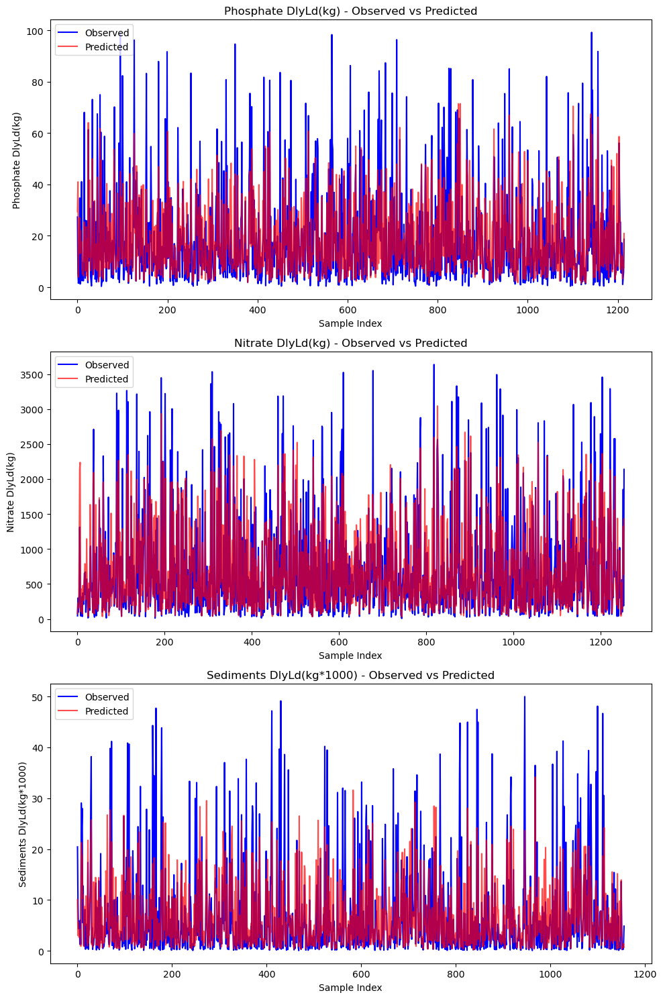

In [ ]:
# Plotting the results
fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(10, 15))

for i, target in enumerate(targets):
    ax = axes[i]
    ax.plot(exp4_y_tests[target][target].values, label='Observed', color='blue')
    ax.plot(exp4_model_preds[target], label='Predicted', color='red', alpha=0.7)
    ax.set_xlabel('Sample Index')
    ax.set_ylabel(target)
    ax.set_title(f'{target} - Observed vs Predicted')
    ax.legend()

plt.tight_layout()
plt.show()

### Experiment 5) Using Calibrated SWAT streamflow to make water quality predictions

#### Calibrated Data Import

In [56]:
calibrated_swat_df = pd.read_excel("data/Calibrated Streamflow data.xlsx")

calibrated_swat_df

,Date,Simulated
0,1993-01-01,36.11
1,1993-01-02,36.20
2,1993-01-03,33.75
3,1993-01-04,34.43
4,1993-01-05,46.33
...,...,...
10222,2020-12-27,85.54
10223,2020-12-28,64.66
10224,2020-12-29,45.87
10225,2020-12-30,36.19


#### Model Training

In [57]:
training_data = pd.merge(
    input_df, calibrated_swat_df, left_on="date", right_on="Date"
).drop(columns=["Date"])

training_data

,DOY,Precipitation,Evapotranspiration,MaxT,MinT,date,month,Simulated
0,1,0.330769,0.517,2.445385,-10.748462,1993-01-01,1,36.11
1,2,0.101538,0.402,-3.736154,-10.940769,1993-01-02,1,36.20
2,3,1.456923,0.782,1.354615,-10.342308,1993-01-03,1,33.75
3,4,5.001538,0.378,8.511538,-1.980769,1993-01-04,1,34.43
4,5,12.960000,0.412,10.614615,-5.325385,1993-01-05,1,46.33
...,...,...,...,...,...,...,...,...
6477,269,0.176923,0.786,18.566923,7.568462,2010-09-30,9,194.60
6478,270,10.595385,1.170,19.443846,10.580769,2010-10-01,10,302.00
6479,271,6.947692,2.150,22.430000,9.900769,2010-10-02,10,191.40
6480,272,3.652308,2.320,21.366923,9.922308,2010-10-03,10,93.37


In [58]:
# Define the hyperparameter distribution for Random Forest
param_dist = {
    "n_estimators": sp_randint(100, 1000),
    "max_features": [0.5, 0.75, 1.0, "sqrt", "log2"],
    "min_samples_split": sp_randint(2, 5),
    "min_samples_leaf": sp_randint(1, 20),
}

# Assuming training data and target data are already defined as per your context
# Merge training data with streamflow output (using date)
training_data = pd.merge(
    input_df, calibrated_swat_df, left_on="date", right_on="Date"
).drop(columns=["Date"])

# Define the target variables
targets = ["Phosphate DlyLd(kg)", "Nitrate DlyLd(kg)", "Sediments DlyLd(kg*1000)"]

# Define the Random Forest Regressor model
rf_model = RandomForestRegressor(random_state=42)

# Perform randomized hyperparameter search on train + validation set
n_iter_search = 7  # Number of parameter settings to sample
random_search = RandomizedSearchCV(
    rf_model,
    param_distributions=param_dist,
    cv=5,
    n_iter=n_iter_search,
    n_jobs=-1,
    verbose=3,
)

# Run experiments for each target variable
exp5_results = {target: {} for target in targets}
exp5_model_preds = {}
exp5_y_tests = {}
for target in targets:

    mlflow.set_experiment(f"Initial Experiments")
    with mlflow.start_run(run_name=f"{target.split()[0]}_Calibrated_SWAT_Only_Streamflow_rf"):

        # Merge with water quality data
        train = pd.merge(
            training_data, target_datasets[target], left_on="date", right_on="DATE"
        ).drop(columns=["DATE"])

        # Define input features (X) and target (y)
        X = train.drop(
            columns=[
                "date",
                target
            ]
        )

        y = train[[target]]

        # Split the data into train (60%), validation (20%), and test (20%) sets
        X_train, X_temp, y_train, y_temp = train_test_split(
            X, y, test_size=0.3, random_state=42, shuffle=False
        )
        X_val, X_test, y_val, y_test = train_test_split(
            X_temp, y_temp, test_size=0.5, random_state=42, shuffle=False
        )
        exp5_y_tests[target] = y_test

        #print size of each dataset
        print(f"Size of training dataset for target variable {target}: {X_train.shape[0]}")
        print(f"Size of validation dataset for target variable {target}: {X_val.shape[0]}")
        print(f"Size of test dataset for target variable {target}: {X_test.shape[0]}")

        # Standardize the data (train/val/test separately)
        scaler = StandardScaler()
        X_train = scaler.fit_transform(X_train)
        X_val = scaler.transform(X_val)
        X_test = scaler.transform(X_test)

        # Hyperparameter tuning on training and validation data
        # random_search.fit(X_train, y_train[target])

        # mlflow.log_params(random_search.best_params_)

        # # Best model after RandomizedSearchCV
        # best_rf_model = random_search.best_estimator_
        best_params = hyperopt_rf_tuning(X_train, y_train[target])
        print(f"Best hyperparameters for target variable {target}: {best_params}")
        best_rf_model = RandomForestRegressor(**best_params, random_state=42)

        # Retrain the best model on combined train + val data
        X_train_val = np.vstack([X_train, X_val])
        y_train_val = np.hstack([y_train[target], y_val[target]])
        best_rf_model.fit(X_train_val, y_train_val)

        # Evaluate the model on the test set
        y_pred = best_rf_model.predict(X_test)
        exp5_model_preds[target] = y_pred

        # Calculate performance metrics
        nse = nse_score(y_test[target], y_pred)
        pbias = pbias_score(y_test[target], y_pred)
        r2 = r2_score(y_test[target], y_pred)

        mlflow.log_metrics({"R2": r2, "NSE": nse, "PBIAS": pbias})

        # Store feature importances for Random Forest
        feature_importances = best_rf_model.feature_importances_
        exp5_results[target] = {
            "NSE": nse,
            "PBIAS": pbias,
            "R2": r2,
            "Feature Importances": feature_importances,
        }
    # Print the final exp5_results for all target variables
    # pprint(exp5_results)

Size of training dataset for target variable Phosphate DlyLd(kg): 4534
Size of validation dataset for target variable Phosphate DlyLd(kg): 972
Size of test dataset for target variable Phosphate DlyLd(kg): 972
100%|██████████| 50/50 [01:26<00:00,  1.72s/trial, best loss: 27.28938749565345] 
Best hyperparameters for target variable Phosphate DlyLd(kg): {'n_estimators': 300, 'max_depth': 18, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': None}
Size of training dataset for target variable Nitrate DlyLd(kg): 4534
Size of validation dataset for target variable Nitrate DlyLd(kg): 972
Size of test dataset for target variable Nitrate DlyLd(kg): 972
100%|██████████| 50/50 [01:40<00:00,  2.01s/trial, best loss: 19278.338448224855]
Best hyperparameters for target variable Nitrate DlyLd(kg): {'n_estimators': 300, 'max_depth': 27, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': None}
Size of training dataset for target variable Sediments DlyLd(kg*1000): 4534
Size of va

##### Metrics

In [59]:
# create dataframe for exp3_results only showing the metrics
exp5_results_df = pd.DataFrame(exp5_results).T.drop(columns=["Feature Importances"])
exp5_results_df

,NSE,PBIAS,R2
Phosphate DlyLd(kg),0.435234,5.775529,0.619606
Nitrate DlyLd(kg),0.509056,30.013614,0.493691
Sediments DlyLd(kg*1000),0.417744,4.257971,0.66232


##### Feature Importances

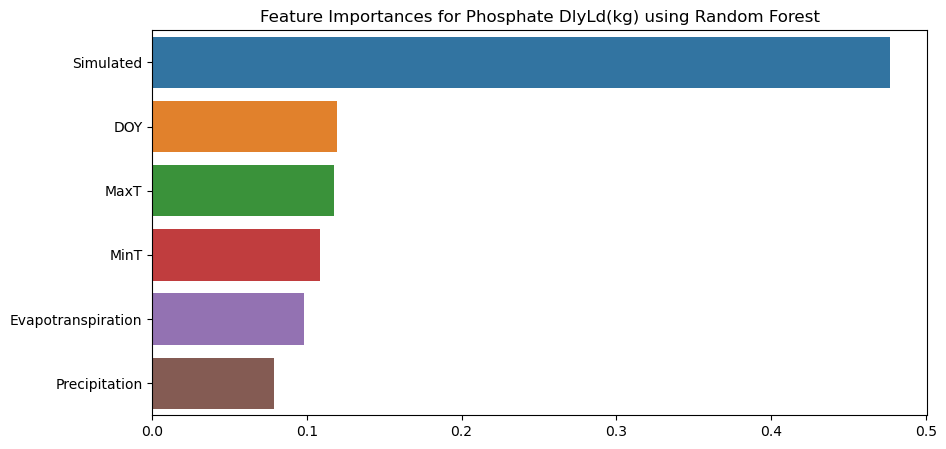

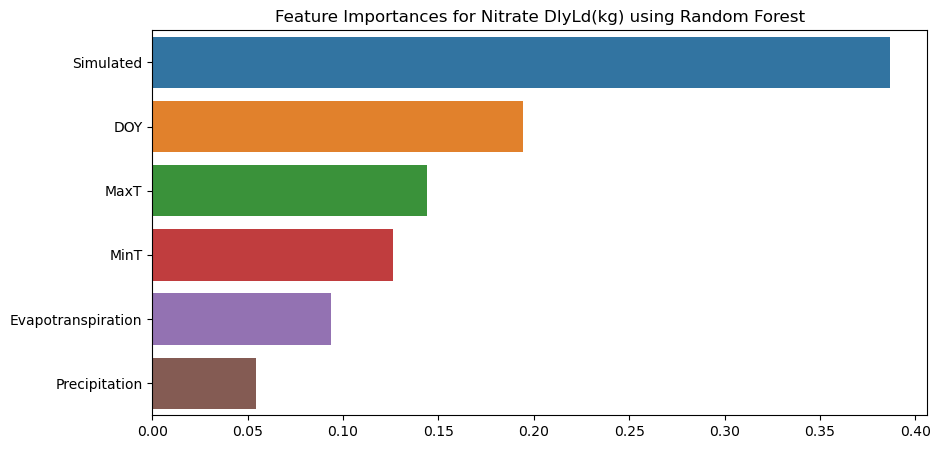

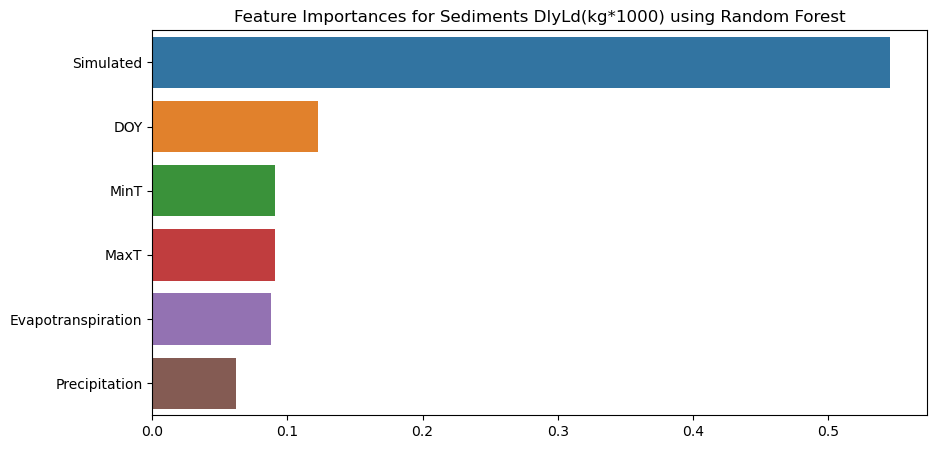

In [65]:
# plot feature importances and arrange them in descending order
for target in targets:
   
    feature_importances = exp5_results[target]["Feature Importances"]
    sorted_indices = np.argsort(feature_importances)[::-1]
    sorted_features = X.columns[sorted_indices]
    sorted_importances = feature_importances[sorted_indices]

    plt.figure(figsize=(10, 5))
    sns.barplot(x=sorted_importances, y=sorted_features)
    plt.title(f"Feature Importances for {target} using Random Forest")
    plt.show()

##### Actual vs Predicted

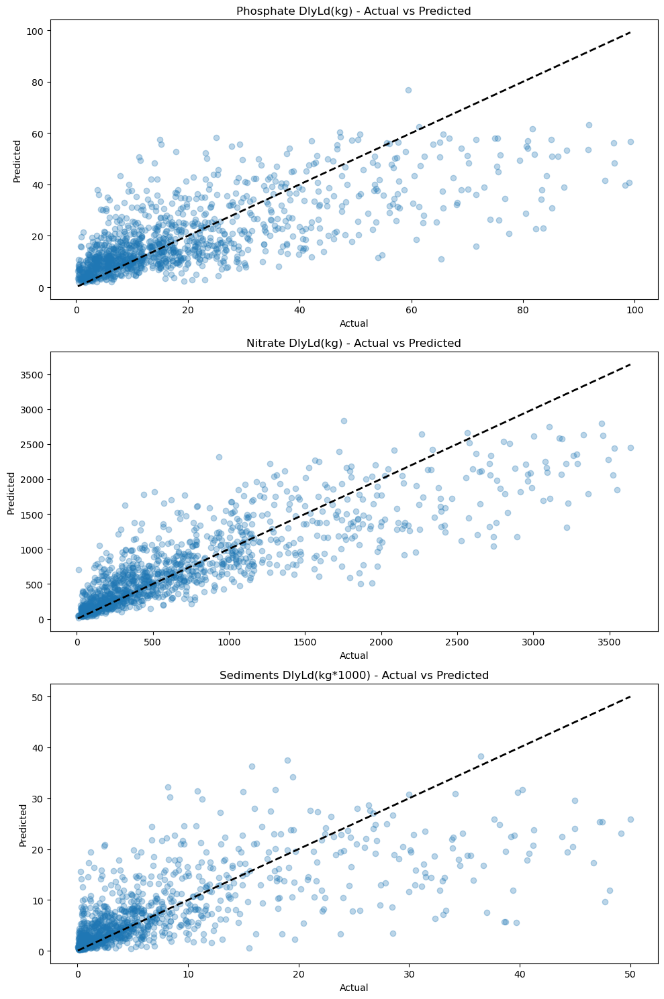

In [66]:
# Plotting the results
fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(10, 15))

for i, target in enumerate(targets):
    ax = axes[i]
    ax.scatter(exp5_y_tests[target][target], exp5_model_preds[target], alpha=0.3)
    ax.plot([exp5_y_tests[target][target].min(), exp5_y_tests[target][target].max()], [exp5_y_tests[target][target].min(), exp5_y_tests[target][target].max()], 'k--', lw=2)
    ax.set_xlabel('Actual')
    ax.set_ylabel('Predicted')
    ax.set_title(f'{target} - Actual vs Predicted')

plt.tight_layout()
plt.show()

##### Line Chart

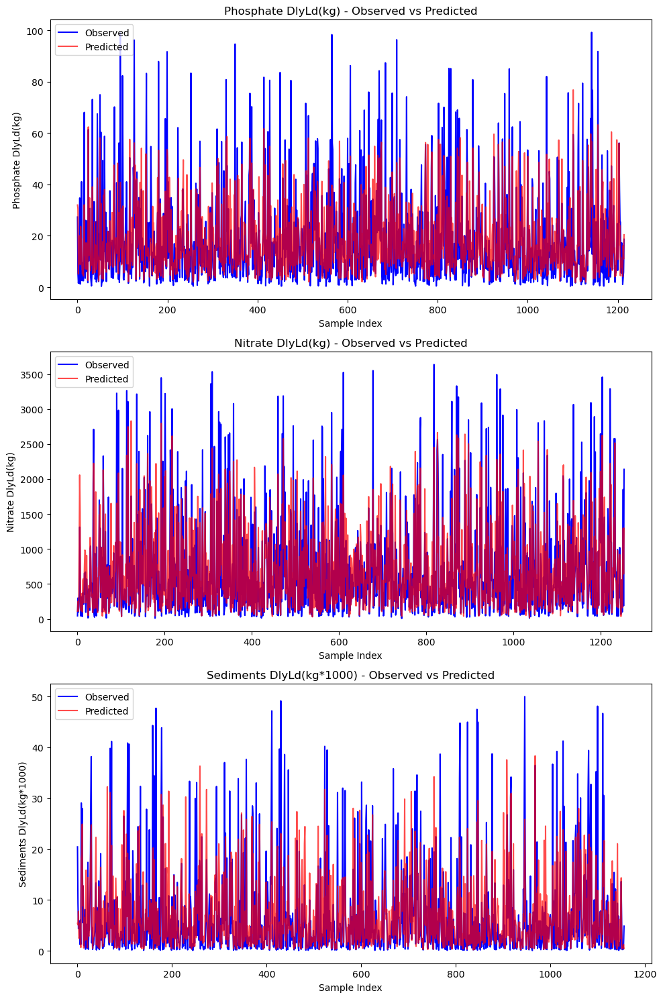

In [67]:
# Plotting the results
fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(10, 15))

for i, target in enumerate(targets):
    ax = axes[i]
    ax.plot(exp5_y_tests[target][target].values, label='Observed', color='blue')
    ax.plot(exp5_model_preds[target], label='Predicted', color='red', alpha=0.7)
    ax.set_xlabel('Sample Index')
    ax.set_ylabel(target)
    ax.set_title(f'{target} - Observed vs Predicted')
    ax.legend()

plt.tight_layout()
plt.show()

## Experiment 6) Using Calibrated SWAT Water Quality to predict Water Quality

#### Training

In [60]:
sediments_calibrated_water_quality_df =pd.read_excel("data/CalibratedWaterQuality.xlsx", sheet_name="Sediments")
sediments_calibrated_water_quality_df.rename(columns={"Simulated": "Calibrated_SWAT_Sediments DlyLd(kg*1000)"}, inplace=True)
nitrate_calibrated_water_quality_df =pd.read_excel("data/CalibratedWaterQuality.xlsx", sheet_name="Nitrate")
nitrate_calibrated_water_quality_df.rename(columns={"Simulated": "Calibrated_SWAT_Nitrate DlyLd(kg)"}, inplace=True)
phosphate_calibrated_water_quality_df =pd.read_excel("data/CalibratedWaterQuality.xlsx", sheet_name="Phosphate")
phosphate_calibrated_water_quality_df.rename(columns={"Simulated": "Calibrated_SWAT_Phosphate DlyLd(kg)"}, inplace=True)

calibrated_water_quality_df = pd.merge(
    sediments_calibrated_water_quality_df, nitrate_calibrated_water_quality_df, on="Date"
)

calibrated_water_quality_df = pd.merge(
    calibrated_water_quality_df, phosphate_calibrated_water_quality_df, on="Date"
)



calibrated_water_quality_df

,Date,Calibrated_SWAT_Sediments DlyLd(kg*1000),Calibrated_SWAT_Nitrate DlyLd(kg),Calibrated_SWAT_Phosphate DlyLd(kg)
0,1993-01-01,72.0400,874.90,49.8900
1,1993-01-02,44.4200,232.20,17.2600
2,1993-01-03,26.6100,1133.00,39.9900
3,1993-01-04,32.7800,1213.00,72.1200
4,1993-01-05,43.5200,1135.00,116.7000
...,...,...,...,...
6477,2010-09-26,0.8149,17.45,0.2327
6478,2010-09-27,2.7360,66.74,11.9800
6479,2010-09-28,3.8130,88.67,16.6600
6480,2010-09-29,5.3260,150.10,21.2600


In [61]:
# Define the hyperparameter distribution for Random Forest
param_dist = {
    "n_estimators": sp_randint(100, 1000),
    "max_features": [0.5, 0.75, 1.0, "sqrt", "log2"],
    "min_samples_split": sp_randint(2, 5),
    "min_samples_leaf": sp_randint(1, 20),
}

# Assuming training data and target data are already defined as per your context
# Merge training data with streamflow output (using date)
training_data = pd.merge(
    input_df, calibrated_water_quality_df, left_on="date", right_on="Date"
).drop(columns=["Date"])

# Define the target variables
targets = ["Phosphate DlyLd(kg)", "Nitrate DlyLd(kg)", "Sediments DlyLd(kg*1000)"]

# Define the Random Forest Regressor model
rf_model = RandomForestRegressor(random_state=42)


# Perform randomized hyperparameter search on train + validation set
n_iter_search = 7  # Number of parameter settings to sample
random_search = RandomizedSearchCV(
    rf_model,
    param_distributions=param_dist,
    cv=5,
    n_iter=n_iter_search,
    n_jobs=-1,
    verbose=3,
)

# Run experiments for each target variable
results = {target: {} for target in targets}
model_preds = {}
y_tests = {}
for target in targets:
    mlflow.set_experiment(f"Initial Experiments")
    with mlflow.start_run(
        run_name=f"{target.split()[0]}_Calibrated_SWAT_Water_Quality_No_Streamflow_rf"
    ):
    # Merge with water quality data
        train = pd.merge(
            training_data, target_datasets[target], left_on="date", right_on="DATE"
        ).drop(columns=["DATE"])

        # Define input features (X) and target (y)
        X = train.drop(
            columns=[
                "date",
                target
            ]
        )

        # X = X.drop(columns=[col for col in X.columns if col.startswith("Calibrated_SWAT") and col != f"Calibrated_SWAT_{target}"])

        y = train[[target]]

        # Split the data into train (60%), validation (20%), and test (20%) sets
        X_train, X_temp, y_train, y_temp = train_test_split(
            X, y, test_size=0.3, random_state=42, shuffle=False
        )
        X_val, X_test, y_val, y_test = train_test_split(
            X_temp, y_temp, test_size=0.5, random_state=42, shuffle=False
        )
        y_tests[target] = y_test

        #print size of each dataset
        print(f"Size of training dataset for target variable {target}: {X_train.shape[0]}")
        print(f"Size of validation dataset for target variable {target}: {X_val.shape[0]}")
        print(f"Size of test dataset for target variable {target}: {X_test.shape[0]}")

        # Standardize the data (train/val/test separately)
        scaler = StandardScaler()
        X_train = scaler.fit_transform(X_train)
        X_val = scaler.transform(X_val)
        X_test = scaler.transform(X_test)

        # Hyperparameter tuning on training and validation data
        # random_search.fit(X_train, y_train[target])
        
        # mlflow.log_params(random_search.best_params_)

        # # Best model after RandomizedSearchCV
        # best_rf_model = random_search.best_estimator_
        best_params = hyperopt_rf_tuning(X_train, y_train[target])
        print(f"Best hyperparameters for target variable {target}: {best_params}")
        best_rf_model = RandomForestRegressor(**best_params, random_state=42)

        # Retrain the best model on combined train + val data
        X_train_val = np.vstack([X_train, X_val])
        y_train_val = np.hstack([y_train[target], y_val[target]])
        best_rf_model.fit(X_train_val, y_train_val)

        # Evaluate the model on the test set
        y_pred = best_rf_model.predict(X_test)
        model_preds[target] = y_pred

        # Calculate performance metrics
        nse = nse_score(y_test[target], y_pred)
        pbias = pbias_score(y_test[target], y_pred)
        r2 = r2_score(y_test[target], y_pred)

        mlflow.log_metrics({"R2": r2, "NSE": nse, "PBIAS": pbias})

        # Store feature importances for Random Forest
        feature_importances = best_rf_model.feature_importances_
        results[target] = {
            "NSE": nse,
            "PBIAS": pbias,
            "R2": r2,
            "Feature Importances": feature_importances,
        }
        mlflow.sklearn.log_model(best_rf_model, "model")

# Print the final results for all target variables
pprint(results)


Size of training dataset for target variable Phosphate DlyLd(kg): 4534
Size of validation dataset for target variable Phosphate DlyLd(kg): 972
Size of test dataset for target variable Phosphate DlyLd(kg): 972
100%|██████████| 50/50 [01:57<00:00,  2.34s/trial, best loss: 35.244004754990634]
Best hyperparameters for target variable Phosphate DlyLd(kg): {'n_estimators': 300, 'max_depth': 18, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': None}


2025/02/24 18:26:53 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Size of training dataset for target variable Nitrate DlyLd(kg): 4534
Size of validation dataset for target variable Nitrate DlyLd(kg): 972
Size of test dataset for target variable Nitrate DlyLd(kg): 972
100%|██████████| 50/50 [01:46<00:00,  2.13s/trial, best loss: 28761.278443659896]
Best hyperparameters for target variable Nitrate DlyLd(kg): {'n_estimators': 300, 'max_depth': 18, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': None}


2025/02/24 18:28:49 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Size of training dataset for target variable Sediments DlyLd(kg*1000): 4534
Size of validation dataset for target variable Sediments DlyLd(kg*1000): 972
Size of test dataset for target variable Sediments DlyLd(kg*1000): 972
100%|██████████| 50/50 [01:47<00:00,  2.14s/trial, best loss: 14.709100400092767]
Best hyperparameters for target variable Sediments DlyLd(kg*1000): {'n_estimators': 300, 'max_depth': 18, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': None}


2025/02/24 18:30:46 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


{'Nitrate DlyLd(kg)': {'Feature Importances': array([0.13630363, 0.02252517, 0.04046987, 0.06172633, 0.0753492 ,
       0.0100148 , 0.16689191, 0.3745573 , 0.03410116, 0.06842641,
       0.00963422]),
                       'NSE': 0.3207209502117221,
                       'PBIAS': 30.964168772780962,
                       'R2': 0.39865572574406194},
 'Phosphate DlyLd(kg)': {'Feature Importances': array([0.0722143 , 0.03513692, 0.03960187, 0.04475292, 0.04776089,
       0.00896983, 0.44728511, 0.15304976, 0.04497368, 0.09791094,
       0.00834377]),
                         'NSE': -0.014618504336516125,
                         'PBIAS': 4.030972496782522,
                         'R2': 0.5103051758788242},
 'Sediments DlyLd(kg*1000)': {'Feature Importances': array([0.08501152, 0.03308669, 0.03637618, 0.06951947, 0.05050586,
       0.00597393, 0.28224421, 0.3295436 , 0.05441382, 0.04782989,
       0.00549482]),
                              'NSE': 0.11322095621407025,
                 

#### Evaluation

##### Metrics

In [62]:
# create dataframe for exp3_results only showing the metrics
results_df = pd.DataFrame(results).T#.drop(columns=["Feature Importances"])
results_df

,NSE,PBIAS,R2,Feature Importances
Phosphate DlyLd(kg),-0.014619,4.030972,0.510305,"[0.07221430340147084, 0.03513692271149629, 0.0..."
Nitrate DlyLd(kg),0.320721,30.964169,0.398656,"[0.1363036303224048, 0.022525168210850148, 0.0..."
Sediments DlyLd(kg*1000),0.113221,1.518711,0.576212,"[0.08501151729555169, 0.03308669210386126, 0.0..."


##### Feature Importances

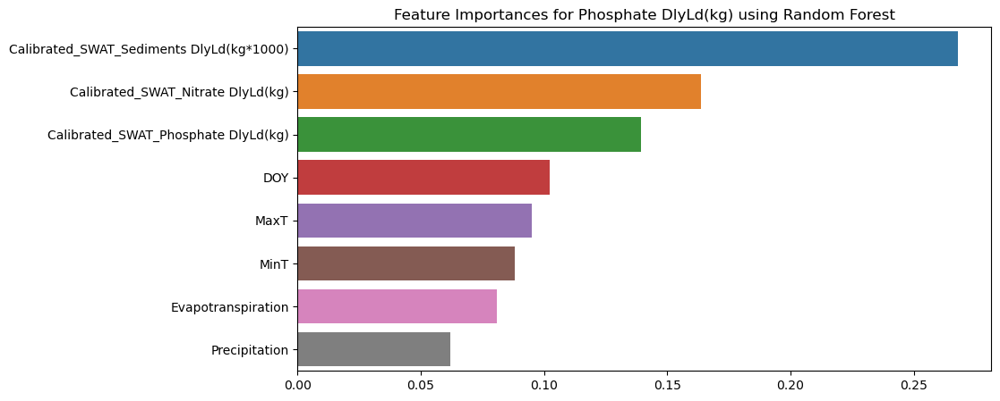

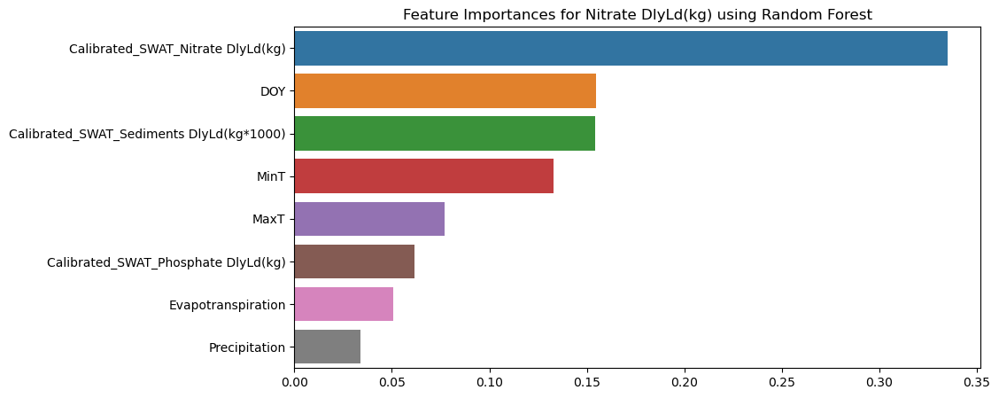

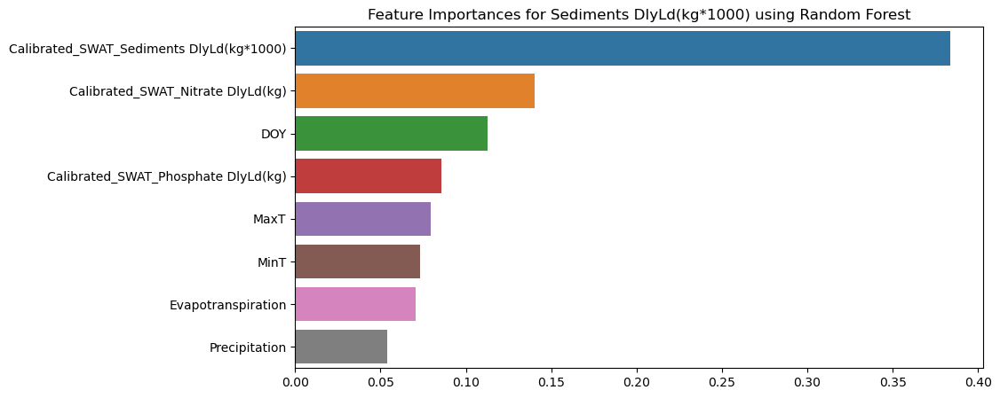

In [71]:
# plot feature importances and arrange them in descending order
for target in targets:
   
    feature_importances = results[target]["Feature Importances"]
    sorted_indices = np.argsort(feature_importances)[::-1]
    sorted_features = X.columns[sorted_indices]
    sorted_importances = feature_importances[sorted_indices]

    plt.figure(figsize=(10, 5))
    sns.barplot(x=sorted_importances, y=sorted_features)
    plt.title(f"Feature Importances for {target} using Random Forest")
    plt.show()

##### Actual vs Predicted

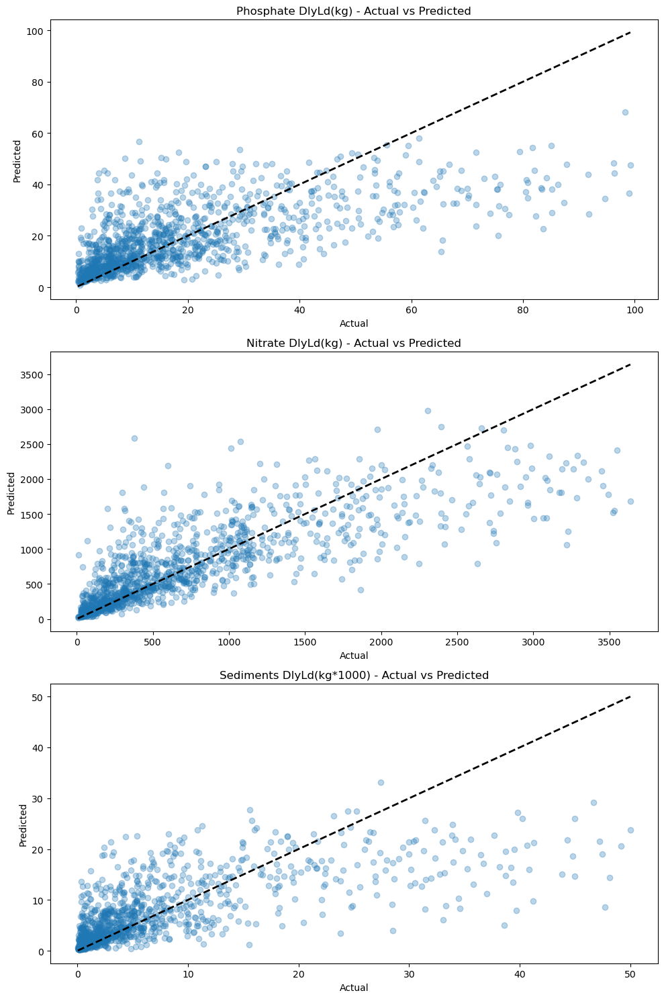

In [72]:
# Plotting the results
fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(10, 15))

for i, target in enumerate(targets):
    ax = axes[i]
    ax.scatter(y_tests[target][target], model_preds[target], alpha=0.3)
    ax.plot([y_tests[target][target].min(), y_tests[target][target].max()], [y_tests[target][target].min(), y_tests[target][target].max()], 'k--', lw=2)
    ax.set_xlabel('Actual')
    ax.set_ylabel('Predicted')
    ax.set_title(f'{target} - Actual vs Predicted')

plt.tight_layout()
plt.show()

##### Line Chart

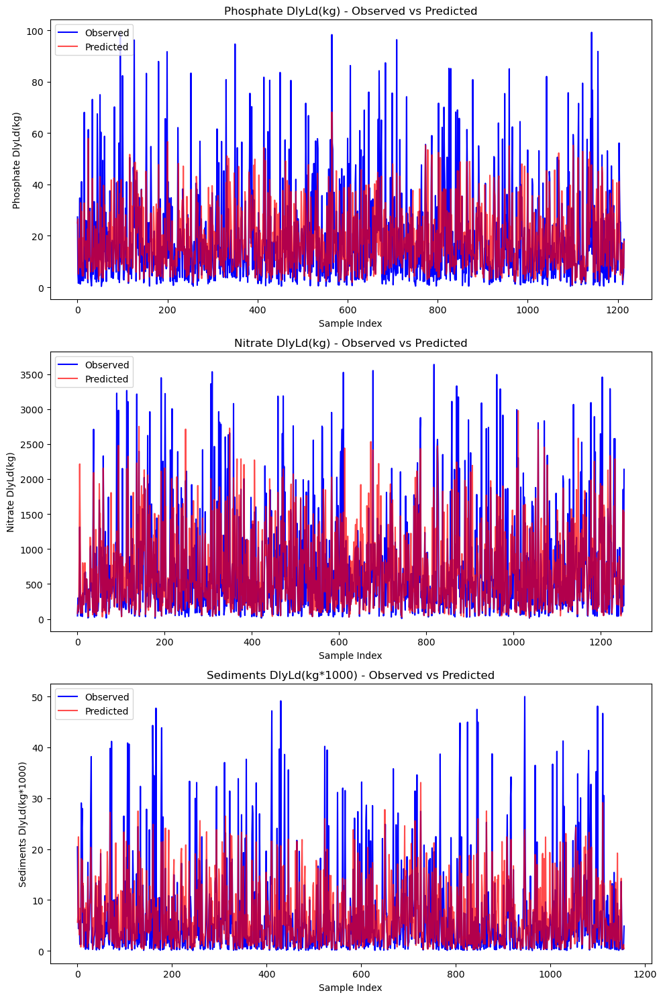

In [73]:
# Plotting the results
fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(10, 15))

for i, target in enumerate(targets):
    ax = axes[i]
    ax.plot(y_tests[target][target].values, label='Observed', color='blue')
    ax.plot(model_preds[target], label='Predicted', color='red', alpha=0.7)
    ax.set_xlabel('Sample Index')
    ax.set_ylabel(target)
    ax.set_title(f'{target} - Observed vs Predicted')
    ax.legend()

plt.tight_layout()
plt.show()

## Experiment 7) Using Individual Calibrated SWAT Water Quality to predict Water Quality

#### Training

In [63]:
sediments_calibrated_water_quality_df =pd.read_excel("data/CalibratedWaterQuality.xlsx", sheet_name="Sediments")
sediments_calibrated_water_quality_df.rename(columns={"Simulated": "Calibrated_SWAT_Sediments DlyLd(kg*1000)"}, inplace=True)
nitrate_calibrated_water_quality_df =pd.read_excel("data/CalibratedWaterQuality.xlsx", sheet_name="Nitrate")
nitrate_calibrated_water_quality_df.rename(columns={"Simulated": "Calibrated_SWAT_Nitrate DlyLd(kg)"}, inplace=True)
phosphate_calibrated_water_quality_df =pd.read_excel("data/CalibratedWaterQuality.xlsx", sheet_name="Phosphate")
phosphate_calibrated_water_quality_df.rename(columns={"Simulated": "Calibrated_SWAT_Phosphate DlyLd(kg)"}, inplace=True)

calibrated_water_quality_df = pd.merge(
    sediments_calibrated_water_quality_df, nitrate_calibrated_water_quality_df, on="Date"
)

calibrated_water_quality_df = pd.merge(
    calibrated_water_quality_df, phosphate_calibrated_water_quality_df, on="Date"
)



calibrated_water_quality_df

,Date,Calibrated_SWAT_Sediments DlyLd(kg*1000),Calibrated_SWAT_Nitrate DlyLd(kg),Calibrated_SWAT_Phosphate DlyLd(kg)
0,1993-01-01,72.0400,874.90,49.8900
1,1993-01-02,44.4200,232.20,17.2600
2,1993-01-03,26.6100,1133.00,39.9900
3,1993-01-04,32.7800,1213.00,72.1200
4,1993-01-05,43.5200,1135.00,116.7000
...,...,...,...,...
6477,2010-09-26,0.8149,17.45,0.2327
6478,2010-09-27,2.7360,66.74,11.9800
6479,2010-09-28,3.8130,88.67,16.6600
6480,2010-09-29,5.3260,150.10,21.2600


In [64]:
# Define the hyperparameter distribution for Random Forest
param_dist = {
    "n_estimators": sp_randint(100, 1000),
    "max_features": [0.5, 0.75, 1.0, "sqrt", "log2"],
    "min_samples_split": sp_randint(2, 5),
    "min_samples_leaf": sp_randint(1, 20),
}

# Assuming training data and target data are already defined as per your context
# Merge training data with streamflow output (using date)
training_data = pd.merge(
    input_df, calibrated_water_quality_df, left_on="date", right_on="Date"
).drop(columns=["Date"])

# Define the target variables
targets = ["Phosphate DlyLd(kg)", "Nitrate DlyLd(kg)", "Sediments DlyLd(kg*1000)"]

# Define the Random Forest Regressor model
rf_model = RandomForestRegressor(random_state=42)


# Perform randomized hyperparameter search on train + validation set
n_iter_search = 7  # Number of parameter settings to sample
random_search = RandomizedSearchCV(
    rf_model,
    param_distributions=param_dist,
    cv=5,
    n_iter=n_iter_search,
    n_jobs=-1,
    verbose=3,
)

# Run experiments for each target variable
results = {target: {} for target in targets}
model_preds = {}
y_tests = {}
for target in targets:
    mlflow.set_experiment(f"Initial Experiments")
    with mlflow.start_run(
        run_name=f"{target.split()[0]}_Calibrated_SWAT_Ind_Water_Quality_NoFlow_rf"
    ):
    # Merge with water quality data
        train = pd.merge(
            training_data, target_datasets[target], left_on="date", right_on="DATE"
        ).drop(columns=["DATE"])

        # Define input features (X) and target (y)
        X = train.drop(
            columns=[
                "date",
                target
            ]
        )

        X = X.drop(columns=[col for col in X.columns if col.startswith("Calibrated_SWAT") and col != f"Calibrated_SWAT_{target}"])

        y = train[[target]]

        # Split the data into train (60%), validation (20%), and test (20%) sets
        X_train, X_temp, y_train, y_temp = train_test_split(
            X, y, test_size=0.3, random_state=42, shuffle=False
        )
        X_val, X_test, y_val, y_test = train_test_split(
            X_temp, y_temp, test_size=0.5, random_state=42, shuffle=False
        )
        y_tests[target] = y_test

        #print size of each dataset
        print(f"Size of training dataset for target variable {target}: {X_train.shape[0]}")
        print(f"Size of validation dataset for target variable {target}: {X_val.shape[0]}")
        print(f"Size of test dataset for target variable {target}: {X_test.shape[0]}")

        # Standardize the data (train/val/test separately)
        scaler = StandardScaler()
        X_train = scaler.fit_transform(X_train)
        X_val = scaler.transform(X_val)
        X_test = scaler.transform(X_test)

        # Hyperparameter tuning on training and validation data
        # random_search.fit(X_train, y_train[target])
        
        # mlflow.log_params(random_search.best_params_)

        # # Best model after RandomizedSearchCV
        # best_rf_model = random_search.best_estimator_
        best_params = hyperopt_rf_tuning(X_train, y_train[target])
        print(f"Best hyperparameters for target variable {target}: {best_params}")
        best_rf_model = RandomForestRegressor(**best_params, random_state=42)

        # Retrain the best model on combined train + val data
        X_train_val = np.vstack([X_train, X_val])
        y_train_val = np.hstack([y_train[target], y_val[target]])
        best_rf_model.fit(X_train_val, y_train_val)

        # Evaluate the model on the test set
        y_pred = best_rf_model.predict(X_test)
        model_preds[target] = y_pred

        # Calculate performance metrics
        nse = nse_score(y_test[target], y_pred)
        pbias = pbias_score(y_test[target], y_pred)
        r2 = r2_score(y_test[target], y_pred)

        mlflow.log_metrics({"R2": r2, "NSE": nse, "PBIAS": pbias})

        # Store feature importances for Random Forest
        feature_importances = best_rf_model.feature_importances_
        results[target] = {
            "NSE": nse,
            "PBIAS": pbias,
            "R2": r2,
            "Feature Importances": feature_importances,
        }
        mlflow.sklearn.log_model(best_rf_model, "model")

# Print the final results for all target variables
pprint(results)


Size of training dataset for target variable Phosphate DlyLd(kg): 4534
Size of validation dataset for target variable Phosphate DlyLd(kg): 972
Size of test dataset for target variable Phosphate DlyLd(kg): 972
100%|██████████| 50/50 [01:45<00:00,  2.11s/trial, best loss: 43.472559529347734]
Best hyperparameters for target variable Phosphate DlyLd(kg): {'n_estimators': 270, 'max_depth': 28, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': None}


2025/02/24 18:32:40 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Size of training dataset for target variable Nitrate DlyLd(kg): 4534
Size of validation dataset for target variable Nitrate DlyLd(kg): 972
Size of test dataset for target variable Nitrate DlyLd(kg): 972
100%|██████████| 50/50 [01:28<00:00,  1.76s/trial, best loss: 33358.326636243466]
Best hyperparameters for target variable Nitrate DlyLd(kg): {'n_estimators': 300, 'max_depth': 18, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': None}


2025/02/24 18:34:15 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Size of training dataset for target variable Sediments DlyLd(kg*1000): 4534
Size of validation dataset for target variable Sediments DlyLd(kg*1000): 972
Size of test dataset for target variable Sediments DlyLd(kg*1000): 972
100%|██████████| 50/50 [01:27<00:00,  1.75s/trial, best loss: 16.645664404684705]
Best hyperparameters for target variable Sediments DlyLd(kg*1000): {'n_estimators': 300, 'max_depth': 18, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': None}


2025/02/24 18:35:51 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


{'Nitrate DlyLd(kg)': {'Feature Importances': array([0.15181901, 0.04139183, 0.06161087, 0.0765082 , 0.08707171,
       0.00960224, 0.47002211, 0.09202485, 0.00994919]),
                       'NSE': 0.1947525352610342,
                       'PBIAS': 30.666400162772334,
                       'R2': 0.30526650498367347},
 'Phosphate DlyLd(kg)': {'Feature Importances': array([0.12700615, 0.07734705, 0.06817745, 0.07554362, 0.08032771,
       0.01179664, 0.4399113 , 0.107093  , 0.01279709]),
                         'NSE': -0.31055437577980793,
                         'PBIAS': 7.780667716861872,
                         'R2': 0.4458609825642379},
 'Sediments DlyLd(kg*1000)': {'Feature Importances': array([0.11909486, 0.05536841, 0.05427662, 0.07334871, 0.08084187,
       0.00946213, 0.5360998 , 0.06187378, 0.00963382]),
                              'NSE': 0.02074410395367654,
                              'PBIAS': 4.873328368051135,
                              'R2': 0.527632576420267

#### Evaluation

##### Metrics

In [65]:
# create dataframe for exp3_results only showing the metrics
results_df = pd.DataFrame(results).T#.drop(columns=["Feature Importances"])
results_df

,NSE,PBIAS,R2,Feature Importances
Phosphate DlyLd(kg),-0.310554,7.780668,0.445861,"[0.1270061516028605, 0.0773470478749988, 0.068..."
Nitrate DlyLd(kg),0.194753,30.6664,0.305267,"[0.1518190080634447, 0.04139182549970567, 0.06..."
Sediments DlyLd(kg*1000),0.020744,4.873328,0.527633,"[0.11909486294540227, 0.055368408976681174, 0...."


##### Feature Importances

In [77]:
# plot feature importances and arrange them in descending order
for target in targets:
   
    feature_importances = results[target]["Feature Importances"]
    sorted_indices = np.argsort(feature_importances)[::-1]
    sorted_features = results[target]["Input Features"][sorted_indices]
    sorted_importances = feature_importances[sorted_indices]

    plt.figure(figsize=(10, 5))
    sns.barplot(x=sorted_importances, y=sorted_features)
    plt.title(f"Feature Importances for {target} using Random Forest")
    plt.show()

KeyError: 'Input Features'

##### Actual vs Predicted

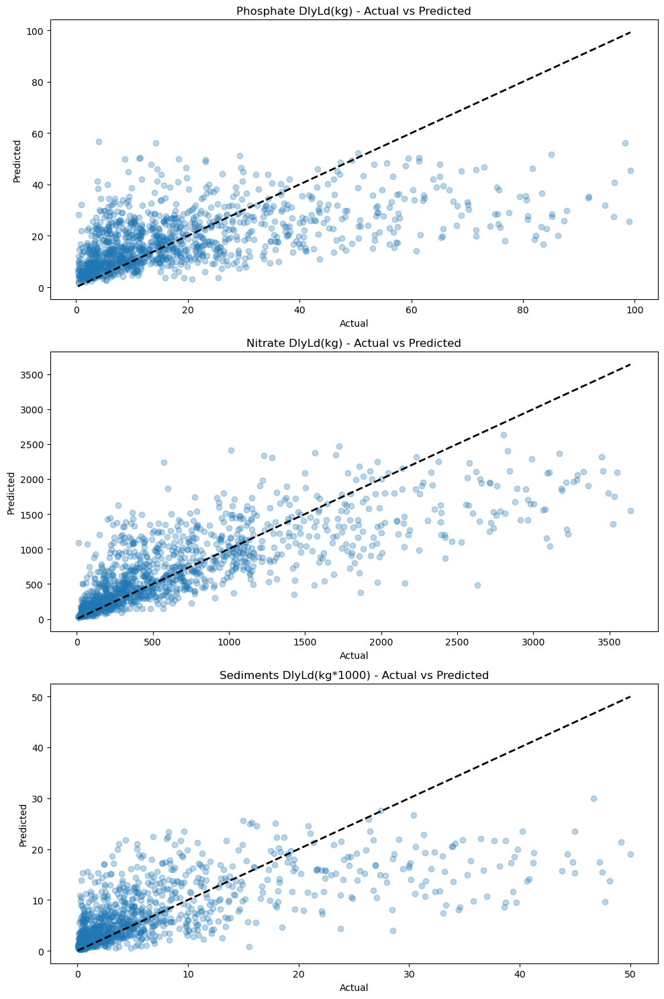

In [ ]:
# Plotting the results
fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(10, 15))

for i, target in enumerate(targets):
    ax = axes[i]
    ax.scatter(y_tests[target][target], model_preds[target], alpha=0.3)
    ax.plot([y_tests[target][target].min(), y_tests[target][target].max()], [y_tests[target][target].min(), y_tests[target][target].max()], 'k--', lw=2)
    ax.set_xlabel('Actual')
    ax.set_ylabel('Predicted')
    ax.set_title(f'{target} - Actual vs Predicted')

plt.tight_layout()
plt.show()

##### Line Chart

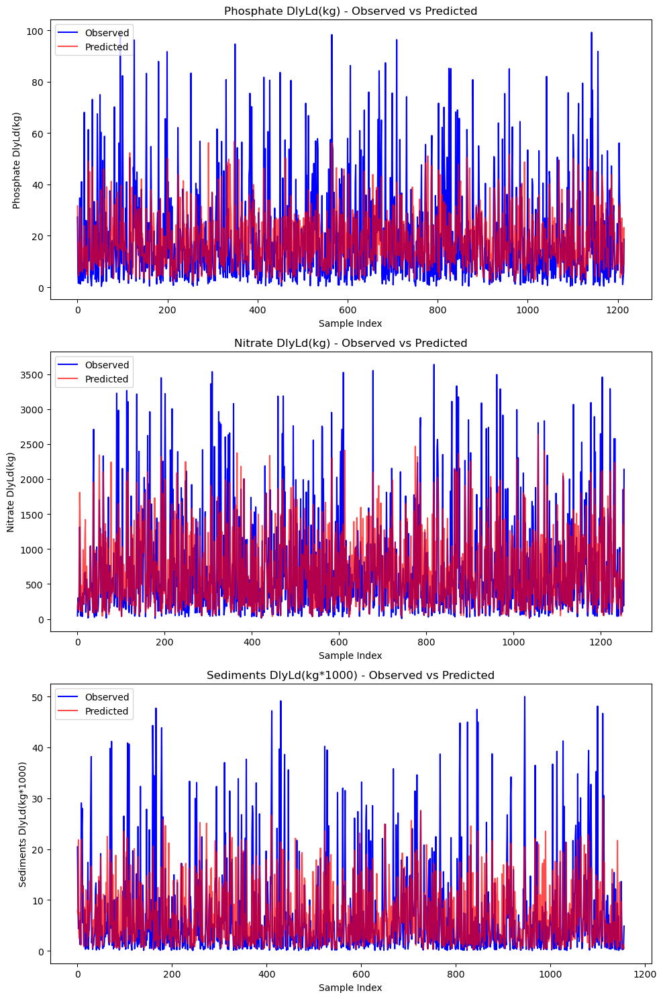

In [ ]:
# Plotting the results
fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(10, 15))

for i, target in enumerate(targets):
    ax = axes[i]
    ax.plot(y_tests[target][target].values, label='Observed', color='blue')
    ax.plot(model_preds[target], label='Predicted', color='red', alpha=0.7)
    ax.set_xlabel('Sample Index')
    ax.set_ylabel(target)
    ax.set_title(f'{target} - Observed vs Predicted')
    ax.legend()

plt.tight_layout()
plt.show()

## Experiment 8) calibrated SWAT streamflow + SWAT water qual 

#### Training

In [66]:
sediments_calibrated_water_quality_df =pd.read_excel("data/CalibratedWaterQuality.xlsx", sheet_name="Sediments")
sediments_calibrated_water_quality_df.rename(columns={"Simulated": "Calibrated_SWAT_Sediments DlyLd(kg*1000)"}, inplace=True)
nitrate_calibrated_water_quality_df =pd.read_excel("data/CalibratedWaterQuality.xlsx", sheet_name="Nitrate")
nitrate_calibrated_water_quality_df.rename(columns={"Simulated": "Calibrated_SWAT_Nitrate DlyLd(kg)"}, inplace=True)
phosphate_calibrated_water_quality_df =pd.read_excel("data/CalibratedWaterQuality.xlsx", sheet_name="Phosphate")
phosphate_calibrated_water_quality_df.rename(columns={"Simulated": "Calibrated_SWAT_Phosphate DlyLd(kg)"}, inplace=True)

calibrated_streamflow_df = pd.read_excel("data/Calibrated Streamflow data.xlsx")
calibrated_streamflow_df.rename(columns={"Simulated": "Calibrated_SWAT_Streamflow"}, inplace=True)

calibrated_water_quality_df = pd.merge(
    sediments_calibrated_water_quality_df, nitrate_calibrated_water_quality_df, on="Date"
)

calibrated_water_quality_df = pd.merge(
    calibrated_water_quality_df, phosphate_calibrated_water_quality_df, on="Date"
)

calibrated_swat_simulations_df = pd.merge(
    calibrated_streamflow_df, calibrated_water_quality_df, on="Date"
)


calibrated_swat_simulations_df

,Date,Calibrated_SWAT_Streamflow,Calibrated_SWAT_Sediments DlyLd(kg*1000),Calibrated_SWAT_Nitrate DlyLd(kg),Calibrated_SWAT_Phosphate DlyLd(kg)
0,1993-01-01,36.110,72.0400,874.90,49.8900
1,1993-01-02,36.200,44.4200,232.20,17.2600
2,1993-01-03,33.750,26.6100,1133.00,39.9900
3,1993-01-04,34.430,32.7800,1213.00,72.1200
4,1993-01-05,46.330,43.5200,1135.00,116.7000
...,...,...,...,...,...
6477,2010-09-26,1.093,0.8149,17.45,0.2327
6478,2010-09-27,2.336,2.7360,66.74,11.9800
6479,2010-09-28,3.154,3.8130,88.67,16.6600
6480,2010-09-29,4.023,5.3260,150.10,21.2600


In [67]:
# Define the hyperparameter distribution for Random Forest
param_dist = {
    "n_estimators": sp_randint(100, 1000),
    "max_features": [0.5, 0.75, 1.0, "sqrt", "log2"],
    "min_samples_split": sp_randint(2, 5),
    "min_samples_leaf": sp_randint(1, 20),
}

# Assuming training data and target data are already defined as per your context
# Merge training data with streamflow output (using date)
training_data = pd.merge(
    input_df, calibrated_swat_simulations_df, left_on="date", right_on="Date"
).drop(columns=["Date"])

# Define the target variables
targets = ["Phosphate DlyLd(kg)", "Nitrate DlyLd(kg)", "Sediments DlyLd(kg*1000)"]

# Define the Random Forest Regressor model
rf_model = RandomForestRegressor(random_state=42)


# Perform randomized hyperparameter search on train + validation set
n_iter_search = 7  # Number of parameter settings to sample
random_search = RandomizedSearchCV(
    rf_model,
    param_distributions=param_dist,
    cv=5,
    n_iter=n_iter_search,
    n_jobs=-1,
    verbose=3,
)

# Run experiments for each target variable
results = {target: {} for target in targets}
model_preds = {}
y_tests = {}
for target in targets:
    mlflow.set_experiment(f"Initial Experiments")
    with mlflow.start_run(
        run_name=f"{target.split()[0]}_Calibrated_SWAT_Streamflow_Water_Quality_rf"
    ):
    # Merge with water quality data
        train = pd.merge(
            training_data, target_datasets[target], left_on="date", right_on="DATE"
        ).drop(columns=["DATE"])

        # Define input features (X) and target (y)
        X = train.drop(
            columns=[
                "date",
                target
            ]
        )

        # X = X.drop(columns=[col for col in X.columns if col.startswith("SWAT") and col != f"SWAT_{target}"])

        y = train[[target]]

        # Split the data into train (60%), validation (20%), and test (20%) sets
        X_train, X_temp, y_train, y_temp = train_test_split(
            X, y, test_size=0.3, random_state=42, shuffle=False
        )
        X_val, X_test, y_val, y_test = train_test_split(
            X_temp, y_temp, test_size=0.5, random_state=42, shuffle=False
        )
        y_tests[target] = y_test

        #print size of each dataset
        print(f"Size of training dataset for target variable {target}: {X_train.shape[0]}")
        print(f"Size of validation dataset for target variable {target}: {X_val.shape[0]}")
        print(f"Size of test dataset for target variable {target}: {X_test.shape[0]}")

        # Standardize the data (train/val/test separately)
        scaler = StandardScaler()
        X_train = scaler.fit_transform(X_train)
        X_val = scaler.transform(X_val)
        X_test = scaler.transform(X_test)

        # Hyperparameter tuning on training and validation data
        # random_search.fit(X_train, y_train[target])
        
        # mlflow.log_params(random_search.best_params_)

        # # Best model after RandomizedSearchCV
        # best_rf_model = random_search.best_estimator_
        best_params = hyperopt_rf_tuning(X_train, y_train[target])
        print(f"Best hyperparameters for target variable {target}: {best_params}")
        best_rf_model = RandomForestRegressor(**best_params, random_state=42)

        # Retrain the best model on combined train + val data
        X_train_val = np.vstack([X_train, X_val])
        y_train_val = np.hstack([y_train[target], y_val[target]])
        best_rf_model.fit(X_train_val, y_train_val)

        # Evaluate the model on the test set
        y_pred = best_rf_model.predict(X_test)
        model_preds[target] = y_pred

        # Calculate performance metrics
        nse = nse_score(y_test[target], y_pred)
        pbias = pbias_score(y_test[target], y_pred)
        r2 = r2_score(y_test[target], y_pred)

        mlflow.log_metrics({"R2": r2, "NSE": nse, "PBIAS": pbias})

        # Store feature importances for Random Forest
        feature_importances = best_rf_model.feature_importances_
        results[target] = {
            "NSE": nse,
            "PBIAS": pbias,
            "R2": r2,
            "Feature Importances": feature_importances,
            "Input Features": X.columns
        }
        mlflow.sklearn.log_model(best_rf_model, "model")

# Print the final results for all target variables
pprint(results)


Size of training dataset for target variable Phosphate DlyLd(kg): 4534
Size of validation dataset for target variable Phosphate DlyLd(kg): 972
Size of test dataset for target variable Phosphate DlyLd(kg): 972
100%|██████████| 50/50 [01:57<00:00,  2.35s/trial, best loss: 26.602640167413124]
Best hyperparameters for target variable Phosphate DlyLd(kg): {'n_estimators': 300, 'max_depth': 18, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': None}


2025/02/24 18:38:01 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Size of training dataset for target variable Nitrate DlyLd(kg): 4534
Size of validation dataset for target variable Nitrate DlyLd(kg): 972
Size of test dataset for target variable Nitrate DlyLd(kg): 972
100%|██████████| 50/50 [02:21<00:00,  2.84s/trial, best loss: 19026.16043986644] 
Best hyperparameters for target variable Nitrate DlyLd(kg): {'n_estimators': 300, 'max_depth': 27, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': None}


2025/02/24 18:40:34 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Size of training dataset for target variable Sediments DlyLd(kg*1000): 4534
Size of validation dataset for target variable Sediments DlyLd(kg*1000): 972
Size of test dataset for target variable Sediments DlyLd(kg*1000): 972
100%|██████████| 50/50 [02:07<00:00,  2.55s/trial, best loss: 12.40031139559453] 
Best hyperparameters for target variable Sediments DlyLd(kg*1000): {'n_estimators': 300, 'max_depth': 18, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': None}


2025/02/24 18:42:52 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


{'Nitrate DlyLd(kg)': {'Feature Importances': array([0.16355733, 0.01770359, 0.02347741, 0.06009336, 0.04100227,
       0.02377934, 0.47571573, 0.04497964, 0.05233096, 0.02394142,
       0.05449002, 0.01892893]),
                       'Input Features': Index(['DOY', 'Precipitation', 'Evapotranspiration', 'MaxT', 'MinT', 'month_x',
       'Calibrated_SWAT_Streamflow',
       'Calibrated_SWAT_Sediments DlyLd(kg*1000)',
       'Calibrated_SWAT_Nitrate DlyLd(kg)',
       'Calibrated_SWAT_Phosphate DlyLd(kg)', 'YEAR', 'month_y'],
      dtype='object'),
                       'NSE': 0.551260341232418,
                       'PBIAS': 28.72875378263299,
                       'R2': 0.5430909086378268},
 'Phosphate DlyLd(kg)': {'Feature Importances': array([0.05293856, 0.02599304, 0.03139772, 0.0282118 , 0.03010959,
       0.0055723 , 0.61835926, 0.04409797, 0.03214834, 0.03460655,
       0.09040809, 0.00615679]),
                         'Input Features': Index(['DOY', 'Precipitation', 'Evapo

#### Evaluation

##### Metrics

In [68]:
# create dataframe for exp3_results only showing the metrics
results_df = pd.DataFrame(results).T#.drop(columns=["Feature Importances"])
results_df

,NSE,PBIAS,R2,Feature Importances,Input Features
Phosphate DlyLd(kg),0.451513,5.479848,0.644318,"[0.052938557151376325, 0.025993040145124928, 0...","Index(['DOY', 'Precipitation', 'Evapotranspira..."
Nitrate DlyLd(kg),0.55126,28.728754,0.543091,"[0.1635573258811447, 0.017703590923893314, 0.0...","Index(['DOY', 'Precipitation', 'Evapotranspira..."
Sediments DlyLd(kg*1000),0.475063,1.595419,0.699571,"[0.0581875122334325, 0.026731878555471003, 0.0...","Index(['DOY', 'Precipitation', 'Evapotranspira..."


##### Feature Importances

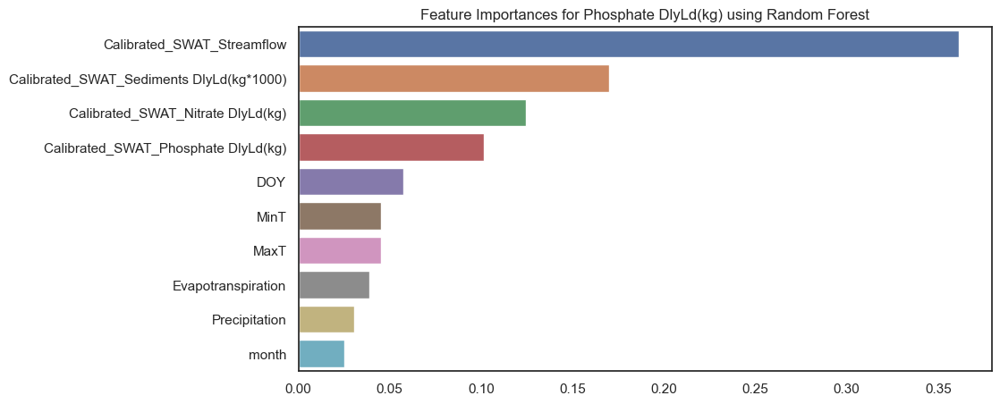

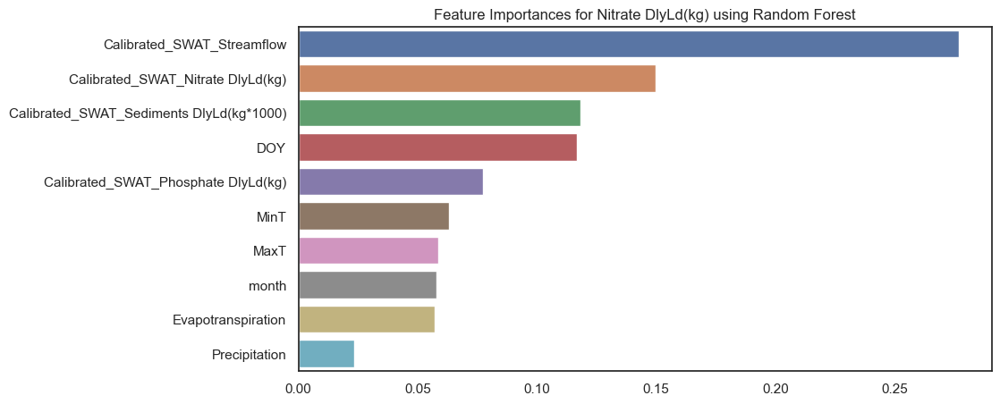

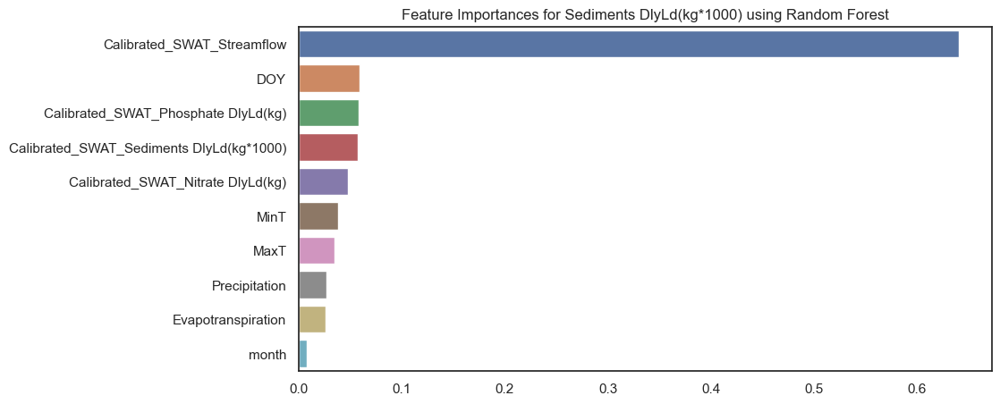

In [205]:
# plot feature importances and arrange them in descending order
for target in targets:
   
    feature_importances = results[target]["Feature Importances"]
    sorted_indices = np.argsort(feature_importances)[::-1]
    sorted_features = X.columns[sorted_indices]
    sorted_importances = feature_importances[sorted_indices]

    plt.figure(figsize=(10, 5))
    sns.barplot(x=sorted_importances, y=sorted_features)
    plt.title(f"Feature Importances for {target} using Random Forest")
    plt.show()

##### Actual vs Predicted

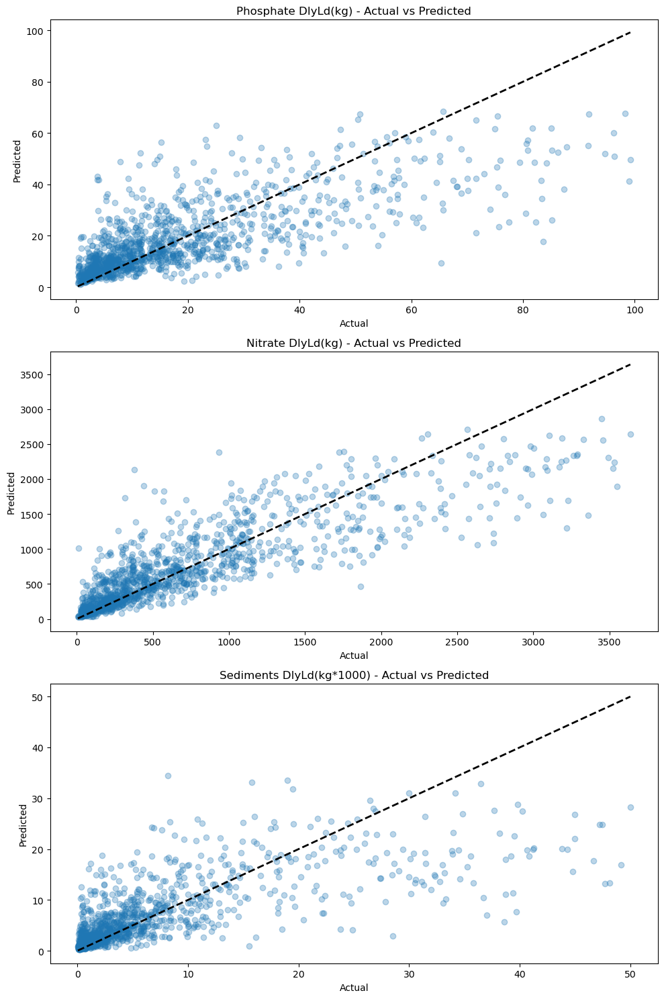

In [ ]:
# Plotting the results
fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(10, 15))

for i, target in enumerate(targets):
    ax = axes[i]
    ax.scatter(y_tests[target][target], model_preds[target], alpha=0.3)
    ax.plot([y_tests[target][target].min(), y_tests[target][target].max()], [y_tests[target][target].min(), y_tests[target][target].max()], 'k--', lw=2)
    ax.set_xlabel('Actual')
    ax.set_ylabel('Predicted')
    ax.set_title(f'{target} - Actual vs Predicted')

plt.tight_layout()
plt.show()

##### Line Chart

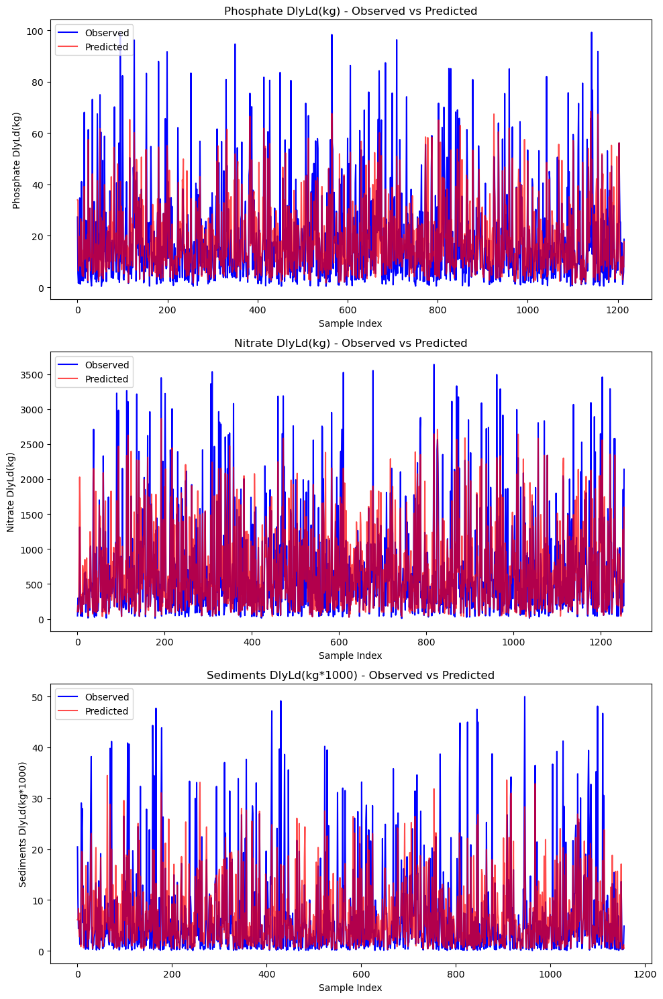

In [ ]:
# Plotting the results
fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(10, 15))

for i, target in enumerate(targets):
    ax = axes[i]
    ax.plot(y_tests[target][target].values, label='Observed', color='blue')
    ax.plot(model_preds[target], label='Predicted', color='red', alpha=0.7)
    ax.set_xlabel('Sample Index')
    ax.set_ylabel(target)
    ax.set_title(f'{target} - Observed vs Predicted')
    ax.legend()

plt.tight_layout()
plt.show()

## Experiment 9) calibrated SWAT streamflow + Individual SWAT water qual 

#### Training

In [69]:
sediments_calibrated_water_quality_df =pd.read_excel("data/CalibratedWaterQuality.xlsx", sheet_name="Sediments")
sediments_calibrated_water_quality_df.rename(columns={"Simulated": "Calibrated_SWAT_Sediments DlyLd(kg*1000)"}, inplace=True)
nitrate_calibrated_water_quality_df =pd.read_excel("data/CalibratedWaterQuality.xlsx", sheet_name="Nitrate")
nitrate_calibrated_water_quality_df.rename(columns={"Simulated": "Calibrated_SWAT_Nitrate DlyLd(kg)"}, inplace=True)
phosphate_calibrated_water_quality_df =pd.read_excel("data/CalibratedWaterQuality.xlsx", sheet_name="Phosphate")
phosphate_calibrated_water_quality_df.rename(columns={"Simulated": "Calibrated_SWAT_Phosphate DlyLd(kg)"}, inplace=True)

calibrated_streamflow_df = pd.read_excel("data/Calibrated Streamflow data.xlsx")
calibrated_streamflow_df.rename(columns={"Simulated": "Calibrated_Sim_Streamflow"}, inplace=True)

calibrated_water_quality_df = pd.merge(
    sediments_calibrated_water_quality_df, nitrate_calibrated_water_quality_df, on="Date"
)

calibrated_water_quality_df = pd.merge(
    calibrated_water_quality_df, phosphate_calibrated_water_quality_df, on="Date"
)

calibrated_swat_simulations_df = pd.merge(
    calibrated_streamflow_df, calibrated_water_quality_df, on="Date"
)


calibrated_swat_simulations_df

,Date,Calibrated_Sim_Streamflow,Calibrated_SWAT_Sediments DlyLd(kg*1000),Calibrated_SWAT_Nitrate DlyLd(kg),Calibrated_SWAT_Phosphate DlyLd(kg)
0,1993-01-01,36.110,72.0400,874.90,49.8900
1,1993-01-02,36.200,44.4200,232.20,17.2600
2,1993-01-03,33.750,26.6100,1133.00,39.9900
3,1993-01-04,34.430,32.7800,1213.00,72.1200
4,1993-01-05,46.330,43.5200,1135.00,116.7000
...,...,...,...,...,...
6477,2010-09-26,1.093,0.8149,17.45,0.2327
6478,2010-09-27,2.336,2.7360,66.74,11.9800
6479,2010-09-28,3.154,3.8130,88.67,16.6600
6480,2010-09-29,4.023,5.3260,150.10,21.2600


In [70]:
# Define the hyperparameter distribution for Random Forest
param_dist = {
    "n_estimators": sp_randint(100, 1000),
    "max_features": [0.5, 0.75, 1.0, "sqrt", "log2"],
    "min_samples_split": sp_randint(2, 5),
    "min_samples_leaf": sp_randint(1, 20),
}

# Assuming training data and target data are already defined as per your context
# Merge training data with streamflow output (using date)
training_data = pd.merge(
    input_df, calibrated_swat_simulations_df, left_on="date", right_on="Date"
).drop(columns=["Date"])

# Define the target variables
targets = ["Phosphate DlyLd(kg)", "Nitrate DlyLd(kg)", "Sediments DlyLd(kg*1000)"]

# Define the Random Forest Regressor model
rf_model = RandomForestRegressor(random_state=42)


# Perform randomized hyperparameter search on train + validation set
n_iter_search = 7  # Number of parameter settings to sample
random_search = RandomizedSearchCV(
    rf_model,
    param_distributions=param_dist,
    cv=5,
    n_iter=n_iter_search,
    n_jobs=-1,
    verbose=3,
)

# Run experiments for each target variable
results = {target: {} for target in targets}
model_preds = {}
y_tests = {}
for target in targets:
    mlflow.set_experiment(f"Initial Experiments")
    with mlflow.start_run(
        run_name=f"{target.split()[0]}_Calibrated_SWAT_Streamflow_Ind_Water_Quality_rf"
    ):
    # Merge with water quality data
        train = pd.merge(
            training_data, target_datasets[target], left_on="date", right_on="DATE"
        ).drop(columns=["DATE"])

        # Define input features (X) and target (y)
        X = train.drop(
            columns=[
                "date",
                target
            ]
        )

        X = X.drop(columns=[col for col in X.columns if col.startswith("Calibrated_SWAT") and col != f"Calibrated_SWAT_{target}"])

        y = train[[target]]

        # Split the data into train (60%), validation (20%), and test (20%) sets
        X_train, X_temp, y_train, y_temp = train_test_split(
            X, y, test_size=0.3, random_state=42, shuffle=False
        )
        X_val, X_test, y_val, y_test = train_test_split(
            X_temp, y_temp, test_size=0.5, random_state=42, shuffle=False
        )
        y_tests[target] = y_test

        #print size of each dataset
        print(f"Size of training dataset for target variable {target}: {X_train.shape[0]}")
        print(f"Size of validation dataset for target variable {target}: {X_val.shape[0]}")
        print(f"Size of test dataset for target variable {target}: {X_test.shape[0]}")

        # Standardize the data (train/val/test separately)
        scaler = StandardScaler()
        X_train = scaler.fit_transform(X_train)
        X_val = scaler.transform(X_val)
        X_test = scaler.transform(X_test)

        # Hyperparameter tuning on training and validation data
        # random_search.fit(X_train, y_train[target])
        
        # mlflow.log_params(random_search.best_params_)

        # # Best model after RandomizedSearchCV
        # best_rf_model = random_search.best_estimator_
        best_params = hyperopt_rf_tuning(X_train, y_train[target])
        print(f"Best hyperparameters for target variable {target}: {best_params}")
        best_rf_model = RandomForestRegressor(**best_params, random_state=42)

        # Retrain the best model on combined train + val data
        X_train_val = np.vstack([X_train, X_val])
        y_train_val = np.hstack([y_train[target], y_val[target]])
        best_rf_model.fit(X_train_val, y_train_val)

        # Evaluate the model on the test set
        y_pred = best_rf_model.predict(X_test)
        model_preds[target] = y_pred

        # Calculate performance metrics
        nse = nse_score(y_test[target], y_pred)
        pbias = pbias_score(y_test[target], y_pred)
        r2 = r2_score(y_test[target], y_pred)

        mlflow.log_metrics({"R2": r2, "NSE": nse, "PBIAS": pbias})

        # Store feature importances for Random Forest
        feature_importances = best_rf_model.feature_importances_
        results[target] = {
            "NSE": nse,
            "PBIAS": pbias,
            "R2": r2,
            "Feature Importances": feature_importances,
        }
        mlflow.sklearn.log_model(best_rf_model, "model")

# Print the final results for all target variables
pprint(results)


Size of training dataset for target variable Phosphate DlyLd(kg): 4534
Size of validation dataset for target variable Phosphate DlyLd(kg): 972
Size of test dataset for target variable Phosphate DlyLd(kg): 972
100%|██████████| 50/50 [01:57<00:00,  2.35s/trial, best loss: 26.449360684123736]
Best hyperparameters for target variable Phosphate DlyLd(kg): {'n_estimators': 240, 'max_depth': 29, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': None}


2025/02/24 18:44:58 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Size of training dataset for target variable Nitrate DlyLd(kg): 4534
Size of validation dataset for target variable Nitrate DlyLd(kg): 972
Size of test dataset for target variable Nitrate DlyLd(kg): 972
100%|██████████| 50/50 [01:54<00:00,  2.29s/trial, best loss: 19147.929310309653]
Best hyperparameters for target variable Nitrate DlyLd(kg): {'n_estimators': 300, 'max_depth': 27, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': None}


2025/02/24 18:47:02 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Size of training dataset for target variable Sediments DlyLd(kg*1000): 4534
Size of validation dataset for target variable Sediments DlyLd(kg*1000): 972
Size of test dataset for target variable Sediments DlyLd(kg*1000): 972
100%|██████████| 50/50 [01:43<00:00,  2.07s/trial, best loss: 12.715829198782194]
Best hyperparameters for target variable Sediments DlyLd(kg*1000): {'n_estimators': 300, 'max_depth': 18, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': None}


2025/02/24 18:48:55 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


{'Nitrate DlyLd(kg)': {'Feature Importances': array([0.17079329, 0.02182117, 0.02704697, 0.06340393, 0.04536744,
       0.02301078, 0.5014346 , 0.06693044, 0.06055662, 0.01963475]),
                       'NSE': 0.5329459857678074,
                       'PBIAS': 28.34736407455675,
                       'R2': 0.5334089602871029},
 'Phosphate DlyLd(kg)': {'Feature Importances': array([0.06290085, 0.03071493, 0.03967994, 0.03552009, 0.0361806 ,
       0.00626323, 0.63802234, 0.05028604, 0.09384738, 0.0065846 ]),
                         'NSE': 0.4618804412285087,
                         'PBIAS': 4.8607655765116355,
                         'R2': 0.6391442010394497},
 'Sediments DlyLd(kg*1000)': {'Feature Importances': array([0.07954898, 0.03614276, 0.03385827, 0.03961149, 0.04896556,
       0.00606996, 0.64347928, 0.06796394, 0.03813771, 0.00622206]),
                              'NSE': 0.46918097180921436,
                              'PBIAS': 3.6672662675545875,
                   

#### Evaluation

##### Metrics

In [71]:
# create dataframe for exp3_results only showing the metrics
results_df = pd.DataFrame(results).T#.drop(columns=["Feature Importances"])
results_df

,NSE,PBIAS,R2,Feature Importances
Phosphate DlyLd(kg),0.46188,4.860766,0.639144,"[0.06290085016174395, 0.030714929781174287, 0...."
Nitrate DlyLd(kg),0.532946,28.347364,0.533409,"[0.17079329213075806, 0.02182117217651741, 0.0..."
Sediments DlyLd(kg*1000),0.469181,3.667266,0.687123,"[0.07954897504812003, 0.03614276430954783, 0.0..."


##### Feature Importances

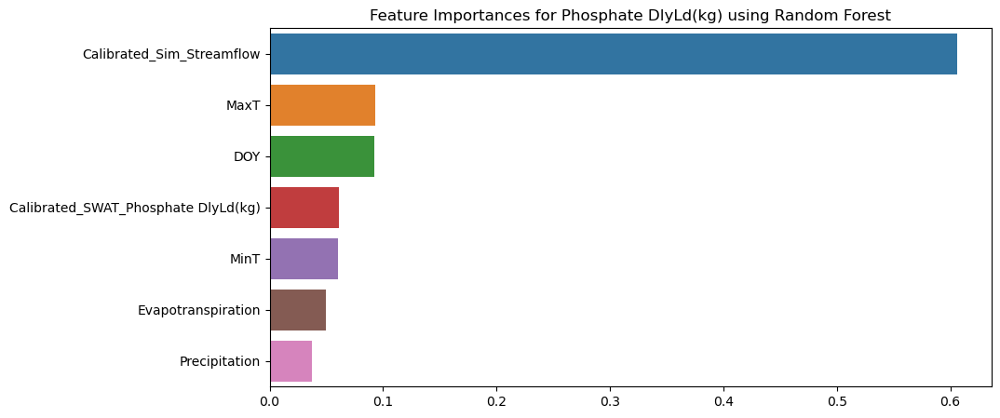

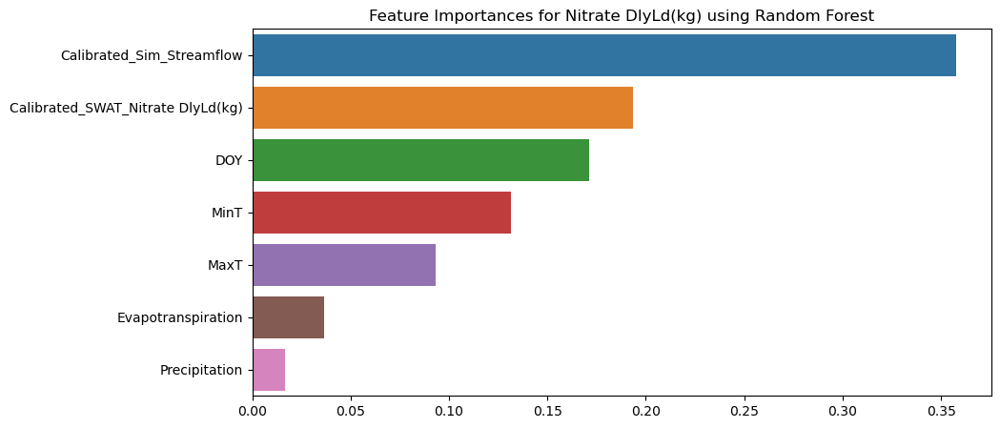

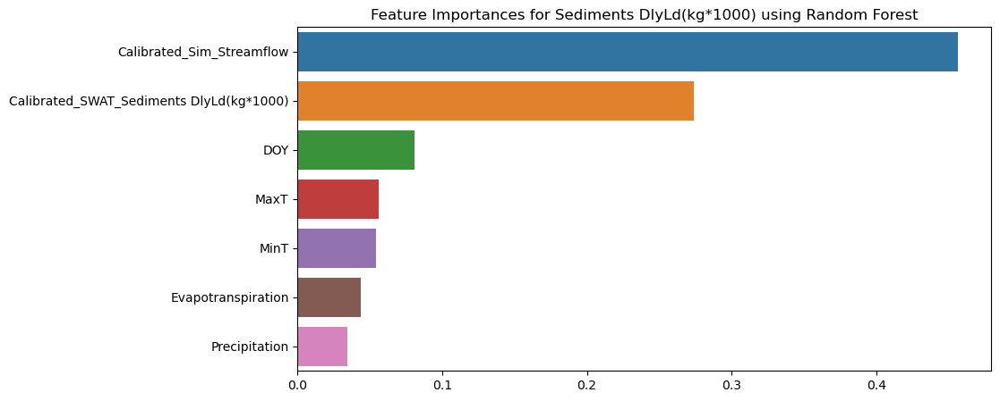

In [ ]:
# plot feature importances and arrange them in descending order
for target in targets:
   
    feature_importances = results[target]["Feature Importances"]
    sorted_indices = np.argsort(feature_importances)[::-1]
    sorted_features = results[target]['Input Features'][sorted_indices]
    sorted_importances = feature_importances[sorted_indices]

    plt.figure(figsize=(10, 5))
    sns.barplot(x=sorted_importances, y=sorted_features)
    plt.title(f"Feature Importances for {target} using Random Forest")
    plt.show()

##### Actual vs Predicted

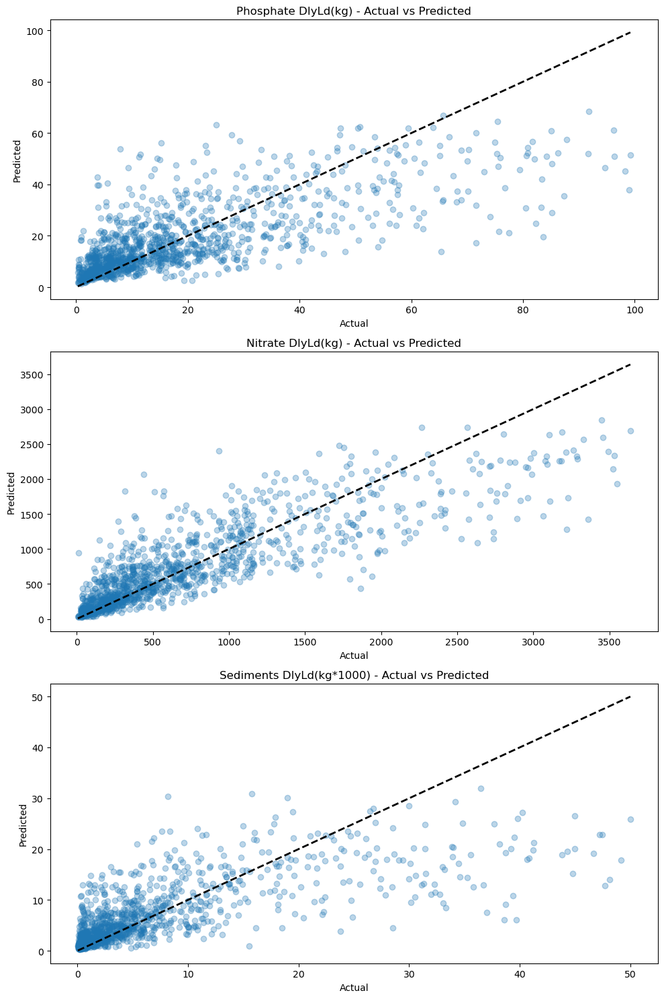

In [ ]:
# Plotting the results
fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(10, 15))

for i, target in enumerate(targets):
    ax = axes[i]
    ax.scatter(y_tests[target][target], model_preds[target], alpha=0.3)
    ax.plot([y_tests[target][target].min(), y_tests[target][target].max()], [y_tests[target][target].min(), y_tests[target][target].max()], 'k--', lw=2)
    ax.set_xlabel('Actual')
    ax.set_ylabel('Predicted')
    ax.set_title(f'{target} - Actual vs Predicted')

plt.tight_layout()
plt.show()

##### Line Chart

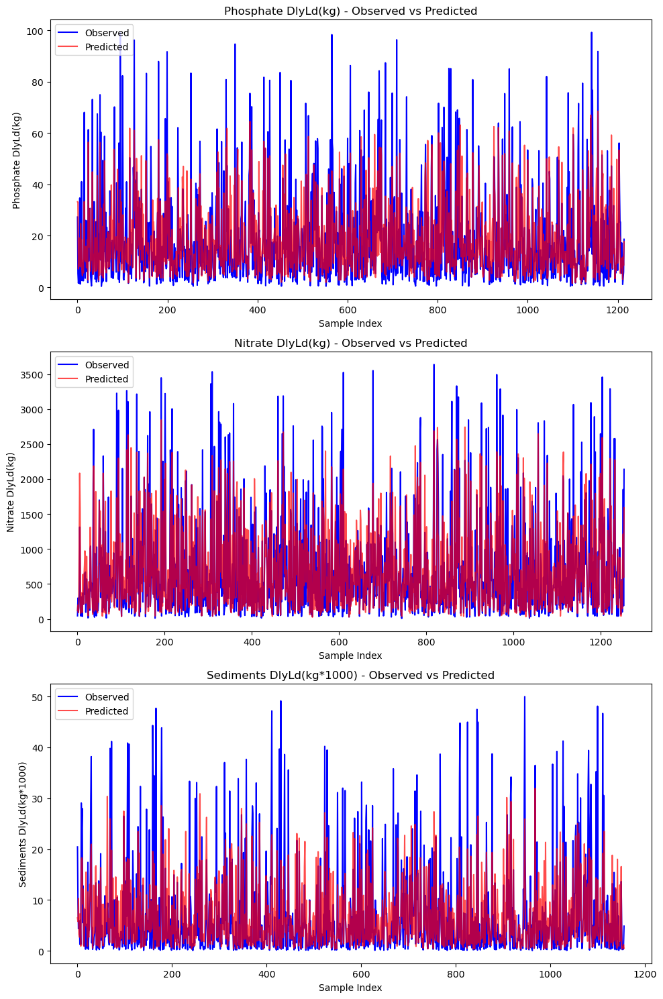

In [ ]:
# Plotting the results
fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(10, 15))

for i, target in enumerate(targets):
    ax = axes[i]
    ax.plot(y_tests[target][target].values, label='Observed', color='blue')
    ax.plot(model_preds[target], label='Predicted', color='red', alpha=0.7)
    ax.set_xlabel('Sample Index')
    ax.set_ylabel(target)
    ax.set_title(f'{target} - Observed vs Predicted')
    ax.legend()

plt.tight_layout()
plt.show()

## Experiment 12) calibrated SWAT streamflow + Selected SWAT water qual

#### Training

In [128]:
sediments_calibrated_water_quality_df =pd.read_excel("data/CalibratedWaterQuality.xlsx", sheet_name="Sediments")
sediments_calibrated_water_quality_df.rename(columns={"Simulated": "Calibrated_SWAT_Sediments DlyLd(kg*1000)"}, inplace=True)
nitrate_calibrated_water_quality_df =pd.read_excel("data/CalibratedWaterQuality.xlsx", sheet_name="Nitrate")
nitrate_calibrated_water_quality_df.rename(columns={"Simulated": "Calibrated_SWAT_Nitrate DlyLd(kg)"}, inplace=True)
phosphate_calibrated_water_quality_df =pd.read_excel("data/CalibratedWaterQuality.xlsx", sheet_name="Phosphate")
phosphate_calibrated_water_quality_df.rename(columns={"Simulated": "Calibrated_SWAT_Phosphate DlyLd(kg)"}, inplace=True)

calibrated_streamflow_df = pd.read_excel("data/Calibrated Streamflow data.xlsx")
calibrated_streamflow_df.rename(columns={"Simulated": "Calibrated_SWAT_Streamflow"}, inplace=True)

calibrated_water_quality_df = pd.merge(
    sediments_calibrated_water_quality_df, nitrate_calibrated_water_quality_df, on="Date"
)

calibrated_water_quality_df = pd.merge(
    calibrated_water_quality_df, phosphate_calibrated_water_quality_df, on="Date"
)

calibrated_swat_simulations_df = pd.merge(
    calibrated_streamflow_df, calibrated_water_quality_df, on="Date"
)


calibrated_swat_simulations_df

,Date,Calibrated_SWAT_Streamflow,Calibrated_SWAT_Sediments DlyLd(kg*1000),Calibrated_SWAT_Nitrate DlyLd(kg),Calibrated_SWAT_Phosphate DlyLd(kg)
0,1993-01-01,36.110,72.0400,874.90,49.8900
1,1993-01-02,36.200,44.4200,232.20,17.2600
2,1993-01-03,33.750,26.6100,1133.00,39.9900
3,1993-01-04,34.430,32.7800,1213.00,72.1200
4,1993-01-05,46.330,43.5200,1135.00,116.7000
...,...,...,...,...,...
6477,2010-09-26,1.093,0.8149,17.45,0.2327
6478,2010-09-27,2.336,2.7360,66.74,11.9800
6479,2010-09-28,3.154,3.8130,88.67,16.6600
6480,2010-09-29,4.023,5.3260,150.10,21.2600


In [129]:
features = {
    "Sediments DlyLd(kg*1000)": [
        "Calibrated_SWAT_Streamflow",
        "Calibrated_SWAT_Sediments DlyLd(kg*1000)",
    ],
    "Nitrate DlyLd(kg)": [
        "Calibrated_SWAT_Streamflow",
        "Calibrated_SWAT_Sediments DlyLd(kg*1000)",
        "Calibrated_SWAT_Nitrate DlyLd(kg)",
    ],
    "Phosphate DlyLd(kg)": [
        "Calibrated_SWAT_Streamflow",
        "Calibrated_SWAT_Sediments DlyLd(kg*1000)",
        "Calibrated_SWAT_Nitrate DlyLd(kg)",
        "Calibrated_SWAT_Phosphate DlyLd(kg)",
    ],
    "TotalP": [
        "Calibrated_SWAT_Streamflow",
        "Calibrated_SWAT_Sediments DlyLd(kg*1000)",
        "Calibrated_SWAT_Nitrate DlyLd(kg)",
        "Calibrated_SWAT_Phosphate DlyLd(kg)",
        "Calibrated_SWAT_TotalP",
    ],
}

In [130]:
# Define the hyperparameter distribution for Random Forest
param_dist = {
    "n_estimators": sp_randint(100, 1000),
    "max_features": [0.5, 0.75, 1.0, "sqrt", "log2"],
    "min_samples_split": sp_randint(2, 5),
    "min_samples_leaf": sp_randint(1, 20),
}

# Assuming training data and target data are already defined as per your context
# Merge training data with streamflow output (using date)
training_data = pd.merge(
    input_df, calibrated_swat_simulations_df, left_on="date", right_on="Date"
).drop(columns=["Date"])

# Define the target variables
targets = ["Phosphate DlyLd(kg)", "Nitrate DlyLd(kg)", "Sediments DlyLd(kg*1000)"]

# Define the Random Forest Regressor model
rf_model = RandomForestRegressor(random_state=42)


# Perform randomized hyperparameter search on train + validation set
n_iter_search = 7  # Number of parameter settings to sample
random_search = RandomizedSearchCV(
    rf_model,
    param_distributions=param_dist,
    cv=5,
    n_iter=n_iter_search,
    n_jobs=-1,
    verbose=3,
)

# Run experiments for each target variable
results = {target: {} for target in targets}
model_preds = {}
y_tests = {}
for target in targets:
    mlflow.set_experiment(f"Initial Experiments")
    with mlflow.start_run(
        run_name=f"{target.split()[0]}_Calibrated_SWAT_Streamflow_Phys_based_Water_Quality_rf_rem"
    ):
    # Merge with water quality data
        train = pd.merge(
            training_data, target_datasets[target], left_on="date", right_on="DATE"
        ).drop(columns=["DATE"])

        # Define input features (X) and target (y)
        X = train.drop(
            columns=[
                "date",
                target
            ]
        )

        X = X.drop(
            columns=[
                col
                for col in X.columns
                if col.startswith("Calibrated_SWAT") and col not in features[target]
            ]
        )

        y = train[[target]]

        # Split the data into train (60%), validation (20%), and test (20%) sets
        X_train, X_temp, y_train, y_temp = train_test_split(
            X, y, test_size=0.3, random_state=42, shuffle=False
        )
        X_val, X_test, y_val, y_test = train_test_split(
            X_temp, y_temp, test_size=0.5, random_state=42, shuffle=False
        )
        y_tests[target] = y_test

        #print size of each dataset
        print(f"Size of training dataset for target variable {target}: {X_train.shape[0]}")
        print(f"Size of validation dataset for target variable {target}: {X_val.shape[0]}")
        print(f"Size of test dataset for target variable {target}: {X_test.shape[0]}")

        # Standardize the data (train/val/test separately)
        scaler = StandardScaler()
        X_train = scaler.fit_transform(X_train)
        X_val = scaler.transform(X_val)
        X_test = scaler.transform(X_test)

        # Hyperparameter tuning on training and validation data
        # random_search.fit(X_train, y_train[target])
        
        # mlflow.log_params(random_search.best_params_)

        # # Best model after RandomizedSearchCV
        # best_rf_model = random_search.best_estimator_
        best_params = hyperopt_rf_tuning(X_train, y_train[target])
        print(f"Best hyperparameters for target variable {target}: {best_params}")
        best_rf_model = RandomForestRegressor(**best_params, random_state=42)

        # Retrain the best model on combined train + val data
        X_train_val = np.vstack([X_train, X_val])
        y_train_val = np.hstack([y_train[target], y_val[target]])
        best_rf_model.fit(X_train_val, y_train_val)

        # Evaluate the model on the test set
        y_pred = best_rf_model.predict(X_test)
        model_preds[target] = y_pred

        # Calculate performance metrics
        nse = nse_score(y_test[target], y_pred)
        pbias = pbias_score(y_test[target], y_pred)
        r2 = r2_score(y_test[target], y_pred)

        mlflow.log_metrics({"R2": r2, "NSE": nse, "PBIAS": pbias})

        # Store feature importances for Random Forest
        feature_importances = best_rf_model.feature_importances_
        results[target] = {
            "NSE": nse,
            "PBIAS": pbias,
            "R2": r2,
            "Feature Importances": feature_importances,
            "Input Features": X.columns,
        }
        mlflow.sklearn.log_model(best_rf_model, "model")

# Print the final results for all target variables
pprint(results)


Size of training dataset for target variable Phosphate DlyLd(kg): 4324
Size of validation dataset for target variable Phosphate DlyLd(kg): 927
Size of test dataset for target variable Phosphate DlyLd(kg): 927
100%|██████████| 50/50 [01:22<00:00,  1.64s/trial, best loss: 26.22343039904706] 
Best hyperparameters for target variable Phosphate DlyLd(kg): {'n_estimators': 140, 'max_depth': 28, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'sqrt'}


2025/02/25 00:18:49 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Size of training dataset for target variable Nitrate DlyLd(kg): 4444
Size of validation dataset for target variable Nitrate DlyLd(kg): 952
Size of test dataset for target variable Nitrate DlyLd(kg): 953
100%|██████████| 50/50 [02:01<00:00,  2.43s/trial, best loss: 21687.20901425018] 
Best hyperparameters for target variable Nitrate DlyLd(kg): {'n_estimators': 270, 'max_depth': 28, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': None}


2025/02/25 00:21:00 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Size of training dataset for target variable Sediments DlyLd(kg*1000): 4109
Size of validation dataset for target variable Sediments DlyLd(kg*1000): 881
Size of test dataset for target variable Sediments DlyLd(kg*1000): 881
100%|██████████| 50/50 [01:37<00:00,  1.95s/trial, best loss: 6.777419321276006] 
Best hyperparameters for target variable Sediments DlyLd(kg*1000): {'n_estimators': 300, 'max_depth': 27, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': None}


2025/02/25 00:22:45 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


{'Nitrate DlyLd(kg)': {'Feature Importances': array([0.18287407, 0.02430868, 0.04081998, 0.09958304, 0.07340661,
       0.03134025, 0.3543108 , 0.06402749, 0.12932908]),
                       'Input Features': Index(['DOY', 'Precipitation', 'Evapotranspiration', 'MaxT', 'MinT', 'month',
       'Calibrated_SWAT_Streamflow',
       'Calibrated_SWAT_Sediments DlyLd(kg*1000)',
       'Calibrated_SWAT_Nitrate DlyLd(kg)'],
      dtype='object'),
                       'NSE': 0.5149383190322745,
                       'PBIAS': 29.176003878544222,
                       'R2': 0.47550254254261937},
 'Phosphate DlyLd(kg)': {'Feature Importances': array([0.081942  , 0.04333593, 0.05688049, 0.05783244, 0.0609732 ,
       0.03194177, 0.29097285, 0.16525783, 0.12305266, 0.08781082]),
                         'Input Features': Index(['DOY', 'Precipitation', 'Evapotranspiration', 'MaxT', 'MinT', 'month',
       'Calibrated_SWAT_Streamflow',
       'Calibrated_SWAT_Sediments DlyLd(kg*1000)',
       'C

#### Evaluation

##### Metrics

In [131]:
# create dataframe for exp3_results only showing the metrics
results_df = pd.DataFrame(results).T#.drop(columns=["Feature Importances"])
results_df

,NSE,PBIAS,R2,Feature Importances,Input Features
Phosphate DlyLd(kg),0.14588,26.248324,0.482264,"[0.08194200080051792, 0.043335933959687004, 0....","Index(['DOY', 'Precipitation', 'Evapotranspira..."
Nitrate DlyLd(kg),0.514938,29.176004,0.475503,"[0.18287407228258998, 0.02430867997103197, 0.0...","Index(['DOY', 'Precipitation', 'Evapotranspira..."
Sediments DlyLd(kg*1000),-0.10576,-18.409738,0.450259,"[0.10334310498057135, 0.05870143646641874, 0.0...","Index(['DOY', 'Precipitation', 'Evapotranspira..."


##### Feature Importances

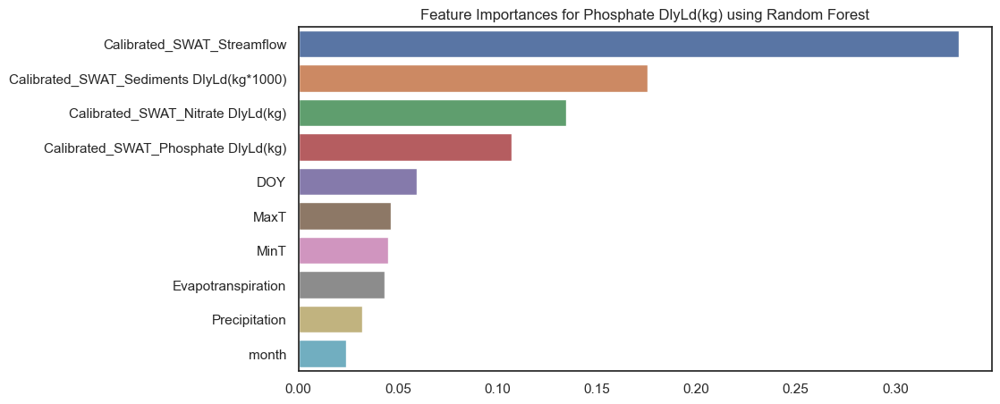

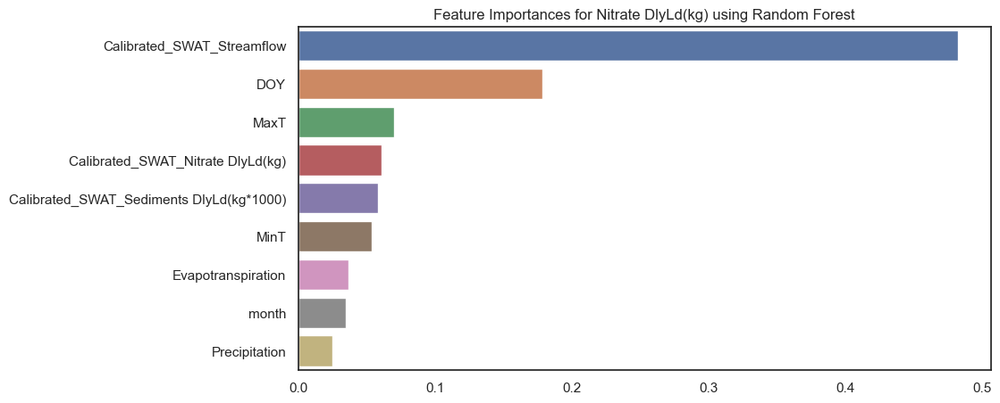

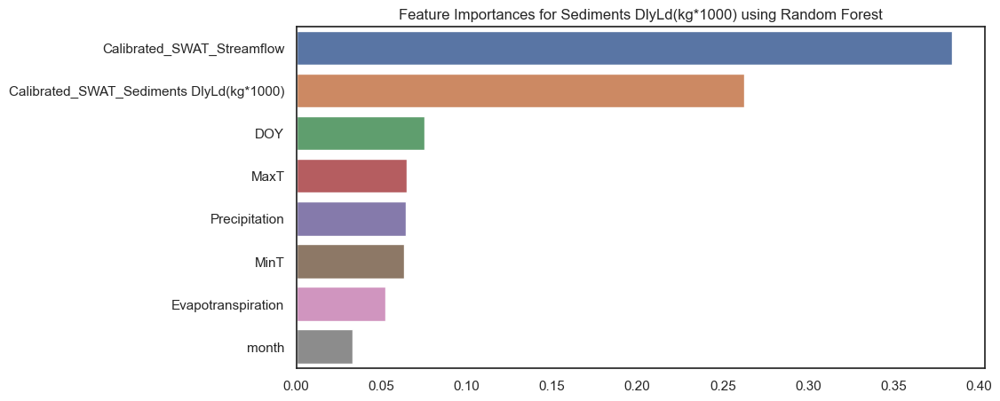

In [179]:
# plot feature importances and arrange them in descending order
for target in targets:
   
    feature_importances = results[target]["Feature Importances"]
    sorted_indices = np.argsort(feature_importances)[::-1]
    sorted_features = results[target]['Input Features'][sorted_indices]
    sorted_importances = feature_importances[sorted_indices]

    plt.figure(figsize=(10, 5))
    sns.barplot(x=sorted_importances, y=sorted_features)
    plt.title(f"Feature Importances for {target} using Random Forest")
    plt.show()

##### Actual vs Predicted

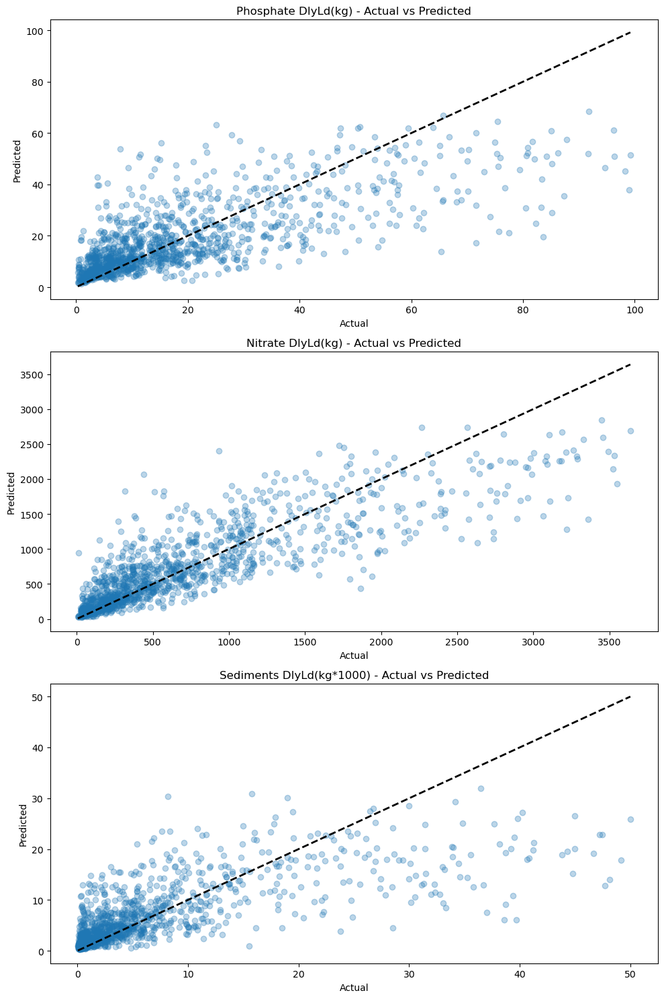

In [ ]:
# Plotting the results
fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(10, 15))

for i, target in enumerate(targets):
    ax = axes[i]
    ax.scatter(y_tests[target][target], model_preds[target], alpha=0.3)
    ax.plot([y_tests[target][target].min(), y_tests[target][target].max()], [y_tests[target][target].min(), y_tests[target][target].max()], 'k--', lw=2)
    ax.set_xlabel('Actual')
    ax.set_ylabel('Predicted')
    ax.set_title(f'{target} - Actual vs Predicted')

plt.tight_layout()
plt.show()

##### Line Chart

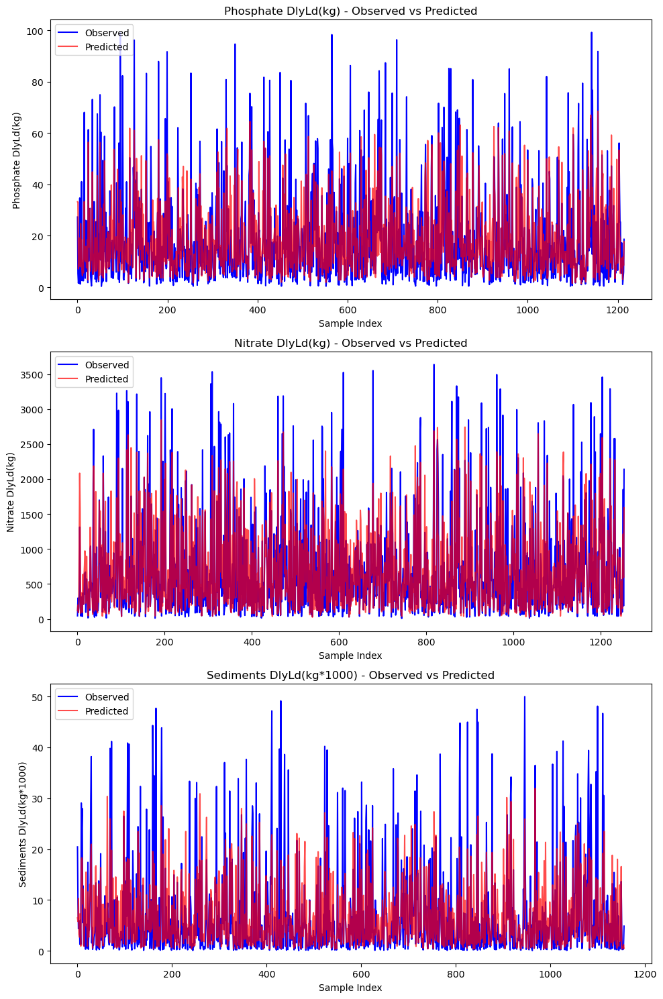

In [ ]:
# Plotting the results
fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(10, 15))

for i, target in enumerate(targets):
    ax = axes[i]
    ax.plot(y_tests[target][target].values, label='Observed', color='blue')
    ax.plot(model_preds[target], label='Predicted', color='red', alpha=0.7)
    ax.set_xlabel('Sample Index')
    ax.set_ylabel(target)
    ax.set_title(f'{target} - Observed vs Predicted')
    ax.legend()

plt.tight_layout()
plt.show()

In [76]:
def nse_score(simulated, observed):
    sum_squared_diff = np.sum((simulated - observed) ** 2)
    variance_B = np.var(observed, ddof=0)
    count_B = len(observed)
    return 1 - (sum_squared_diff / (variance_B * count_B))


def pbias_score(simulated, observed):
    numerator = (np.sum(observed) - np.sum(simulated)) * 100
    denominator = np.sum(observed)
    return numerator / denominator

# Experiment 10) Uncalibrated SWAT + Comb Water Quality

In [77]:
swat_simulations = pd.read_excel("data/SWAT simulations.xlsx")

In [78]:
swat_simulations

,Date,SWAT_Flow (m3/s),SWAT_Sediments (tons),SWAT_Nitrate (kg),SWAT_Phosphate (kg)
0,1993-01-01,19.730,42.730,1538.00,25.280
1,1993-01-02,17.110,34.210,494.30,7.307
2,1993-01-03,16.020,31.200,269.00,2.845
3,1993-01-04,19.130,40.870,2157.00,43.710
4,1993-01-05,25.580,63.330,1864.00,66.640
...,...,...,...,...,...
6569,2010-12-27,1.449,1.845,21.65,2.113
6570,2010-12-28,1.267,1.432,18.74,2.040
6571,2010-12-29,1.158,1.252,16.86,2.037
6572,2010-12-30,1.040,1.055,15.01,1.989


In [79]:
# input features to target variable mapping

features = {
    "Sediments DlyLd(kg*1000)": [
        "SWAT_Flow (m3/s)",
        "SWAT_Sediments (tons)",
    ],
    "Nitrate DlyLd(kg)": [
        "SWAT_Flow (m3/s)",
        "SWAT_Sediments (tons)",
        "SWAT_Nitrate (kg)",
    ],
    "Phosphate DlyLd(kg)": [
        "SWAT_Flow (m3/s)",
        "SWAT_Sediments (tons)",
        "SWAT_Nitrate (kg)",
        "SWAT_Phosphate (kg)",
    ],
    "TotalP": [
        "SWAT_Flow (m3/s)",
        "SWAT_Sediments (tons)",
        "SWAT_Nitrate (kg)",
        "SWAT_Phosphate (kg)",
        "Calibrated_SWAT_TotalP",
    ],
}


In [80]:
# Define the hyperparameter distribution for Random Forest
param_dist = {
    "n_estimators": sp_randint(100, 1000),
    "max_features": [0.5, 0.75, 1.0, "sqrt", "log2"],
    "min_samples_split": sp_randint(2, 5),
    "min_samples_leaf": sp_randint(1, 20),
}

# Assuming training data and target data are already defined as per your context
# Merge training data with streamflow output (using date)
training_data = pd.merge(
    input_df, swat_simulations, left_on="date", right_on="Date"
).drop(columns=["Date"])

# Define the target variables
targets = ["Phosphate DlyLd(kg)", "Nitrate DlyLd(kg)", "Sediments DlyLd(kg*1000)"]

# Define the Random Forest Regressor model
rf_model = RandomForestRegressor(random_state=42)


# Perform randomized hyperparameter search on train + validation set
n_iter_search = 7  # Number of parameter settings to sample
random_search = RandomizedSearchCV(
    rf_model,
    param_distributions=param_dist,
    cv=5,
    n_iter=n_iter_search,
    n_jobs=-1,
    verbose=3,
)

# Run experiments for each target variable
results = {target: {} for target in targets}
model_val_preds = {}
y_vals = {}
model_inputs = {}
model_test_preds = {}
y_tests = {}
for target in targets:
    mlflow.set_experiment(f"Initial Experiments")
    with mlflow.start_run(run_name=f"{target.split()[0]}_rf_uncal_swat"):
        # Merge with water quality data
        train = pd.merge(
            training_data, target_datasets[target], left_on="date", right_on="DATE"
        ).drop(columns=["DATE"])

        # Define input features (X) and target (y)
        X = train.drop(columns=["date", target])

        y = train[[target]]

        X = X.drop(
            columns=[
                col
                for col in X.columns
                if col.startswith("SWAT") and col not in features[target]
            ]
        )

        # Split the data into train (60%), validation (20%), and test (20%) sets
        X_train, X_temp, y_train, y_temp = train_test_split(
            X, y, test_size=0.3, random_state=42, shuffle=False
        )
        X_val, X_test, y_val, y_test = train_test_split(
            X_temp, y_temp, test_size=0.5, random_state=42, shuffle=False
        )
        y_vals[target] = y_val
        y_tests[target] = y_test

        # Standardize the data (train/val/test separately)
        scaler = StandardScaler()
        X_train = scaler.fit_transform(X_train)
        X_val = scaler.transform(X_val)
        X_test = scaler.transform(X_test)

        # x_tests[target] = X_test

        # Hyperparameter tuning on training and validation data
        # random_search.fit(X_train, y_train[target])

        # # Best model after RandomizedSearchCV
        # best_rf_model = random_search.best_estimator_
        best_params = hyperopt_rf_tuning(X_train, y_train[target])
        print(f"Best hyperparameters for target variable {target}: {best_params}")
        best_rf_model = RandomForestRegressor(**best_params, random_state=42)

        # Retrain the best model on combined train + val data
        X_train_val = np.vstack([X_train, X_val])
        y_train_val = np.hstack([y_train[target], y_val[target]])
        best_rf_model.fit(X_train_val, y_train_val)

        # Evaluate the model on the test set
        y_pred_test = best_rf_model.predict(X_test)
        model_test_preds[target] = y_pred_test

        # Calculate performance metrics

        r2 = r2_score(y_test[target], y_pred_test)
        nse = nse_score(y_test[target], y_pred_test)
        pbias = pbias_score(y_test[target], y_pred_test)

        mlflow.log_metrics(
            {
                "R2": r2,
                "NSE": nse,
                "PBIAS": pbias,
            }
        )

        # Store feature importances for Random Forest
        feature_importances = best_rf_model.feature_importances_
        results[target] = {
            "R2": r2,
            "NSE": nse,
            "PBIAS": pbias,
            "Feature Importances": feature_importances,
            "Model Inputs": X.columns,
        }

        mlflow.sklearn.log_model(best_rf_model, "model")

# Print the final results for all target variables
pprint(results)


100%|██████████| 50/50 [01:59<00:00,  2.38s/trial, best loss: 26.304524675515903]
Best hyperparameters for target variable Phosphate DlyLd(kg): {'n_estimators': 300, 'max_depth': 18, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': None}


2025/02/24 18:57:24 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


100%|██████████| 50/50 [01:52<00:00,  2.26s/trial, best loss: 18452.066058372737]
Best hyperparameters for target variable Nitrate DlyLd(kg): {'n_estimators': 300, 'max_depth': 18, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': None}


2025/02/24 18:59:27 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


100%|██████████| 50/50 [01:44<00:00,  2.08s/trial, best loss: 13.13181184119916] 
Best hyperparameters for target variable Sediments DlyLd(kg*1000): {'n_estimators': 300, 'max_depth': 18, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': None}


2025/02/24 19:01:20 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


{'Nitrate DlyLd(kg)': {'Feature Importances': array([0.19076123, 0.02054432, 0.0315789 , 0.06591631, 0.03391991,
       0.03868907, 0.3888324 , 0.08459697, 0.04557749, 0.06862798,
       0.03095542]),
                       'Model Inputs': Index(['DOY', 'Precipitation', 'Evapotranspiration', 'MaxT', 'MinT', 'month_x',
       'SWAT_Flow (m3/s)', 'SWAT_Sediments (tons)', 'SWAT_Nitrate (kg)',
       'YEAR', 'month_y'],
      dtype='object'),
                       'NSE': 0.5185042395930125,
                       'PBIAS': 28.905157345944456,
                       'R2': 0.5278984524320529},
 'Phosphate DlyLd(kg)': {'Feature Importances': array([0.06983314, 0.02609977, 0.04802781, 0.03335102, 0.03272733,
       0.01014742, 0.50247213, 0.10821404, 0.03300511, 0.03517536,
       0.09074105, 0.01020581]),
                         'Model Inputs': Index(['DOY', 'Precipitation', 'Evapotranspiration', 'MaxT', 'MinT', 'month_x',
       'SWAT_Flow (m3/s)', 'SWAT_Sediments (tons)', 'SWAT_Nitrate (kg

In [81]:
# create dataframe for exp3_results only showing the metrics
results_df = pd.DataFrame(results).T.drop(
    columns=["Feature Importances", "Model Inputs"]
)
results_df

,R2,NSE,PBIAS
Phosphate DlyLd(kg),0.579841,0.325918,4.7598
Nitrate DlyLd(kg),0.527898,0.518504,28.905157
Sediments DlyLd(kg*1000),0.659598,0.410995,1.713084


# Experiment 11) No SWAT

In [82]:
streamflow_output_data

,Date,Streamflow m3/s
0,1993-01-01,68.2435
1,1993-01-02,48.9881
2,1993-01-03,38.7940
3,1993-01-04,37.9445
4,1993-01-05,65.1286
...,...,...
10222,2020-12-27,84.1009
10223,2020-12-28,58.6158
10224,2020-12-29,45.5900
10225,2020-12-30,35.3960


In [83]:
# Define the hyperparameter distribution for Random Forest
param_dist = {
    "n_estimators": sp_randint(100, 1000),
    "max_features": [0.5, 0.75, 1.0, "sqrt", "log2"],
    "min_samples_split": sp_randint(2, 5),
    "min_samples_leaf": sp_randint(1, 20),
}

# Assuming training data and target data are already defined as per your context
# Merge training data with streamflow output (using date)
training_data = input_df

# Define the target variables
targets = ["Phosphate DlyLd(kg)", "Nitrate DlyLd(kg)", "Sediments DlyLd(kg*1000)"]

# Define the Random Forest Regressor model
rf_model = RandomForestRegressor(random_state=42)


# Perform randomized hyperparameter search on train + validation set
n_iter_search = 7  # Number of parameter settings to sample
random_search = RandomizedSearchCV(
    rf_model,
    param_distributions=param_dist,
    cv=5,
    n_iter=n_iter_search,
    n_jobs=-1,
    verbose=3,
)

# Run experiments for each target variable
results = {target: {} for target in targets}
model_val_preds = {}
y_vals = {}
model_inputs = {}
model_test_preds = {}
y_tests = {}
for target in targets:
    mlflow.set_experiment(f"Initial Experiments")
    with mlflow.start_run(run_name=f"{target.split()[0]}_rf_no_swat"):
        # Merge with water quality data
        train = pd.merge(
            training_data, target_datasets[target], left_on="date", right_on="DATE"
        ).drop(columns=["DATE"])

        # Define input features (X) and target (y)
        X = train.drop(columns=["date", target])

        y = train[[target]]

        # Split the data into train (60%), validation (20%), and test (20%) sets
        X_train, X_temp, y_train, y_temp = train_test_split(
            X, y, test_size=0.3, random_state=42, shuffle=False
        )
        X_val, X_test, y_val, y_test = train_test_split(
            X_temp, y_temp, test_size=0.5, random_state=42, shuffle=False
        )
        y_vals[target] = y_val
        y_tests[target] = y_test

       
        # Standardize the data (train/val/test separately)
        scaler = StandardScaler()
        X_train = scaler.fit_transform(X_train)
        X_val = scaler.transform(X_val)
        X_test = scaler.transform(X_test)

        # x_tests[target] = X_test

        # Hyperparameter tuning on training and validation data
        # random_search.fit(X_train, y_train[target])

        

        # # Best model after RandomizedSearchCV
        # best_rf_model = random_search.best_estimator_
        best_params = hyperopt_rf_tuning(X_train, y_train[target])
        print(f"Best hyperparameters for target variable {target}: {best_params}")
        best_rf_model = RandomForestRegressor(**best_params, random_state=42)

        # Retrain the best model on combined train + val data
        X_train_val = np.vstack([X_train, X_val])
        y_train_val = np.hstack([y_train[target], y_val[target]])
        best_rf_model.fit(X_train_val, y_train_val)

        # Evaluate the model on the test set
        y_pred_test = best_rf_model.predict(X_test)
        model_test_preds[target] = y_pred_test

        # Calculate performance metrics
        
        r2 = r2_score(y_test[target], y_pred_test)
        nse = nse_score(y_test[target], y_pred_test)
        pbias = pbias_score(y_test[target], y_pred_test)

        mlflow.log_metrics(
            {
                "R2": r2,
                "NSE": nse,
                "PBIAS": pbias,
            }
        )

        # Store feature importances for Random Forest
        feature_importances = best_rf_model.feature_importances_
        results[target] = {
            "R2": r2,
            "NSE": nse,
            "PBIAS": pbias,
            "Feature Importances": feature_importances,
            "Model Inputs": X.columns,
        }

        mlflow.sklearn.log_model(best_rf_model, "model")

# Print the final results for all target variables
pprint(results)


100%|██████████| 50/50 [01:30<00:00,  1.81s/trial, best loss: 59.22478887632893] 
Best hyperparameters for target variable Phosphate DlyLd(kg): {'n_estimators': 300, 'max_depth': 27, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': None}


2025/02/24 19:02:58 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


100%|██████████| 50/50 [01:28<00:00,  1.78s/trial, best loss: 44588.603461592]   
Best hyperparameters for target variable Nitrate DlyLd(kg): {'n_estimators': 300, 'max_depth': 27, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': None}


2025/02/24 19:04:33 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


100%|██████████| 50/50 [00:54<00:00,  1.10s/trial, best loss: 27.385188463178796]
Best hyperparameters for target variable Sediments DlyLd(kg*1000): {'n_estimators': 140, 'max_depth': 28, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'sqrt'}


2025/02/24 19:05:31 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


{'Nitrate DlyLd(kg)': {'Feature Importances': array([0.28663303, 0.09067212, 0.08589471, 0.10290561, 0.11186279,
       0.06665016, 0.1845662 , 0.07081538]),
                       'Model Inputs': Index(['DOY', 'Precipitation', 'Evapotranspiration', 'MaxT', 'MinT', 'month_x',
       'YEAR', 'month_y'],
      dtype='object'),
                       'NSE': -0.16551956567144055,
                       'PBIAS': 40.84819932210365,
                       'R2': -0.32281092466435823},
 'Phosphate DlyLd(kg)': {'Feature Importances': array([0.22749244, 0.14579357, 0.10355197, 0.13350377, 0.1512718 ,
       0.01509639, 0.20859539, 0.01469465]),
                         'Model Inputs': Index(['DOY', 'Precipitation', 'Evapotranspiration', 'MaxT', 'MinT', 'month_x',
       'YEAR', 'month_y'],
      dtype='object'),
                         'NSE': -1.4753653546466605,
                         'PBIAS': 17.26234716827136,
                         'R2': 0.0037052634557732667},
 'Sediments DlyLd(kg*1000)

In [84]:
# create dataframe for exp3_results only showing the metrics
results_df = pd.DataFrame(results).T.drop(
    columns=["Feature Importances", "Model Inputs"]
)
results_df

,R2,NSE,PBIAS
Phosphate DlyLd(kg),0.003705,-1.475365,17.262347
Nitrate DlyLd(kg),-0.322811,-0.16552,40.848199
Sediments DlyLd(kg*1000),0.080906,-2.3753,12.385241


# Experiment 15) Removing Outliers

#### Training

In [144]:
sediments_calibrated_water_quality_df =pd.read_excel("data/CalibratedWaterQuality.xlsx", sheet_name="Sediments")
sediments_calibrated_water_quality_df.rename(columns={"Simulated": "Calibrated_SWAT_Sediments DlyLd(kg*1000)"}, inplace=True)
nitrate_calibrated_water_quality_df =pd.read_excel("data/CalibratedWaterQuality.xlsx", sheet_name="Nitrate")
nitrate_calibrated_water_quality_df.rename(columns={"Simulated": "Calibrated_SWAT_Nitrate DlyLd(kg)"}, inplace=True)
phosphate_calibrated_water_quality_df =pd.read_excel("data/CalibratedWaterQuality.xlsx", sheet_name="Phosphate")
phosphate_calibrated_water_quality_df.rename(columns={"Simulated": "Calibrated_SWAT_Phosphate DlyLd(kg)"}, inplace=True)

calibrated_streamflow_df = pd.read_excel("data/Calibrated Streamflow data.xlsx")
calibrated_streamflow_df.rename(columns={"Simulated": "Calibrated_SWAT_Streamflow"}, inplace=True)

calibrated_water_quality_df = pd.merge(
    sediments_calibrated_water_quality_df, nitrate_calibrated_water_quality_df, on="Date"
)

calibrated_water_quality_df = pd.merge(
    calibrated_water_quality_df, phosphate_calibrated_water_quality_df, on="Date"
)

calibrated_swat_simulations_df = pd.merge(
    calibrated_streamflow_df, calibrated_water_quality_df, on="Date"
)


calibrated_swat_simulations_df

,Date,Calibrated_SWAT_Streamflow,Calibrated_SWAT_Sediments DlyLd(kg*1000),Calibrated_SWAT_Nitrate DlyLd(kg),Calibrated_SWAT_Phosphate DlyLd(kg)
0,1993-01-01,36.110,72.0400,874.90,49.8900
1,1993-01-02,36.200,44.4200,232.20,17.2600
2,1993-01-03,33.750,26.6100,1133.00,39.9900
3,1993-01-04,34.430,32.7800,1213.00,72.1200
4,1993-01-05,46.330,43.5200,1135.00,116.7000
...,...,...,...,...,...
6477,2010-09-26,1.093,0.8149,17.45,0.2327
6478,2010-09-27,2.336,2.7360,66.74,11.9800
6479,2010-09-28,3.154,3.8130,88.67,16.6600
6480,2010-09-29,4.023,5.3260,150.10,21.2600


In [145]:
features = {
    "Sediments DlyLd(kg*1000)": [
        "Calibrated_SWAT_Streamflow",
        "Calibrated_SWAT_Sediments DlyLd(kg*1000)",
    ],
    "Nitrate DlyLd(kg)": [
        "Calibrated_SWAT_Streamflow",
        "Calibrated_SWAT_Sediments DlyLd(kg*1000)",
        "Calibrated_SWAT_Nitrate DlyLd(kg)",
    ],
    "Phosphate DlyLd(kg)": [
        "Calibrated_SWAT_Streamflow",
        "Calibrated_SWAT_Sediments DlyLd(kg*1000)",
        "Calibrated_SWAT_Nitrate DlyLd(kg)",
        "Calibrated_SWAT_Phosphate DlyLd(kg)",
    ],
    "TotalP": [
        "Calibrated_SWAT_Streamflow",
        "Calibrated_SWAT_Sediments DlyLd(kg*1000)",
        "Calibrated_SWAT_Nitrate DlyLd(kg)",
        "Calibrated_SWAT_Phosphate DlyLd(kg)",
        "Calibrated_SWAT_TotalP",
    ],
}

In [146]:
# Define the hyperparameter distribution for Random Forest
param_dist = {
    "n_estimators": sp_randint(100, 1000),
    "max_features": [0.5, 0.75, 1.0, "sqrt", "log2"],
    "min_samples_split": sp_randint(2, 5),
    "min_samples_leaf": sp_randint(1, 20),
}

# Assuming training data and target data are already defined as per your context
# Merge training data with streamflow output (using date)
training_data = pd.merge(
    input_df, calibrated_swat_simulations_df, left_on="date", right_on="Date"
).drop(columns=["Date"])

# Define the target variables
targets = ["Phosphate DlyLd(kg)", "Nitrate DlyLd(kg)", "Sediments DlyLd(kg*1000)"]

# Define the Random Forest Regressor model
rf_model = RandomForestRegressor(random_state=42)


# Perform randomized hyperparameter search on train + validation set
n_iter_search = 7  # Number of parameter settings to sample
random_search = RandomizedSearchCV(
    rf_model,
    param_distributions=param_dist,
    cv=5,
    n_iter=n_iter_search,
    n_jobs=-1,
    verbose=3,
)

# Run experiments for each target variable
results = {target: {} for target in targets}
model_preds = {}
y_tests = {}
for target in targets:
    mlflow.set_experiment(f"Initial Experiments")
    with mlflow.start_run(
        run_name=f"{target.split()[0]}_removing_outliers"
    ):
    # Merge with water quality data
        train = pd.merge(
            training_data, removed_outliers_target_datasets[target], left_on="date", right_on="DATE"
        ).drop(columns=["DATE"])

        # Define input features (X) and target (y)
        X = train.drop(
            columns=[
                "date",
                target
            ]
        )

        X = X.drop(
            columns=[
                col
                for col in X.columns
                if col.startswith("Calibrated_SWAT") and col not in features[target]
            ]
        )

        y = train[[target]]

        # Split the data into train (60%), validation (20%), and test (20%) sets
        X_train, X_temp, y_train, y_temp = train_test_split(
            X, y, test_size=0.3, random_state=42, shuffle=False
        )
        X_val, X_test, y_val, y_test = train_test_split(
            X_temp, y_temp, test_size=0.5, random_state=42, shuffle=False
        )
        y_tests[target] = y_test

        #print size of each dataset
        print(f"Size of training dataset for target variable {target}: {X_train.shape[0]}")
        print(f"Size of validation dataset for target variable {target}: {X_val.shape[0]}")
        print(f"Size of test dataset for target variable {target}: {X_test.shape[0]}")

        # Standardize the data (train/val/test separately)
        scaler = StandardScaler()
        X_train = scaler.fit_transform(X_train)
        X_val = scaler.transform(X_val)
        X_test = scaler.transform(X_test)

        # Hyperparameter tuning on training and validation data
        # random_search.fit(X_train, y_train[target])
        
        # mlflow.log_params(random_search.best_params_)

        # # Best model after RandomizedSearchCV
        # best_rf_model = random_search.best_estimator_
        best_params = hyperopt_rf_tuning(X_train, y_train[target])
        print(f"Best hyperparameters for target variable {target}: {best_params}")
        best_rf_model = RandomForestRegressor(**best_params, random_state=42)

        # Retrain the best model on combined train + val data
        X_train_val = np.vstack([X_train, X_val])
        y_train_val = np.hstack([y_train[target], y_val[target]])
        best_rf_model.fit(X_train_val, y_train_val)

        # Evaluate the model on the test set
        y_pred = best_rf_model.predict(X_test)
        model_preds[target] = y_pred

        # Calculate performance metrics
        nse = nse_score(y_test[target], y_pred)
        pbias = pbias_score(y_test[target], y_pred)
        r2 = r2_score(y_test[target], y_pred)

        mlflow.log_metrics({"R2": r2, "NSE": nse, "PBIAS": pbias})

        # Store feature importances for Random Forest
        feature_importances = best_rf_model.feature_importances_
        results[target] = {
            "NSE": nse,
            "PBIAS": pbias,
            "R2": r2,
            "Feature Importances": feature_importances,
            "Input Features": X.columns,
        }
        # mlflow.sklearn.log_model(best_rf_model, "model")

    # Print the final results for all target variables
pprint(results)


Size of training dataset for target variable Phosphate DlyLd(kg): 4324
Size of validation dataset for target variable Phosphate DlyLd(kg): 927
Size of test dataset for target variable Phosphate DlyLd(kg): 927
100%|██████████| 50/50 [01:29<00:00,  1.79s/trial, best loss: 26.22343039904706] 
Best hyperparameters for target variable Phosphate DlyLd(kg): {'n_estimators': 140, 'max_depth': 28, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'sqrt'}
Size of training dataset for target variable Nitrate DlyLd(kg): 4444
Size of validation dataset for target variable Nitrate DlyLd(kg): 952
Size of test dataset for target variable Nitrate DlyLd(kg): 953
100%|██████████| 50/50 [01:59<00:00,  2.39s/trial, best loss: 21687.20901425018] 
Best hyperparameters for target variable Nitrate DlyLd(kg): {'n_estimators': 270, 'max_depth': 28, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': None}
Size of training dataset for target variable Sediments DlyLd(kg*1000): 4109
Size of 

#### Evaluation

##### Metrics

In [147]:
# create dataframe for exp3_results only showing the metrics
results_df = pd.DataFrame(results).T#.drop(columns=["Feature Importances"])
results_df

,NSE,PBIAS,R2,Feature Importances,Input Features
Phosphate DlyLd(kg),0.14588,26.248324,0.482264,"[0.08194200080051792, 0.043335933959687004, 0....","Index(['DOY', 'Precipitation', 'Evapotranspira..."
Nitrate DlyLd(kg),0.514938,29.176004,0.475503,"[0.18287407228258998, 0.02430867997103197, 0.0...","Index(['DOY', 'Precipitation', 'Evapotranspira..."
Sediments DlyLd(kg*1000),-0.10576,-18.409738,0.450259,"[0.10334310498057135, 0.05870143646641874, 0.0...","Index(['DOY', 'Precipitation', 'Evapotranspira..."


# Experiment 14) Capping Outliers

#### Training

In [89]:
sediments_calibrated_water_quality_df =pd.read_excel("data/CalibratedWaterQuality.xlsx", sheet_name="Sediments")
sediments_calibrated_water_quality_df.rename(columns={"Simulated": "Calibrated_SWAT_Sediments DlyLd(kg*1000)"}, inplace=True)
nitrate_calibrated_water_quality_df =pd.read_excel("data/CalibratedWaterQuality.xlsx", sheet_name="Nitrate")
nitrate_calibrated_water_quality_df.rename(columns={"Simulated": "Calibrated_SWAT_Nitrate DlyLd(kg)"}, inplace=True)
phosphate_calibrated_water_quality_df =pd.read_excel("data/CalibratedWaterQuality.xlsx", sheet_name="Phosphate")
phosphate_calibrated_water_quality_df.rename(columns={"Simulated": "Calibrated_SWAT_Phosphate DlyLd(kg)"}, inplace=True)

calibrated_streamflow_df = pd.read_excel("data/Calibrated Streamflow data.xlsx")
calibrated_streamflow_df.rename(columns={"Simulated": "Calibrated_SWAT_Streamflow"}, inplace=True)

calibrated_water_quality_df = pd.merge(
    sediments_calibrated_water_quality_df, nitrate_calibrated_water_quality_df, on="Date"
)

calibrated_water_quality_df = pd.merge(
    calibrated_water_quality_df, phosphate_calibrated_water_quality_df, on="Date"
)

calibrated_swat_simulations_df = pd.merge(
    calibrated_streamflow_df, calibrated_water_quality_df, on="Date"
)


calibrated_swat_simulations_df

,Date,Calibrated_SWAT_Streamflow,Calibrated_SWAT_Sediments DlyLd(kg*1000),Calibrated_SWAT_Nitrate DlyLd(kg),Calibrated_SWAT_Phosphate DlyLd(kg)
0,1993-01-01,36.110,72.0400,874.90,49.8900
1,1993-01-02,36.200,44.4200,232.20,17.2600
2,1993-01-03,33.750,26.6100,1133.00,39.9900
3,1993-01-04,34.430,32.7800,1213.00,72.1200
4,1993-01-05,46.330,43.5200,1135.00,116.7000
...,...,...,...,...,...
6477,2010-09-26,1.093,0.8149,17.45,0.2327
6478,2010-09-27,2.336,2.7360,66.74,11.9800
6479,2010-09-28,3.154,3.8130,88.67,16.6600
6480,2010-09-29,4.023,5.3260,150.10,21.2600


In [90]:
features = {
    "Sediments DlyLd(kg*1000)": [
        "Calibrated_SWAT_Streamflow",
        "Calibrated_SWAT_Sediments DlyLd(kg*1000)",
    ],
    "Nitrate DlyLd(kg)": [
        "Calibrated_SWAT_Streamflow",
        "Calibrated_SWAT_Sediments DlyLd(kg*1000)",
        "Calibrated_SWAT_Nitrate DlyLd(kg)",
    ],
    "Phosphate DlyLd(kg)": [
        "Calibrated_SWAT_Streamflow",
        "Calibrated_SWAT_Sediments DlyLd(kg*1000)",
        "Calibrated_SWAT_Nitrate DlyLd(kg)",
        "Calibrated_SWAT_Phosphate DlyLd(kg)",
    ],
    "TotalP": [
        "Calibrated_SWAT_Streamflow",
        "Calibrated_SWAT_Sediments DlyLd(kg*1000)",
        "Calibrated_SWAT_Nitrate DlyLd(kg)",
        "Calibrated_SWAT_Phosphate DlyLd(kg)",
        "Calibrated_SWAT_TotalP",
    ],
}

In [91]:
# Define the hyperparameter distribution for Random Forest
param_dist = {
    "n_estimators": sp_randint(100, 1000),
    "max_features": [0.5, 0.75, 1.0, "sqrt", "log2"],
    "min_samples_split": sp_randint(2, 5),
    "min_samples_leaf": sp_randint(1, 20),
}

# Assuming training data and target data are already defined as per your context
# Merge training data with streamflow output (using date)
training_data = pd.merge(
    input_df, calibrated_swat_simulations_df, left_on="date", right_on="Date"
).drop(columns=["Date"])

# Define the target variables
targets = ["Phosphate DlyLd(kg)", "Nitrate DlyLd(kg)", "Sediments DlyLd(kg*1000)"]

# Define the Random Forest Regressor model
rf_model = RandomForestRegressor(random_state=42)


# Perform randomized hyperparameter search on train + validation set
n_iter_search = 7  # Number of parameter settings to sample
random_search = RandomizedSearchCV(
    rf_model,
    param_distributions=param_dist,
    cv=5,
    n_iter=n_iter_search,
    n_jobs=-1,
    verbose=3,
)

# Run experiments for each target variable
results = {target: {} for target in targets}
model_preds = {}
y_tests = {}
for target in targets:
    mlflow.set_experiment(f"Initial Experiments")
    with mlflow.start_run(
        run_name=f"{target.split()[0]}_capping_outliers"
    ):
    # Merge with water quality data
        train = pd.merge(
            training_data, target_datasets[target], left_on="date", right_on="DATE"
        ).drop(columns=["DATE"])

        # Define input features (X) and target (y)
        X = train.drop(
            columns=[
                "date",
                target
            ]
        )

        X = X.drop(
            columns=[
                col
                for col in X.columns
                if col.startswith("Calibrated_SWAT") and col not in features[target]
            ]
        )

        y = train[[target]]

        # Split the data into train (60%), validation (20%), and test (20%) sets
        X_train, X_temp, y_train, y_temp = train_test_split(
            X, y, test_size=0.3, random_state=42, shuffle=False
        )
        X_val, X_test, y_val, y_test = train_test_split(
            X_temp, y_temp, test_size=0.5, random_state=42, shuffle=False
        )
        y_tests[target] = y_test

        #print size of each dataset
        print(f"Size of training dataset for target variable {target}: {X_train.shape[0]}")
        print(f"Size of validation dataset for target variable {target}: {X_val.shape[0]}")
        print(f"Size of test dataset for target variable {target}: {X_test.shape[0]}")

        # Standardize the data (train/val/test separately)
        scaler = StandardScaler()
        X_train = scaler.fit_transform(X_train)
        X_val = scaler.transform(X_val)
        X_test = scaler.transform(X_test)

        # Hyperparameter tuning on training and validation data
        # random_search.fit(X_train, y_train[target])
        
        # mlflow.log_params(random_search.best_params_)

        # # Best model after RandomizedSearchCV
        # best_rf_model = random_search.best_estimator_
        best_params = hyperopt_rf_tuning(X_train, y_train[target])
        print(f"Best hyperparameters for target variable {target}: {best_params}")
        best_rf_model = RandomForestRegressor(**best_params, random_state=42)

        # Retrain the best model on combined train + val data
        X_train_val = np.vstack([X_train, X_val])
        y_train_val = np.hstack([y_train[target], y_val[target]])
        best_rf_model.fit(X_train_val, y_train_val)

        # Evaluate the model on the test set
        y_pred = best_rf_model.predict(X_test)
        model_preds[target] = y_pred

        # Calculate performance metrics
        nse = nse_score(y_test[target], y_pred)
        pbias = pbias_score(y_test[target], y_pred)
        r2 = r2_score(y_test[target], y_pred)

        mlflow.log_metrics({"R2": r2, "NSE": nse, "PBIAS": pbias})

        # Store feature importances for Random Forest
        feature_importances = best_rf_model.feature_importances_
        results[target] = {
            "NSE": nse,
            "PBIAS": pbias,
            "R2": r2,
            "Feature Importances": feature_importances,
            "Input Features": X.columns,
        }
        # mlflow.sklearn.log_model(best_rf_model, "model")

    # Print the final results for all target variables
pprint(results)


Size of training dataset for target variable Phosphate DlyLd(kg): 4534
Size of validation dataset for target variable Phosphate DlyLd(kg): 972
Size of test dataset for target variable Phosphate DlyLd(kg): 972
100%|██████████| 50/50 [01:53<00:00,  2.27s/trial, best loss: 26.602640167413124]
Best hyperparameters for target variable Phosphate DlyLd(kg): {'n_estimators': 300, 'max_depth': 18, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': None}
Size of training dataset for target variable Nitrate DlyLd(kg): 4534
Size of validation dataset for target variable Nitrate DlyLd(kg): 972
Size of test dataset for target variable Nitrate DlyLd(kg): 972
100%|██████████| 50/50 [02:11<00:00,  2.63s/trial, best loss: 19028.045589260957]
Best hyperparameters for target variable Nitrate DlyLd(kg): {'n_estimators': 300, 'max_depth': 27, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': None}
Size of training dataset for target variable Sediments DlyLd(kg*1000): 4534
Size of va

#### Evaluation

##### Metrics

In [92]:
# create dataframe for exp3_results only showing the metrics
results_df = pd.DataFrame(results).T#.drop(columns=["Feature Importances"])
results_df

,NSE,PBIAS,R2,Feature Importances,Input Features
Phosphate DlyLd(kg),0.451513,5.479848,0.644318,"[0.052938557151376325, 0.025993040145124928, 0...","Index(['DOY', 'Precipitation', 'Evapotranspira..."
Nitrate DlyLd(kg),0.542834,28.868762,0.536233,"[0.16603314409252293, 0.019420426815360946, 0....","Index(['DOY', 'Precipitation', 'Evapotranspira..."
Sediments DlyLd(kg*1000),0.469181,3.667266,0.687123,"[0.07954897504812003, 0.03614276430954783, 0.0...","Index(['DOY', 'Precipitation', 'Evapotranspira..."


# Experiment 13) No Outlier Handling

#### Training

In [132]:
import numpy as np
import pandas as pd


class OutlierHandler:
    def __init__(self, threshold=4):
        self.threshold = threshold
        self.lower_bounds = {}
        self.upper_bounds = {}

    def fit(self, data):
        """Calculate the outlier thresholds based on the training data."""
        numeric_cols = data.select_dtypes(include=[np.number]).columns
        for col in numeric_cols:
            Q1 = data[col].quantile(0.25)
            Q3 = data[col].quantile(0.75)
            IQR = Q3 - Q1
            self.lower_bounds[col] = Q1 - self.threshold * IQR
            self.upper_bounds[col] = Q3 + self.threshold * IQR
        return self  # Return self to allow method chaining

    def transform(self, data):
        """Apply outlier handling using the learned thresholds."""
        new_data = data.copy()
        for col in self.lower_bounds:
            lower_bound = self.lower_bounds[col]
            upper_bound = self.upper_bounds[col]
            new_data[col] = np.where(
                new_data[col] < lower_bound, lower_bound, new_data[col]
            )
            new_data[col] = np.where(
                new_data[col] > upper_bound, upper_bound, new_data[col]
            )
        return new_data

    def fit_transform(self, data):
        """Fit to data and transform it in a single step."""
        return self.fit(data).transform(data)


In [209]:
sediments_calibrated_water_quality_df.isna().sum()

Date                                        0
Calibrated_SWAT_Sediments DlyLd(kg*1000)    5
dtype: int64

In [3]:
import pandas as pd
sediments_calibrated_water_quality_df =pd.read_excel("data/CalibratedWaterQuality.xlsx", sheet_name="Sediments")
sediments_calibrated_water_quality_df.rename(columns={"Simulated": "Calibrated_SWAT_Sediments DlyLd(kg*1000)"}, inplace=True)
sediments_calibrated_water_quality_df.dropna(inplace=True)

nitrate_calibrated_water_quality_df =pd.read_excel("data/CalibratedWaterQuality.xlsx", sheet_name="Nitrate")
nitrate_calibrated_water_quality_df.rename(columns={"Simulated": "Calibrated_SWAT_Nitrate DlyLd(kg)"}, inplace=True)
phosphate_calibrated_water_quality_df =pd.read_excel("data/CalibratedWaterQuality.xlsx", sheet_name="Phosphate")
phosphate_calibrated_water_quality_df.rename(columns={"Simulated": "Calibrated_SWAT_Phosphate DlyLd(kg)"}, inplace=True)

calibrated_streamflow_df = pd.read_excel("data/Calibrated Streamflow data.xlsx")
calibrated_streamflow_df.rename(columns={"Simulated": "Calibrated_SWAT_Streamflow"}, inplace=True)

calibrated_snowmelt_df = pd.read_csv("data/SWAT_SnowMelt_Historical.csv")
calibrated_snowmelt_df['Date'] = pd.to_datetime(calibrated_snowmelt_df['Date'])

swat_sediments_df = pd.merge(
    calibrated_streamflow_df, sediments_calibrated_water_quality_df, on="Date"
)
swat_sediments_df = pd.merge(
    swat_sediments_df, calibrated_snowmelt_df, on="Date"
)

swat_nitrate_df = pd.merge(
    calibrated_streamflow_df, nitrate_calibrated_water_quality_df, on="Date"
)
swat_nitrate_df = pd.merge(
    swat_nitrate_df, calibrated_snowmelt_df, on="Date"
)

swat_phosphate_df = pd.merge(
    calibrated_streamflow_df, phosphate_calibrated_water_quality_df, on="Date"
)
swat_phosphate_df = pd.merge(
    swat_phosphate_df, calibrated_snowmelt_df, on="Date"
)

# calibrated_water_quality_df = pd.merge(
#     calibrated_water_quality_df, phosphate_calibrated_water_quality_df, on="Date"
# )

# calibrated_swat_simulations_df = pd.merge(
#     calibrated_streamflow_df, calibrated_water_quality_df, on="Date"
# )


swat_simulations_dfs = {
    "Sediments DlyLd(kg*1000)": swat_sediments_df,
    "Nitrate DlyLd(kg)": swat_nitrate_df,
    "Phosphate DlyLd(kg)": swat_phosphate_df,
}

In [134]:
features = {
    "Sediments DlyLd(kg*1000)": [
        "Calibrated_SWAT_Streamflow",
        "Calibrated_SWAT_Sediments DlyLd(kg*1000)",
    ],
    "Nitrate DlyLd(kg)": [
        "Calibrated_SWAT_Streamflow",
        "Calibrated_SWAT_Sediments DlyLd(kg*1000)",
        "Calibrated_SWAT_Nitrate DlyLd(kg)",
    ],
    "Phosphate DlyLd(kg)": [
        "Calibrated_SWAT_Streamflow",
        "Calibrated_SWAT_Sediments DlyLd(kg*1000)",
        "Calibrated_SWAT_Nitrate DlyLd(kg)",
        "Calibrated_SWAT_Phosphate DlyLd(kg)",
    ],
    "TotalP": [
        "Calibrated_SWAT_Streamflow",
        "Calibrated_SWAT_Sediments DlyLd(kg*1000)",
        "Calibrated_SWAT_Nitrate DlyLd(kg)",
        "Calibrated_SWAT_Phosphate DlyLd(kg)",
        "Calibrated_SWAT_TotalP",
    ],
}

In [95]:
water_quality_data_post_1993[["DATE", target]]


,DATE,Sediments DlyLd(kg*1000)
458,1993-01-01,160.755731
459,1993-01-02,40.571564
460,1993-01-03,22.013847
461,1993-01-04,36.838848
462,1993-01-05,218.350895
...,...,...
6935,2010-09-26,3.006372
6936,2010-09-27,4.852436
6937,2010-09-28,5.639539
6938,2010-09-29,15.536208


In [135]:
# Define the hyperparameter distribution for Random Forest
param_dist = {
    "n_estimators": sp_randint(100, 1000),
    "max_features": [0.5, 0.75, 1.0, "sqrt", "log2"],
    "min_samples_split": sp_randint(2, 5),
    "min_samples_leaf": sp_randint(1, 20),
}

# Assuming training data and target data are already defined as per your context
# Merge training data with streamflow output (using date)
training_data = pd.merge(
    input_df, calibrated_swat_simulations_df, left_on="date", right_on="Date"
).drop(columns=["Date"])

# Define the target variables
targets = ["Phosphate DlyLd(kg)", "Nitrate DlyLd(kg)", "Sediments DlyLd(kg*1000)"]

# Define the Random Forest Regressor model
rf_model = RandomForestRegressor(random_state=42)


# Perform randomized hyperparameter search on train + validation set
n_iter_search = 7  # Number of parameter settings to sample
random_search = RandomizedSearchCV(
    rf_model,
    param_distributions=param_dist,
    cv=5,
    n_iter=n_iter_search,
    n_jobs=-1,
    verbose=3,
)

# Run experiments for each target variable
results = {target: {} for target in targets}
model_preds = {}
y_tests = {}
for target in targets:
    mlflow.set_experiment(f"Initial Experiments")
    with mlflow.start_run(
        run_name=f"{target.split()[0]}_post_capping"
    ):
        # Merge with water quality data
        train = pd.merge(
            training_data,
            water_quality_data_post_1993[["DATE", target]],
            left_on="date",
            right_on="DATE",
        ).drop(columns=["DATE"])

        dev, test = train_test_split(
            train, test_size=0.15, random_state=42, shuffle=False
        )
        train, val = train_test_split(
            dev, test_size=0.15, random_state=42, shuffle=False
        )

        outlier_handler = OutlierHandler()
        cleaned_train = outlier_handler.fit_transform(train)
        cleaned_val = outlier_handler.transform(val)
        cleaned_test = outlier_handler.transform(test)


        # Define input features (X) and target (y)
        X_train = cleaned_train.drop(
            columns=[
                "date",
                target
            ]
        )

        X_train = X_train.drop(
            columns=[
                col
                for col in X.columns
                if col.startswith("Calibrated_SWAT") and col not in features[target]
            ]
        )

        y_train = cleaned_train[[target]]

        X_val = cleaned_val.drop(
            columns=[
                "date",
                target
            ]
        )

        X_val = X_val.drop(
            columns=[
                col
                for col in X.columns
                if col.startswith("Calibrated_SWAT") and col not in features[target]
            ]
        )

        y_val = cleaned_val[[target]]

        X_test = cleaned_test.drop(
            columns=[
                "date",
                target
            ]
        )

        X_test = X_test.drop(
            columns=[
                col
                for col in X.columns
                if col.startswith("Calibrated_SWAT") and col not in features[target]        ]
        )

        y_test = cleaned_test[[target]]



        # y = train[[target]]

        # Split the data into train (60%), validation (20%), and test (20%) sets
        # X_train, X_temp, y_train, y_temp = train_test_split(
        #     X, y, test_size=0.3, random_state=42, shuffle=False
        # )
        # X_val, X_test, y_val, y_test = train_test_split(
        #     X_temp, y_temp, test_size=0.5, random_state=42, shuffle=False
        # )
        y_tests[target] = y_test

        #print size of each dataset
        print(f"Size of training dataset for target variable {target}: {X_train.shape[0]}")
        print(f"Size of validation dataset for target variable {target}: {X_val.shape[0]}")
        print(f"Size of test dataset for target variable {target}: {X_test.shape[0]}")

        # Standardize the data (train/val/test separately)
        scaler = StandardScaler()
        X_train = scaler.fit_transform(X_train)
        X_val = scaler.transform(X_val)
        X_test = scaler.transform(X_test)

        # Hyperparameter tuning on training and validation data
        # random_search.fit(X_train, y_train[target])
        
        # mlflow.log_params(random_search.best_params_)

        # # Best model after RandomizedSearchCV
        # best_rf_model = random_search.best_estimator_
        best_params = hyperopt_rf_tuning(X_train, y_train[target])
        print(f"Best hyperparameters for target variable {target}: {best_params}")
        best_rf_model = RandomForestRegressor(**best_params, random_state=42)

        # Retrain the best model on combined train + val data
        X_train_val = np.vstack([X_train, X_val])
        y_train_val = np.hstack([y_train[target], y_val[target]])
        best_rf_model.fit(X_train, y_train)

        # Evaluate the model on the test set
        y_pred = best_rf_model.predict(X_test)
        model_preds[target] = y_pred

        # Calculate performance metrics
        nse = nse_score(y_test[target], y_pred)
        pbias = pbias_score(y_test[target], y_pred)
        r2 = r2_score(y_test[target], y_pred)

        mlflow.log_metrics({"R2": r2, "NSE": nse, "PBIAS": pbias})

        # Store feature importances for Random Forest
        feature_importances = best_rf_model.feature_importances_
        results[target] = {
            "NSE": nse,
            "PBIAS": pbias,
            "R2": r2,
            "Feature Importances": feature_importances,
            "Input Features": X.columns,
        }
    # mlflow.sklearn.log_model(best_rf_model, "model")

# Print the final results for all target variables
pprint(results)


Size of training dataset for target variable Phosphate DlyLd(kg): 4680
Size of validation dataset for target variable Phosphate DlyLd(kg): 826
Size of test dataset for target variable Phosphate DlyLd(kg): 972
100%|██████████| 50/50 [02:22<00:00,  2.84s/trial, best loss: 37.58871079143423] 
Best hyperparameters for target variable Phosphate DlyLd(kg): {'n_estimators': 300, 'max_depth': 27, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': None}


/var/folders/6l/d525srpn1tl8c1jw2pxxkr3m0000gn/T/ipykernel_95990/1689645972.py:152: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  best_rf_model.fit(X_train, y_train)


Size of training dataset for target variable Nitrate DlyLd(kg): 4680
Size of validation dataset for target variable Nitrate DlyLd(kg): 826
Size of test dataset for target variable Nitrate DlyLd(kg): 972
100%|██████████| 50/50 [01:31<00:00,  1.83s/trial, best loss: 26883.4783753328]  
Best hyperparameters for target variable Nitrate DlyLd(kg): {'n_estimators': 140, 'max_depth': 28, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'sqrt'}


/var/folders/6l/d525srpn1tl8c1jw2pxxkr3m0000gn/T/ipykernel_95990/1689645972.py:152: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  best_rf_model.fit(X_train, y_train)


Size of training dataset for target variable Sediments DlyLd(kg*1000): 4680
Size of validation dataset for target variable Sediments DlyLd(kg*1000): 826
Size of test dataset for target variable Sediments DlyLd(kg*1000): 972
100%|██████████| 50/50 [02:01<00:00,  2.44s/trial, best loss: 9.333785682911648] 
Best hyperparameters for target variable Sediments DlyLd(kg*1000): {'n_estimators': 300, 'max_depth': 18, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': None}


/var/folders/6l/d525srpn1tl8c1jw2pxxkr3m0000gn/T/ipykernel_95990/1689645972.py:152: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  best_rf_model.fit(X_train, y_train)


{'Nitrate DlyLd(kg)': {'Feature Importances': array([0.12369488, 0.01983242, 0.04442982, 0.0575329 , 0.05994076,
       0.06599153, 0.29904201, 0.11828167, 0.15148524, 0.05976877]),
                       'Input Features': Index(['DOY', 'Precipitation', 'Evapotranspiration', 'MaxT', 'MinT', 'month',
       'Calibrated_SWAT_Streamflow',
       'Calibrated_SWAT_Sediments DlyLd(kg*1000)'],
      dtype='object'),
                       'NSE': 0.5689148876517718,
                       'PBIAS': 27.889086642663525,
                       'R2': 0.5607579264190954},
 'Phosphate DlyLd(kg)': {'Feature Importances': array([0.08143933, 0.02615424, 0.04395319, 0.03609527, 0.04228949,
       0.00937543, 0.62949695, 0.04603886, 0.03904744, 0.04610981]),
                         'Input Features': Index(['DOY', 'Precipitation', 'Evapotranspiration', 'MaxT', 'MinT', 'month',
       'Calibrated_SWAT_Streamflow',
       'Calibrated_SWAT_Sediments DlyLd(kg*1000)'],
      dtype='object'),
                  

#### Evaluation

##### Metrics

In [136]:
# create dataframe for exp3_results only showing the metrics
results_df = pd.DataFrame(results).T#.drop(columns=["Feature Importances"])
results_df

,NSE,PBIAS,R2,Feature Importances,Input Features
Phosphate DlyLd(kg),0.442499,24.763969,0.591668,"[0.08143932679591763, 0.026154237062572076, 0....","Index(['DOY', 'Precipitation', 'Evapotranspira..."
Nitrate DlyLd(kg),0.568915,27.889087,0.560758,"[0.1236948816516981, 0.019832424684179388, 0.0...","Index(['DOY', 'Precipitation', 'Evapotranspira..."
Sediments DlyLd(kg*1000),0.442073,-23.530409,0.661035,"[0.07395432652290647, 0.02490237948170324, 0.0...","Index(['DOY', 'Precipitation', 'Evapotranspira..."


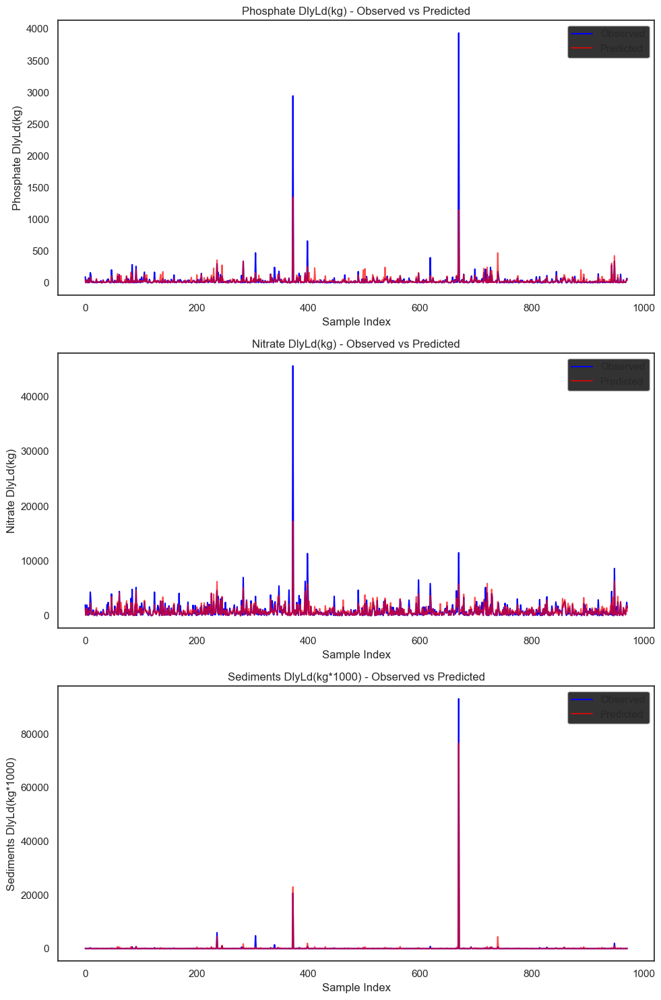

In [257]:
# Plotting the results
fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(10, 15))

for i, target in enumerate(targets):
    ax = axes[i]
    ax.plot(y_tests[target][target].values, label="Observed", color="blue")
    ax.plot(model_preds[target], label="Predicted", color="red", alpha=0.7)
    ax.set_xlabel("Sample Index")
    ax.set_ylabel(target)
    ax.set_title(f"{target} - Observed vs Predicted")
    ax.legend()

plt.tight_layout()
plt.show()


# SWAT Only Results

In [141]:
y_tests['Nitrate DlyLd(kg)']


,Nitrate DlyLd(kg)
5506,851.10580
5507,2120.54060
5508,1136.11860
5509,1059.18380
5510,2130.36680
...,...
6473,42.99360
6474,51.18740
6475,139.32640
6476,889.93360


In [4]:
import numpy as np


def nse_score(observed, simulated):
    """
    Calculate the Nash-Sutcliffe Efficiency (NSE) between observed and simulated data.

    Parameters:
    observed (array-like): Array of observed values.
    simulated (array-like): Array of simulated/predicted values.

    Returns:
    float: NSE value.
    """
    observed = np.asarray(observed)
    simulated = np.asarray(simulated)

    if observed.shape != simulated.shape:
        raise ValueError("Observed and simulated arrays must have the same shape.")

    numerator = np.sum((simulated - observed) ** 2)
    denominator = np.var(observed, ddof=1) * len(observed)

    nse = 1 - numerator / denominator
    return nse


In [5]:
import numpy as np


def pbias_score(observed, predicted):
    """
    Calculate the percentage difference between sum of observed and sum of predicted values.

    Parameters:
    observed (numpy.ndarray): Array of observed values
    predicted (numpy.ndarray): Array of predicted values

    Returns:
    float: Percentage difference: (sum(observed) - sum(predicted)) * 100 / sum(observed)
    """
    sum_observed = np.sum(observed)
    sum_predicted = np.sum(predicted)

    if sum_observed == 0:
        raise ValueError("Sum of observed values cannot be zero (division by zero)")

    percentage_diff = (sum_observed - sum_predicted) * 100 / sum_observed

    return percentage_diff


In [7]:
targets = [
    "Nitrate DlyLd(kg)",
    "Phosphate DlyLd(kg)",
    "Sediments DlyLd(kg*1000)"
]


In [11]:
swat_metrics = {}
for target in targets:
    date_aligned_df = pd.merge(
        water_quality_data_post_1993[["DATE", target]],
        swat_simulations_dfs[target],
        left_on="DATE",
        right_on="Date",
        how='right'
    ).drop(columns=["DATE"])
    
    # Ensure the Date column is in datetime format
    date_aligned_df["Date"] = pd.to_datetime(date_aligned_df["Date"])
    
    testing_period = date_aligned_df[(date_aligned_df["Date"] >= "2008-02-01") & (date_aligned_df["Date"] <= "2010-09-30")]
    r2 = r2_score(testing_period[target], testing_period[f"Calibrated_SWAT_{target}"])
    nse = nse_score(testing_period[target], testing_period[f"Calibrated_SWAT_{target}"])
    pbias = pbias_score(testing_period[target], testing_period[f"Calibrated_SWAT_{target}"])
    
    swat_metrics[target] = {
        "R2": r2,
        "NSE": nse,
        "PBIAS": pbias,
    }

swat_metrics_df = pd.DataFrame(swat_metrics).T
swat_metrics_df

,R2,NSE,PBIAS
Nitrate DlyLd(kg),0.009668,0.010686,2.817863
Phosphate DlyLd(kg),0.238517,0.239300,-25.340014
Sediments DlyLd(kg*1000),0.092480,0.093413,55.441915


In [12]:
from scipy.stats import pearsonr

def r_squared(observed, simulated):

    return pearsonr(observed, simulated)[0] ** 2

In [13]:
date_aligned_df


,Sediments DlyLd(kg*1000),Date,Calibrated_SWAT_Streamflow,Calibrated_SWAT_Sediments DlyLd(kg*1000),Calibrated_SWAT_Snowmelt
0,160.755731,1993-01-01,36.110,72.0400,0.029398
1,40.571564,1993-01-02,36.200,44.4200,0.000000
2,22.013847,1993-01-03,33.750,26.6100,0.000000
3,36.838848,1993-01-04,34.430,32.7800,3.790000
4,218.350895,1993-01-05,46.330,43.5200,1.194448
...,...,...,...,...,...
6472,3.006372,2010-09-26,1.093,0.8149,0.000000
6473,4.852436,2010-09-27,2.336,2.7360,0.000000
6474,5.639539,2010-09-28,3.154,3.8130,0.000000
6475,15.536208,2010-09-29,4.023,5.3260,0.000000


In [24]:
from sklearn.metrics import r2_score, mean_absolute_error, median_absolute_error

monthly_aggregate_swat_metrics = {}
swat_dfs = {}
for target in targets:
    date_aligned_df = pd.merge(
        water_quality_data_post_1993[["DATE", target]],
        swat_simulations_dfs[target],
        left_on="DATE",
        right_on="Date",
        how='right',
    ).drop(columns=["DATE"])
    # if target == 'Sediments DlyLd(kg*1000)':
    #     date_aligned_df = date_aligned_df[
    #         (date_aligned_df["Date"] < "2007-01-01")
    #     ]
    
    df = pd.DataFrame(
        {
            "date": date_aligned_df["Date"],
            "observed": date_aligned_df[target],
            "simulated": date_aligned_df[f"Calibrated_SWAT_{target}"],
        }
    )
    # Ensure the Date column is in datetime format
    df["date"] = pd.to_datetime(df["date"])
    df["month"] = df["date"].dt.to_period("M")
    
    
    monthly_df = (
        df.groupby("month")
        .agg(
            observed = ("observed", "sum"),
            simulated = ("simulated", "sum")
        )
        .reset_index()
    )
    
    swat_dfs[target] = monthly_df
    monthly_r2 = r2_score(monthly_df["observed"], monthly_df["simulated"])
    monthly_correlation = r_squared(monthly_df["observed"], monthly_df["simulated"])
    monthly_medae = median_absolute_error(monthly_df["observed"], monthly_df["simulated"])
    monthly_nse = nse_score(monthly_df["observed"], monthly_df["simulated"])
    monthly_pbias = pbias_score(monthly_df["observed"], monthly_df["simulated"])

    monthly_aggregate_swat_metrics[target] = {
        "R2": monthly_r2,
        "Correlation": monthly_correlation,
        # "MEDAE": monthly_medae,
        "NSE": monthly_nse,
        "PBIAS": monthly_pbias,
    }

monthly_aggregate_swat_metrics_df = pd.DataFrame(monthly_aggregate_swat_metrics).T
monthly_aggregate_swat_metrics_df


,R2,Correlation,NSE,PBIAS
Nitrate DlyLd(kg),0.429960,0.524988,0.432636,26.509712
Phosphate DlyLd(kg),0.555361,0.560880,0.557448,-8.406456
Sediments DlyLd(kg*1000),0.225880,0.376002,0.229514,28.165411


In [25]:
monthly_df[monthly_df["month"] >= "2008-02"]

,month,observed,simulated
181,2008-02,17928.690964,2413.91200
182,2008-03,35119.124385,4963.03100
183,2008-04,1153.361546,1508.98000
184,2008-05,119.563113,896.45000
185,2008-06,44.812507,694.13000
186,2008-07,1158.943686,2051.35200
187,2008-08,55.236420,600.61700
188,2008-09,50.935936,660.59000
189,2008-10,421.548506,1087.55700
190,2008-11,571.529581,812.50900


In [26]:
test_df = monthly_df[monthly_df["month"] >= "2008-02"]
sediments_metrics = {}
sediments_metrics['R2'] = r2_score(test_df["observed"], test_df["simulated"])
sediments_metrics['Correlation'] = r_squared(test_df["observed"], test_df["simulated"])
sediments_metrics['NSE'] = nse_score(test_df["observed"], test_df["simulated"])
sediments_metrics['PBIAS'] = pbias_score(test_df["observed"], test_df["simulated"])
sediments_metrics


{'R2': 0.1316536140543748,
 'Correlation': 0.6858189182667048,
 'NSE': 0.15878943861517558,
 'PBIAS': 55.44191490861843}

In [253]:
monthly_df.to_excel("data/monthly_aggregate_swat_metrics_df.xlsx")



Weekly R2 for Phosphate DlyLd(kg): 0.3869552871136016
Weekly NSE for Phosphate DlyLd(kg): 0.37896544123452314
Weekly PBIAS for Phosphate DlyLd(kg): 20.920561770842244


Weekly R2 for Nitrate DlyLd(kg): 0.22820225169146946
Weekly NSE for Nitrate DlyLd(kg): 0.43002022511653704
Weekly PBIAS for Nitrate DlyLd(kg): -2.8671960562905205


Weekly R2 for Sediments DlyLd(kg*1000): 0.1394757523868747
Weekly NSE for Sediments DlyLd(kg*1000): -65.86811719586689
Weekly PBIAS for Sediments DlyLd(kg*1000): -121.49375142492535


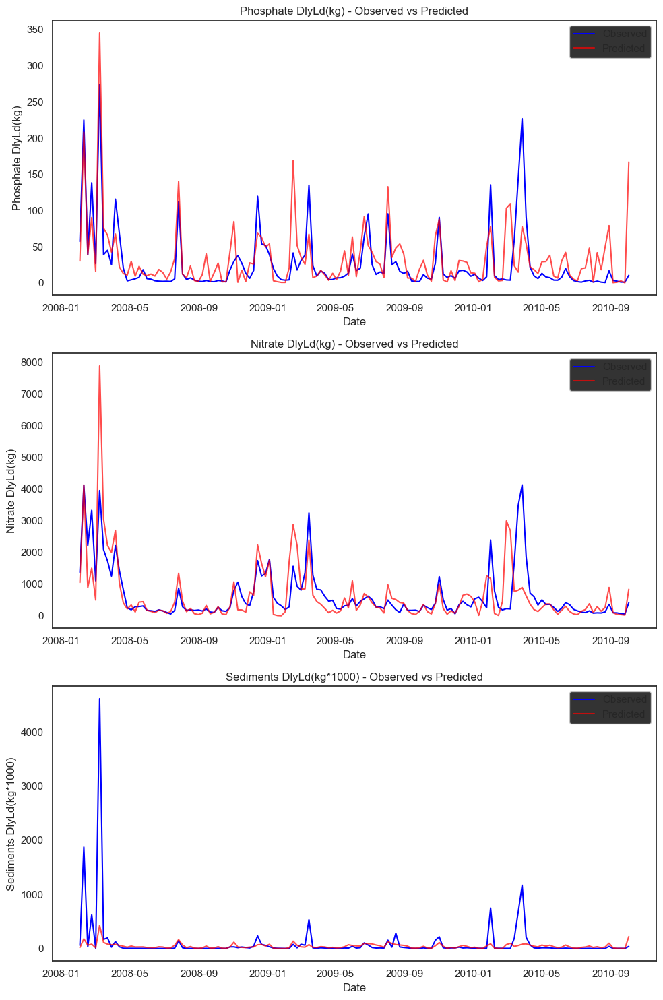

In [ ]:

# plot the observed vs simulated values
fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(10, 15))

date_aligned_dfs = {}
for i, target in enumerate(targets):
    date_aligned_df = pd.merge(
        water_quality_data_post_1993[["DATE", target]],
        calibrated_swat_simulations_df,
        left_on="DATE",
        right_on="Date",
    ).drop(columns=["DATE"])
    date_aligned_dfs[target] = pd.DataFrame(
        {
            "Date": date_aligned_df["Date"],
            "Observed": date_aligned_df[target],
            "Predicted": date_aligned_df[f"Calibrated_SWAT_{target}"],
        },
        index=date_aligned_df.index,
    )
    date_aligned_dfs[target]["Date"] = pd.to_datetime(date_aligned_dfs[target]["Date"])
    date_aligned_dfs[target] = date_aligned_dfs[target][
        (date_aligned_dfs[target]["Date"] >= "2008-02-01")
        & (date_aligned_dfs[target]["Date"] <= "2010-09-30")
    ]
    date_aligned_dfs[target].set_index("Date", inplace=True)
    weekly_df = date_aligned_dfs[target].resample("W").mean()
    date_aligned_dfs[target] = weekly_df

   
    weekly_r2 = r2_score(date_aligned_dfs[target]["Observed"], date_aligned_dfs[target]["Predicted"])
    weekly_nse = nse_score(date_aligned_dfs[target]["Observed"], date_aligned_dfs[target]["Predicted"])
    weekly_pbias = pbias_score(date_aligned_dfs[target]["Observed"], date_aligned_dfs[target]["Predicted"])
    print('\n')

    print(f"Weekly R2 for {target}: {weekly_r2}")
    print(f"Weekly NSE for {target}: {weekly_nse}")
    print(f"Weekly PBIAS for {target}: {weekly_pbias}")

    ax = axes[i]
    ax.plot(date_aligned_dfs[target].index, date_aligned_dfs[target]["Observed"], label="Observed", color="blue")
    ax.plot(date_aligned_dfs[target].index, date_aligned_dfs[target]["Predicted"], label="Predicted", color="red", alpha=0.7)
    ax.set_xlabel("Date")
    ax.set_ylabel(target)

    ax.set_title(f"{target} - Observed vs Predicted")
    ax.legend()

plt.tight_layout()
plt.show()

In [110]:
calibrated_swat_simulations_df.columns

Index(['Date', 'Calibrated_SWAT_Streamflow',
       'Calibrated_SWAT_Sediments DlyLd(kg*1000)',
       'Calibrated_SWAT_Nitrate DlyLd(kg)',
       'Calibrated_SWAT_Phosphate DlyLd(kg)'],
      dtype='object')

In [108]:
water_quality_data_post_1993[["DATE", target]]

,DATE,Sediments DlyLd(kg*1000)
458,1993-01-01,160.755731
459,1993-01-02,40.571564
460,1993-01-03,22.013847
461,1993-01-04,36.838848
462,1993-01-05,218.350895
...,...,...
6935,2010-09-26,3.006372
6936,2010-09-27,4.852436
6937,2010-09-28,5.639539
6938,2010-09-29,15.536208


In [102]:
calibrated_swat_simulations_df

# y_tests

,Date,Calibrated_SWAT_Streamflow,Calibrated_SWAT_Sediments DlyLd(kg*1000),Calibrated_SWAT_Nitrate DlyLd(kg),Calibrated_SWAT_Phosphate DlyLd(kg)
0,1993-01-01,36.110,72.0400,874.90,49.8900
1,1993-01-02,36.200,44.4200,232.20,17.2600
2,1993-01-03,33.750,26.6100,1133.00,39.9900
3,1993-01-04,34.430,32.7800,1213.00,72.1200
4,1993-01-05,46.330,43.5200,1135.00,116.7000
...,...,...,...,...,...
6477,2010-09-26,1.093,0.8149,17.45,0.2327
6478,2010-09-27,2.336,2.7360,66.74,11.9800
6479,2010-09-28,3.154,3.8130,88.67,16.6600
6480,2010-09-29,4.023,5.3260,150.10,21.2600


# Run Analysis

In [160]:
runs = pd.read_csv("initial_experiment_runs.csv")
runs= runs[['Name', "R2"]]
# remove runs at indices 1 and 2
runs.drop([1, 2], inplace=True)

In [161]:
runs

,Name,R2
0,Phosphate_Calibrated_SWAT_Streamflow_Phys_base...,0.685900
3,Phosphate_Calibrated_SWAT_Streamflow_Ind_Water...,0.535194
4,Phosphate_Calibrated_SWAT_Streamflow_Water_Qua...,0.534998
5,Phosphate_rf_uncal_swat,0.523829
6,Phosphate_Calibrated_SWAT_Only_Streamflow_rf,0.516468
7,Phosphate_Uncal_SWAT_Only_Streamflow_rf,0.495627
8,Phosphate_Calibrated_SWAT_Water_Quality_No_Str...,0.438168
9,Phosphate_Calibrated_SWAT_Ind_Water_Quality_No...,0.299409
10,Phosphate_Uncal_SWAT_WaterQuality_No_Streamflo...,0.282378
11,Phosphate_rf_no_swat_no_streamflow,0.126132
